In [14]:
import os
import re
import cv2
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from glob import glob
from tqdm import tqdm
from pathlib import Path
from shapely import Polygon
from shapely.ops import unary_union
from shapely.geometry import LineString

from utils import get_biggest_contour

In [15]:
age = pd.read_csv('BeeLevel_AgeLookupTable.csv', index_col=0)
bee_type = pd.read_csv('BeeID_ActivityStatus.csv', index_col=0)
age['Hive'] = age['Hive'].map(lambda x: int(x))
age['BeeID'] = age['BeeID'].map(lambda x: x.replace('wwww','ww'))
bee_type['BeeID'] = bee_type['BeeID'].map(lambda x: x.replace('wwww','ww'))
bee_type = bee_type.set_index(['Hive','BeeID'])['Bee_type']
age = age.set_index(['Hive','BeeID','Date'])['Age']

damaged = pd.read_csv('live_bees_damaged.csv', index_col=0)
height = pd.read_csv('live_bees_height_pixels.csv',index_col=0)

In [16]:
# We skip these wings - either there was an issue with the segmentation, or we cannot see all the cells from the image
# that easily
problem_wings = [
 '2024_06_05_h01bee19.png',
 '2024_06_05_h01bee27.png',
 '2024_06_05_h01bee32.png',
 '2024_06_05_h01bee45.png',
 '2024_06_06_h05bee07.png',
 '2024_06_06_h05bee11.png',
 '2024_06_07_h02bee03.png',
 '2024_06_07_h02bee34.png',
 '2024_06_07_h02bee38.png',
 '2024_06_10_h02b32.png',
 '2024_07_23_h21b28.png',
 ] 



In [17]:
name_to_class = {'FWL':1, 'MC':2, '1sMC':3, '2sMC':4,'3sMC':5,'2MdC':6}
class_to_name = {1:'FWL',2:'MC',3:'1sMC',4:'2sMC',5:'3sMC',6:'2MdC'}

In [18]:
def get_area_diff_fourier_approx(cell, n_discrete_points=1000, n_pos_circles=4, n_estimation_points=1000):
    # This is the number of equally spaced points to use to approximate the integration of the
    # shape we are approximating
    #n_discrete_points = 1000
    # This is the number of 'positive' circles to approximate the shape with
    #n_pos_circles = 4
    
    #n_estimation_points = 1000

    # Strange things happen if we approximate the function with more circles than we discretized the points with...
    # pretty though!
    if n_pos_circles > n_discrete_points:
        print('WARNING! STRANGE AND POSSIBLY PRETTY THINGS WILL HAPPEN....')
    
    outline = cell.boundary
    
    
    distance_delta = outline.length / n_discrete_points
    distances = np.arange(0, outline.length, distance_delta)
    points = [outline.interpolate(distance) for distance in distances]
    multipoint = unary_union(points)
    
    complex_points = [p.x + p.y*1j for p in points]
    t_delta = 1 / n_discrete_points
    times = np.arange(0, 1, t_delta)
    
    if len(times) + 1 == len(complex_points):
        times = np.append(times, [1])
    
    
    cs = {}
    for n in range(-n_pos_circles,n_pos_circles+1):
        cs[n] = np.multiply(t_delta, np.multiply(complex_points, np.e**(-2*np.pi*1j*n*times))).sum()
    cs
    
    t_delta = 1 / n_estimation_points
    times = np.arange(0, 1, t_delta)
    
    fts = []
    for t in times:
        ft = 0
        for n in range(-n_pos_circles,n_pos_circles+1):
            ft += np.multiply(cs[n], np.e**(-2*np.pi*1j*n*t))
                              
        fts += [ft]
    fts = np.array(fts)

    approximation = Polygon([(x.real, x.imag) for x in fts])
    area_difference = ((approximation - cell).area + (cell - approximation).area)
    return area_difference / cell.area

In [28]:
fps = glob('../2_live_bees/9_UNet_predictions_resized_final/*')

out = []
for fp in tqdm(fps):
    fn = Path(fp).name

    if fn.startswith('Hive'):
        continue
    
    if fn in problem_wings:
        continue
    
    date = '-'.join(fn.split('_')[:-1])
    date = pd.to_datetime(date, format='%Y-%m-%d').date()
    hive_id = int(re.findall('(?<=h).*(?=b)', fn)[0])
    bee_id = 'ww' + re.findall('(?<=b).*(?=\\.)', fn)[0].replace('-deformedWing','').replace('deformed','').replace('dead','').replace('e','').replace('X','')
    x = 'X' in fn.replace('dead','X').replace('deformed','X')
    
    cells_mask = cv2.imread('../semantic_seg/wings/predictions_resized/' + fn, cv2.IMREAD_GRAYSCALE)
    #plt.imshow(cells_mask*40)

    metadata_fp = '../2_live_bees/5_size_metadata/' + fn.replace('.png','.json')
    with open(metadata_fp, 'r') as f:
        metadata = json.load(f)
    pixels_per_mm = metadata['pixels_per_cm']/10
    pixels_per_mm_max = pixels_per_mm
    pixels_per_mm_min = pixels_per_mm*0.95

    
    metadata_fp = '../2_live_bees/3_card_mask_matches_metadata/' + fn.replace('.png','.json')
    with open(metadata_fp, 'r') as f:
        metadata = json.load(f)
    wing_side = 'L' if metadata['wing_side'] == 'left' else 'R'

    height_pixels = height.set_index('Filename').loc[fn].values[0]
    H = height_pixels / pixels_per_mm
    H_max = height_pixels / pixels_per_mm_min
    H_min = height_pixels / pixels_per_mm_max

    for cell_class in range(1,7):
        cell_name = class_to_name[cell_class]
        cell_mask = np.zeros(cells_mask.shape).astype('uint8')
        cell_mask[np.where(cells_mask == cell_class)] = 1
        biggest_contour = get_biggest_contour(cell_mask)

        #convert to polygon because i suspect this will make the calculation of the perimeter more accurate
        poly = Polygon(biggest_contour.squeeze())

        pixel_area_min = poly.area*0.96
        pixel_area_max = poly.area*1.04
        
        area = np.round(poly.area / (pixels_per_mm)**2,3)
        area_min = np.round(pixel_area_min / (pixels_per_mm_max)**2,3)
        area_max = np.round(pixel_area_max / (pixels_per_mm_min)**2,3)

        pixel_perimeter_min = poly.length*0.96
        pixel_perimeter_max = poly.length*1.04
        
        perimeter = np.round(poly.length / pixels_per_mm,3)
        perimeter_min = np.round(pixel_perimeter_min / pixels_per_mm_max,3)
        perimeter_max = np.round(pixel_perimeter_max / pixels_per_mm_min,3)

        #print(cell_class, area, area_min, area_max, perimeter, perimeter_min, perimeter_max)

        cell_circle_area_diffs = []
        if cell_class == 1:
            for n_pos_circles in range(1,31):
                try:
                    cell_circle_area_diffs += [get_area_diff_fourier_approx(poly, n_pos_circles=n_pos_circles, n_discrete_points=1000, n_estimation_points=1000)]
                except:
                    print('Getting Fourier Circles Failed!', fn, cell_name, n_pos_circles)
                    cell_circle_area_diffs += [np.nan]
        out += [[fn, hive_id, bee_id, date, wing_side, x, H, H_min, H_max, cell_name, cell_circle_area_diffs, area, area_min, area_max, perimeter, perimeter_min, perimeter_max]]

poly.area, poly.length
print(pixels_per_mm)


  0%|                                                                                                                                                          | 0/1182 [00:00<?, ?it/s]

Getting Fourier Circles Failed! 2024_07_09_h22b01.png FWL 19
Getting Fourier Circles Failed! 2024_07_09_h22b01.png FWL 20
Getting Fourier Circles Failed! 2024_07_09_h22b01.png FWL 21
Getting Fourier Circles Failed! 2024_07_09_h22b01.png FWL 22
Getting Fourier Circles Failed! 2024_07_09_h22b01.png FWL 23
Getting Fourier Circles Failed! 2024_07_09_h22b01.png FWL 24
Getting Fourier Circles Failed! 2024_07_09_h22b01.png FWL 25
Getting Fourier Circles Failed! 2024_07_09_h22b01.png FWL 26
Getting Fourier Circles Failed! 2024_07_09_h22b01.png FWL 27
Getting Fourier Circles Failed! 2024_07_09_h22b01.png FWL 28


  0%|                                                                                                                                                  | 1/1182 [00:02<56:45,  2.88s/it]

Getting Fourier Circles Failed! 2024_07_09_h22b01.png FWL 29
Getting Fourier Circles Failed! 2024_07_09_h22b01.png FWL 30


  3%|████                                                                                                                                             | 33/1182 [01:26<54:23,  2.84s/it]

Getting Fourier Circles Failed! 2024_06_14_h03b03.png FWL 25
Getting Fourier Circles Failed! 2024_06_14_h03b03.png FWL 26
Getting Fourier Circles Failed! 2024_06_14_h03b03.png FWL 27
Getting Fourier Circles Failed! 2024_06_14_h03b03.png FWL 28


  3%|████▏                                                                                                                                            | 34/1182 [01:28<53:17,  2.79s/it]

Getting Fourier Circles Failed! 2024_06_14_h03b03.png FWL 29
Getting Fourier Circles Failed! 2024_06_14_h03b03.png FWL 30


  4%|█████▍                                                                                                                                           | 44/1182 [01:55<51:36,  2.72s/it]

Getting Fourier Circles Failed! 2024_07_02_h13b03.png FWL 23
Getting Fourier Circles Failed! 2024_07_02_h13b03.png FWL 24
Getting Fourier Circles Failed! 2024_07_02_h13b03.png FWL 25
Getting Fourier Circles Failed! 2024_07_02_h13b03.png FWL 26
Getting Fourier Circles Failed! 2024_07_02_h13b03.png FWL 27
Getting Fourier Circles Failed! 2024_07_02_h13b03.png FWL 28


  4%|█████▌                                                                                                                                           | 45/1182 [01:58<52:13,  2.76s/it]

Getting Fourier Circles Failed! 2024_07_02_h13b03.png FWL 29
Getting Fourier Circles Failed! 2024_07_02_h13b03.png FWL 30
Getting Fourier Circles Failed! 2024_06_20_h03b20.png FWL 20
Getting Fourier Circles Failed! 2024_06_20_h03b20.png FWL 21
Getting Fourier Circles Failed! 2024_06_20_h03b20.png FWL 22
Getting Fourier Circles Failed! 2024_06_20_h03b20.png FWL 23
Getting Fourier Circles Failed! 2024_06_20_h03b20.png FWL 24
Getting Fourier Circles Failed! 2024_06_20_h03b20.png FWL 25
Getting Fourier Circles Failed! 2024_06_20_h03b20.png FWL 26
Getting Fourier Circles Failed! 2024_06_20_h03b20.png FWL 27
Getting Fourier Circles Failed! 2024_06_20_h03b20.png FWL 28
Getting Fourier Circles Failed! 2024_06_20_h03b20.png FWL 29


  4%|█████▋                                                                                                                                           | 46/1182 [02:01<51:32,  2.72s/it]

Getting Fourier Circles Failed! 2024_06_20_h03b20.png FWL 30
Getting Fourier Circles Failed! 2024_07_09_h13b15.png FWL 19
Getting Fourier Circles Failed! 2024_07_09_h13b15.png FWL 20
Getting Fourier Circles Failed! 2024_07_09_h13b15.png FWL 21
Getting Fourier Circles Failed! 2024_07_09_h13b15.png FWL 22
Getting Fourier Circles Failed! 2024_07_09_h13b15.png FWL 23
Getting Fourier Circles Failed! 2024_07_09_h13b15.png FWL 24
Getting Fourier Circles Failed! 2024_07_09_h13b15.png FWL 25
Getting Fourier Circles Failed! 2024_07_09_h13b15.png FWL 26
Getting Fourier Circles Failed! 2024_07_09_h13b15.png FWL 27
Getting Fourier Circles Failed! 2024_07_09_h13b15.png FWL 28


  4%|█████▊                                                                                                                                           | 47/1182 [02:03<51:38,  2.73s/it]

Getting Fourier Circles Failed! 2024_07_09_h13b15.png FWL 29
Getting Fourier Circles Failed! 2024_07_09_h13b15.png FWL 30


  5%|███████                                                                                                                                          | 58/1182 [02:32<48:51,  2.61s/it]

Getting Fourier Circles Failed! 2024_07_04_h14b40.png FWL 21
Getting Fourier Circles Failed! 2024_07_04_h14b40.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h14b40.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h14b40.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h14b40.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h14b40.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h14b40.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h14b40.png FWL 28


  5%|███████▏                                                                                                                                         | 59/1182 [02:35<48:59,  2.62s/it]

Getting Fourier Circles Failed! 2024_07_04_h14b40.png FWL 29
Getting Fourier Circles Failed! 2024_07_04_h14b40.png FWL 30


  6%|████████▏                                                                                                                                        | 67/1182 [02:55<48:07,  2.59s/it]

Getting Fourier Circles Failed! 2024_07_19_h35b51.png FWL 24
Getting Fourier Circles Failed! 2024_07_19_h35b51.png FWL 25
Getting Fourier Circles Failed! 2024_07_19_h35b51.png FWL 26
Getting Fourier Circles Failed! 2024_07_19_h35b51.png FWL 27
Getting Fourier Circles Failed! 2024_07_19_h35b51.png FWL 28
Getting Fourier Circles Failed! 2024_07_19_h35b51.png FWL 29


  6%|████████▎                                                                                                                                        | 68/1182 [02:58<50:18,  2.71s/it]

Getting Fourier Circles Failed! 2024_07_19_h35b51.png FWL 30


  6%|█████████▏                                                                                                                                       | 75/1182 [03:16<49:12,  2.67s/it]

Getting Fourier Circles Failed! 2024_06_13_h05b10.png FWL 24
Getting Fourier Circles Failed! 2024_06_13_h05b10.png FWL 25
Getting Fourier Circles Failed! 2024_06_13_h05b10.png FWL 26
Getting Fourier Circles Failed! 2024_06_13_h05b10.png FWL 27
Getting Fourier Circles Failed! 2024_06_13_h05b10.png FWL 28
Getting Fourier Circles Failed! 2024_06_13_h05b10.png FWL 29


  6%|█████████▎                                                                                                                                       | 76/1182 [03:19<50:37,  2.75s/it]

Getting Fourier Circles Failed! 2024_06_13_h05b10.png FWL 30


  7%|█████████▋                                                                                                                                       | 79/1182 [03:27<46:39,  2.54s/it]

Getting Fourier Circles Failed! 2024_06_28_h13b03.png FWL 21
Getting Fourier Circles Failed! 2024_06_28_h13b03.png FWL 22
Getting Fourier Circles Failed! 2024_06_28_h13b03.png FWL 23
Getting Fourier Circles Failed! 2024_06_28_h13b03.png FWL 24
Getting Fourier Circles Failed! 2024_06_28_h13b03.png FWL 25
Getting Fourier Circles Failed! 2024_06_28_h13b03.png FWL 26
Getting Fourier Circles Failed! 2024_06_28_h13b03.png FWL 27
Getting Fourier Circles Failed! 2024_06_28_h13b03.png FWL 28


  7%|█████████▊                                                                                                                                       | 80/1182 [03:30<49:13,  2.68s/it]

Getting Fourier Circles Failed! 2024_06_28_h13b03.png FWL 29
Getting Fourier Circles Failed! 2024_06_28_h13b03.png FWL 30


  7%|██████████▋                                                                                                                                      | 87/1182 [03:47<46:54,  2.57s/it]

Getting Fourier Circles Failed! 2024_07_04_h24b25.png FWL 20
Getting Fourier Circles Failed! 2024_07_04_h24b25.png FWL 21
Getting Fourier Circles Failed! 2024_07_04_h24b25.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h24b25.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h24b25.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h24b25.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h24b25.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h24b25.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h24b25.png FWL 28
Getting Fourier Circles Failed! 2024_07_04_h24b25.png FWL 29


  7%|██████████▊                                                                                                                                      | 88/1182 [03:50<46:40,  2.56s/it]

Getting Fourier Circles Failed! 2024_07_04_h24b25.png FWL 30


  9%|████████████▍                                                                                                                                   | 102/1182 [04:28<49:49,  2.77s/it]

Getting Fourier Circles Failed! 2024_06_26_h11b27.png FWL 21
Getting Fourier Circles Failed! 2024_06_26_h11b27.png FWL 22
Getting Fourier Circles Failed! 2024_06_26_h11b27.png FWL 23
Getting Fourier Circles Failed! 2024_06_26_h11b27.png FWL 24
Getting Fourier Circles Failed! 2024_06_26_h11b27.png FWL 25
Getting Fourier Circles Failed! 2024_06_26_h11b27.png FWL 26
Getting Fourier Circles Failed! 2024_06_26_h11b27.png FWL 27
Getting Fourier Circles Failed! 2024_06_26_h11b27.png FWL 28
Getting Fourier Circles Failed! 2024_06_26_h11b27.png FWL 29


  9%|████████████▌                                                                                                                                   | 103/1182 [04:31<49:23,  2.75s/it]

Getting Fourier Circles Failed! 2024_06_26_h11b27.png FWL 30
Getting Fourier Circles Failed! 2024_06_24_h02b31.png FWL 18
Getting Fourier Circles Failed! 2024_06_24_h02b31.png FWL 20
Getting Fourier Circles Failed! 2024_06_24_h02b31.png FWL 21
Getting Fourier Circles Failed! 2024_06_24_h02b31.png FWL 22
Getting Fourier Circles Failed! 2024_06_24_h02b31.png FWL 23
Getting Fourier Circles Failed! 2024_06_24_h02b31.png FWL 24
Getting Fourier Circles Failed! 2024_06_24_h02b31.png FWL 25
Getting Fourier Circles Failed! 2024_06_24_h02b31.png FWL 26
Getting Fourier Circles Failed! 2024_06_24_h02b31.png FWL 27
Getting Fourier Circles Failed! 2024_06_24_h02b31.png FWL 28


  9%|████████████▋                                                                                                                                   | 104/1182 [04:34<50:15,  2.80s/it]

Getting Fourier Circles Failed! 2024_06_24_h02b31.png FWL 29
Getting Fourier Circles Failed! 2024_06_24_h02b31.png FWL 30


  9%|█████████████▍                                                                                                                                  | 110/1182 [04:52<51:48,  2.90s/it]

Getting Fourier Circles Failed! 2024_07_23_h35b04.png FWL 18
Getting Fourier Circles Failed! 2024_07_23_h35b04.png FWL 19
Getting Fourier Circles Failed! 2024_07_23_h35b04.png FWL 20
Getting Fourier Circles Failed! 2024_07_23_h35b04.png FWL 21
Getting Fourier Circles Failed! 2024_07_23_h35b04.png FWL 22
Getting Fourier Circles Failed! 2024_07_23_h35b04.png FWL 23
Getting Fourier Circles Failed! 2024_07_23_h35b04.png FWL 24
Getting Fourier Circles Failed! 2024_07_23_h35b04.png FWL 25
Getting Fourier Circles Failed! 2024_07_23_h35b04.png FWL 26
Getting Fourier Circles Failed! 2024_07_23_h35b04.png FWL 27
Getting Fourier Circles Failed! 2024_07_23_h35b04.png FWL 28
Getting Fourier Circles Failed! 2024_07_23_h35b04.png FWL 29


  9%|█████████████▌                                                                                                                                  | 111/1182 [04:55<54:21,  3.04s/it]

Getting Fourier Circles Failed! 2024_07_23_h35b04.png FWL 30
Getting Fourier Circles Failed! 2024_07_12_h25b16.png FWL 19
Getting Fourier Circles Failed! 2024_07_12_h25b16.png FWL 20
Getting Fourier Circles Failed! 2024_07_12_h25b16.png FWL 21
Getting Fourier Circles Failed! 2024_07_12_h25b16.png FWL 22
Getting Fourier Circles Failed! 2024_07_12_h25b16.png FWL 23
Getting Fourier Circles Failed! 2024_07_12_h25b16.png FWL 24
Getting Fourier Circles Failed! 2024_07_12_h25b16.png FWL 25
Getting Fourier Circles Failed! 2024_07_12_h25b16.png FWL 26
Getting Fourier Circles Failed! 2024_07_12_h25b16.png FWL 27
Getting Fourier Circles Failed! 2024_07_12_h25b16.png FWL 28


  9%|█████████████▋                                                                                                                                  | 112/1182 [04:58<54:03,  3.03s/it]

Getting Fourier Circles Failed! 2024_07_12_h25b16.png FWL 29
Getting Fourier Circles Failed! 2024_07_12_h25b16.png FWL 30
Getting Fourier Circles Failed! 2024_07_19_h35b24.png FWL 24
Getting Fourier Circles Failed! 2024_07_19_h35b24.png FWL 25
Getting Fourier Circles Failed! 2024_07_19_h35b24.png FWL 26
Getting Fourier Circles Failed! 2024_07_19_h35b24.png FWL 27
Getting Fourier Circles Failed! 2024_07_19_h35b24.png FWL 28
Getting Fourier Circles Failed! 2024_07_19_h35b24.png FWL 29


 10%|█████████████▊                                                                                                                                  | 113/1182 [05:01<53:15,  2.99s/it]

Getting Fourier Circles Failed! 2024_07_19_h35b24.png FWL 30


 10%|█████████████▉                                                                                                                                  | 114/1182 [05:04<52:57,  2.97s/it]

Getting Fourier Circles Failed! 2024_07_19_h35b57.png FWL 21
Getting Fourier Circles Failed! 2024_07_19_h35b57.png FWL 22
Getting Fourier Circles Failed! 2024_07_19_h35b57.png FWL 23
Getting Fourier Circles Failed! 2024_07_19_h35b57.png FWL 24
Getting Fourier Circles Failed! 2024_07_19_h35b57.png FWL 25
Getting Fourier Circles Failed! 2024_07_19_h35b57.png FWL 26
Getting Fourier Circles Failed! 2024_07_19_h35b57.png FWL 27
Getting Fourier Circles Failed! 2024_07_19_h35b57.png FWL 28


 10%|██████████████                                                                                                                                  | 115/1182 [05:07<51:43,  2.91s/it]

Getting Fourier Circles Failed! 2024_07_19_h35b57.png FWL 29
Getting Fourier Circles Failed! 2024_07_19_h35b57.png FWL 30


 10%|██████████████▊                                                                                                                                 | 122/1182 [05:27<51:03,  2.89s/it]

Getting Fourier Circles Failed! 2024_06_26_h11b07.png FWL 22
Getting Fourier Circles Failed! 2024_06_26_h11b07.png FWL 23
Getting Fourier Circles Failed! 2024_06_26_h11b07.png FWL 24
Getting Fourier Circles Failed! 2024_06_26_h11b07.png FWL 25
Getting Fourier Circles Failed! 2024_06_26_h11b07.png FWL 26
Getting Fourier Circles Failed! 2024_06_26_h11b07.png FWL 27
Getting Fourier Circles Failed! 2024_06_26_h11b07.png FWL 28
Getting Fourier Circles Failed! 2024_06_26_h11b07.png FWL 29


 10%|██████████████▉                                                                                                                                 | 123/1182 [05:30<51:36,  2.92s/it]

Getting Fourier Circles Failed! 2024_06_26_h11b07.png FWL 30


 10%|███████████████                                                                                                                                 | 124/1182 [05:33<50:12,  2.85s/it]

Getting Fourier Circles Failed! 2024_07_03_h25b14.png FWL 21
Getting Fourier Circles Failed! 2024_07_03_h25b14.png FWL 22
Getting Fourier Circles Failed! 2024_07_03_h25b14.png FWL 23
Getting Fourier Circles Failed! 2024_07_03_h25b14.png FWL 24
Getting Fourier Circles Failed! 2024_07_03_h25b14.png FWL 25
Getting Fourier Circles Failed! 2024_07_03_h25b14.png FWL 26
Getting Fourier Circles Failed! 2024_07_03_h25b14.png FWL 27
Getting Fourier Circles Failed! 2024_07_03_h25b14.png FWL 28


 11%|███████████████▏                                                                                                                                | 125/1182 [05:36<50:14,  2.85s/it]

Getting Fourier Circles Failed! 2024_07_03_h25b14.png FWL 29
Getting Fourier Circles Failed! 2024_07_03_h25b14.png FWL 30


 11%|███████████████▎                                                                                                                                | 126/1182 [05:38<48:40,  2.77s/it]

Getting Fourier Circles Failed! 2024_07_08_h12b10.png FWL 20
Getting Fourier Circles Failed! 2024_07_08_h12b10.png FWL 21
Getting Fourier Circles Failed! 2024_07_08_h12b10.png FWL 22
Getting Fourier Circles Failed! 2024_07_08_h12b10.png FWL 23
Getting Fourier Circles Failed! 2024_07_08_h12b10.png FWL 24
Getting Fourier Circles Failed! 2024_07_08_h12b10.png FWL 25
Getting Fourier Circles Failed! 2024_07_08_h12b10.png FWL 26
Getting Fourier Circles Failed! 2024_07_08_h12b10.png FWL 27
Getting Fourier Circles Failed! 2024_07_08_h12b10.png FWL 28
Getting Fourier Circles Failed! 2024_07_08_h12b10.png FWL 29


 11%|███████████████▍                                                                                                                                | 127/1182 [05:41<48:43,  2.77s/it]

Getting Fourier Circles Failed! 2024_07_08_h12b10.png FWL 30


 11%|███████████████▋                                                                                                                                | 129/1182 [05:46<48:04,  2.74s/it]

Getting Fourier Circles Failed! 2024_06_21_h05b77.png FWL 21
Getting Fourier Circles Failed! 2024_06_21_h05b77.png FWL 22
Getting Fourier Circles Failed! 2024_06_21_h05b77.png FWL 23
Getting Fourier Circles Failed! 2024_06_21_h05b77.png FWL 24
Getting Fourier Circles Failed! 2024_06_21_h05b77.png FWL 25
Getting Fourier Circles Failed! 2024_06_21_h05b77.png FWL 26
Getting Fourier Circles Failed! 2024_06_21_h05b77.png FWL 27
Getting Fourier Circles Failed! 2024_06_21_h05b77.png FWL 28


 11%|███████████████▊                                                                                                                                | 130/1182 [05:49<47:37,  2.72s/it]

Getting Fourier Circles Failed! 2024_06_21_h05b77.png FWL 29
Getting Fourier Circles Failed! 2024_06_21_h05b77.png FWL 30


 11%|███████████████▉                                                                                                                                | 131/1182 [05:52<46:36,  2.66s/it]

Getting Fourier Circles Failed! 2024_06_18_h02b62.png FWL 20
Getting Fourier Circles Failed! 2024_06_18_h02b62.png FWL 21
Getting Fourier Circles Failed! 2024_06_18_h02b62.png FWL 22
Getting Fourier Circles Failed! 2024_06_18_h02b62.png FWL 23
Getting Fourier Circles Failed! 2024_06_18_h02b62.png FWL 24
Getting Fourier Circles Failed! 2024_06_18_h02b62.png FWL 25
Getting Fourier Circles Failed! 2024_06_18_h02b62.png FWL 26
Getting Fourier Circles Failed! 2024_06_18_h02b62.png FWL 27
Getting Fourier Circles Failed! 2024_06_18_h02b62.png FWL 28
Getting Fourier Circles Failed! 2024_06_18_h02b62.png FWL 29


 11%|████████████████                                                                                                                                | 132/1182 [05:54<47:18,  2.70s/it]

Getting Fourier Circles Failed! 2024_06_18_h02b62.png FWL 30


 12%|████████████████▌                                                                                                                               | 136/1182 [06:05<47:12,  2.71s/it]

Getting Fourier Circles Failed! 2024_07_04_h22b03.png FWL 19
Getting Fourier Circles Failed! 2024_07_04_h22b03.png FWL 20
Getting Fourier Circles Failed! 2024_07_04_h22b03.png FWL 21
Getting Fourier Circles Failed! 2024_07_04_h22b03.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h22b03.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h22b03.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h22b03.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h22b03.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h22b03.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h22b03.png FWL 28


 12%|████████████████▋                                                                                                                               | 137/1182 [06:08<47:29,  2.73s/it]

Getting Fourier Circles Failed! 2024_07_04_h22b03.png FWL 29
Getting Fourier Circles Failed! 2024_07_04_h22b03.png FWL 30


 12%|█████████████████▋                                                                                                                              | 145/1182 [06:29<45:18,  2.62s/it]

Getting Fourier Circles Failed! 2024_07_04_h14b22.png FWL 21
Getting Fourier Circles Failed! 2024_07_04_h14b22.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h14b22.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h14b22.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h14b22.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h14b22.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h14b22.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h14b22.png FWL 28


 12%|█████████████████▊                                                                                                                              | 146/1182 [06:32<45:58,  2.66s/it]

Getting Fourier Circles Failed! 2024_07_04_h14b22.png FWL 29
Getting Fourier Circles Failed! 2024_07_04_h14b22.png FWL 30


 13%|██████████████████▍                                                                                                                             | 151/1182 [06:45<45:07,  2.63s/it]

Getting Fourier Circles Failed! 2024_07_03_h15b14.png FWL 24
Getting Fourier Circles Failed! 2024_07_03_h15b14.png FWL 25
Getting Fourier Circles Failed! 2024_07_03_h15b14.png FWL 26
Getting Fourier Circles Failed! 2024_07_03_h15b14.png FWL 27
Getting Fourier Circles Failed! 2024_07_03_h15b14.png FWL 28
Getting Fourier Circles Failed! 2024_07_03_h15b14.png FWL 29


 13%|██████████████████▌                                                                                                                             | 152/1182 [06:48<45:26,  2.65s/it]

Getting Fourier Circles Failed! 2024_07_03_h15b14.png FWL 30


 13%|██████████████████▉                                                                                                                             | 155/1182 [06:55<45:14,  2.64s/it]

Getting Fourier Circles Failed! 2024_07_12_h14b34.png FWL 20
Getting Fourier Circles Failed! 2024_07_12_h14b34.png FWL 21
Getting Fourier Circles Failed! 2024_07_12_h14b34.png FWL 22
Getting Fourier Circles Failed! 2024_07_12_h14b34.png FWL 23
Getting Fourier Circles Failed! 2024_07_12_h14b34.png FWL 24
Getting Fourier Circles Failed! 2024_07_12_h14b34.png FWL 25
Getting Fourier Circles Failed! 2024_07_12_h14b34.png FWL 26
Getting Fourier Circles Failed! 2024_07_12_h14b34.png FWL 27
Getting Fourier Circles Failed! 2024_07_12_h14b34.png FWL 28
Getting Fourier Circles Failed! 2024_07_12_h14b34.png FWL 29


 13%|███████████████████                                                                                                                             | 156/1182 [06:58<46:42,  2.73s/it]

Getting Fourier Circles Failed! 2024_07_12_h14b34.png FWL 30


 14%|███████████████████▋                                                                                                                            | 162/1182 [07:13<42:48,  2.52s/it]

Getting Fourier Circles Failed! 2024_07_11_h23b10.png FWL 20
Getting Fourier Circles Failed! 2024_07_11_h23b10.png FWL 21
Getting Fourier Circles Failed! 2024_07_11_h23b10.png FWL 22
Getting Fourier Circles Failed! 2024_07_11_h23b10.png FWL 23
Getting Fourier Circles Failed! 2024_07_11_h23b10.png FWL 24
Getting Fourier Circles Failed! 2024_07_11_h23b10.png FWL 25
Getting Fourier Circles Failed! 2024_07_11_h23b10.png FWL 26
Getting Fourier Circles Failed! 2024_07_11_h23b10.png FWL 27
Getting Fourier Circles Failed! 2024_07_11_h23b10.png FWL 28
Getting Fourier Circles Failed! 2024_07_11_h23b10.png FWL 29


 14%|███████████████████▊                                                                                                                            | 163/1182 [07:16<45:15,  2.67s/it]

Getting Fourier Circles Failed! 2024_07_11_h23b10.png FWL 30


 14%|████████████████████                                                                                                                            | 165/1182 [07:22<45:27,  2.68s/it]

Getting Fourier Circles Failed! 2024_06_25_h15b28.png FWL 22
Getting Fourier Circles Failed! 2024_06_25_h15b28.png FWL 23
Getting Fourier Circles Failed! 2024_06_25_h15b28.png FWL 24
Getting Fourier Circles Failed! 2024_06_25_h15b28.png FWL 25
Getting Fourier Circles Failed! 2024_06_25_h15b28.png FWL 26
Getting Fourier Circles Failed! 2024_06_25_h15b28.png FWL 27
Getting Fourier Circles Failed! 2024_06_25_h15b28.png FWL 28
Getting Fourier Circles Failed! 2024_06_25_h15b28.png FWL 29


 14%|████████████████████▏                                                                                                                           | 166/1182 [07:24<45:15,  2.67s/it]

Getting Fourier Circles Failed! 2024_06_25_h15b28.png FWL 30


 14%|████████████████████▌                                                                                                                           | 169/1182 [07:32<43:57,  2.60s/it]

Getting Fourier Circles Failed! 2024_07_04_h22b29.png FWL 20
Getting Fourier Circles Failed! 2024_07_04_h22b29.png FWL 21
Getting Fourier Circles Failed! 2024_07_04_h22b29.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h22b29.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h22b29.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h22b29.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h22b29.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h22b29.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h22b29.png FWL 28
Getting Fourier Circles Failed! 2024_07_04_h22b29.png FWL 29


 14%|████████████████████▋                                                                                                                           | 170/1182 [07:35<44:51,  2.66s/it]

Getting Fourier Circles Failed! 2024_07_04_h22b29.png FWL 30


 14%|████████████████████▊                                                                                                                           | 171/1182 [07:37<44:10,  2.62s/it]

Getting Fourier Circles Failed! 2024_07_17_h31b61.png FWL 22
Getting Fourier Circles Failed! 2024_07_17_h31b61.png FWL 23
Getting Fourier Circles Failed! 2024_07_17_h31b61.png FWL 24
Getting Fourier Circles Failed! 2024_07_17_h31b61.png FWL 25
Getting Fourier Circles Failed! 2024_07_17_h31b61.png FWL 26
Getting Fourier Circles Failed! 2024_07_17_h31b61.png FWL 27
Getting Fourier Circles Failed! 2024_07_17_h31b61.png FWL 28
Getting Fourier Circles Failed! 2024_07_17_h31b61.png FWL 29


 15%|████████████████████▉                                                                                                                           | 172/1182 [07:41<46:29,  2.76s/it]

Getting Fourier Circles Failed! 2024_07_17_h31b61.png FWL 30


 16%|███████████████████████▌                                                                                                                        | 193/1182 [08:39<42:44,  2.59s/it]

Getting Fourier Circles Failed! 2024_07_24_h34b45.png FWL 18
Getting Fourier Circles Failed! 2024_07_24_h34b45.png FWL 19
Getting Fourier Circles Failed! 2024_07_24_h34b45.png FWL 20
Getting Fourier Circles Failed! 2024_07_24_h34b45.png FWL 21
Getting Fourier Circles Failed! 2024_07_24_h34b45.png FWL 22
Getting Fourier Circles Failed! 2024_07_24_h34b45.png FWL 23
Getting Fourier Circles Failed! 2024_07_24_h34b45.png FWL 24
Getting Fourier Circles Failed! 2024_07_24_h34b45.png FWL 25
Getting Fourier Circles Failed! 2024_07_24_h34b45.png FWL 26
Getting Fourier Circles Failed! 2024_07_24_h34b45.png FWL 27
Getting Fourier Circles Failed! 2024_07_24_h34b45.png FWL 28
Getting Fourier Circles Failed! 2024_07_24_h34b45.png FWL 29


 16%|███████████████████████▋                                                                                                                        | 194/1182 [08:42<45:42,  2.78s/it]

Getting Fourier Circles Failed! 2024_07_24_h34b45.png FWL 30


 17%|████████████████████████▌                                                                                                                       | 202/1182 [09:03<43:01,  2.63s/it]

Getting Fourier Circles Failed! 2024_06_24_h12b33.png FWL 19
Getting Fourier Circles Failed! 2024_06_24_h12b33.png FWL 20
Getting Fourier Circles Failed! 2024_06_24_h12b33.png FWL 21
Getting Fourier Circles Failed! 2024_06_24_h12b33.png FWL 22
Getting Fourier Circles Failed! 2024_06_24_h12b33.png FWL 23
Getting Fourier Circles Failed! 2024_06_24_h12b33.png FWL 24
Getting Fourier Circles Failed! 2024_06_24_h12b33.png FWL 25
Getting Fourier Circles Failed! 2024_06_24_h12b33.png FWL 26
Getting Fourier Circles Failed! 2024_06_24_h12b33.png FWL 27
Getting Fourier Circles Failed! 2024_06_24_h12b33.png FWL 28


 17%|████████████████████████▋                                                                                                                       | 203/1182 [09:06<45:02,  2.76s/it]

Getting Fourier Circles Failed! 2024_06_24_h12b33.png FWL 29
Getting Fourier Circles Failed! 2024_06_24_h12b33.png FWL 30


 19%|███████████████████████████▏                                                                                                                    | 223/1182 [09:59<40:12,  2.52s/it]

Getting Fourier Circles Failed! 2024_07_04_h14b32.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h14b32.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h14b32.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h14b32.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h14b32.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h14b32.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h14b32.png FWL 28
Getting Fourier Circles Failed! 2024_07_04_h14b32.png FWL 29


 19%|███████████████████████████▎                                                                                                                    | 224/1182 [10:03<44:32,  2.79s/it]

Getting Fourier Circles Failed! 2024_07_04_h14b32.png FWL 30


 20%|████████████████████████████▌                                                                                                                   | 234/1182 [10:30<43:24,  2.75s/it]

Getting Fourier Circles Failed! 2024_08_05_h32b18.png FWL 20
Getting Fourier Circles Failed! 2024_08_05_h32b18.png FWL 21
Getting Fourier Circles Failed! 2024_08_05_h32b18.png FWL 22
Getting Fourier Circles Failed! 2024_08_05_h32b18.png FWL 23
Getting Fourier Circles Failed! 2024_08_05_h32b18.png FWL 24
Getting Fourier Circles Failed! 2024_08_05_h32b18.png FWL 25
Getting Fourier Circles Failed! 2024_08_05_h32b18.png FWL 26
Getting Fourier Circles Failed! 2024_08_05_h32b18.png FWL 27
Getting Fourier Circles Failed! 2024_08_05_h32b18.png FWL 28
Getting Fourier Circles Failed! 2024_08_05_h32b18.png FWL 29


 20%|████████████████████████████▋                                                                                                                   | 235/1182 [10:34<45:49,  2.90s/it]

Getting Fourier Circles Failed! 2024_08_05_h32b18.png FWL 30


 20%|████████████████████████████▉                                                                                                                   | 238/1182 [10:42<42:39,  2.71s/it]

Getting Fourier Circles Failed! 2024_06_21_h15b05.png FWL 22
Getting Fourier Circles Failed! 2024_06_21_h15b05.png FWL 23
Getting Fourier Circles Failed! 2024_06_21_h15b05.png FWL 24
Getting Fourier Circles Failed! 2024_06_21_h15b05.png FWL 25
Getting Fourier Circles Failed! 2024_06_21_h15b05.png FWL 26
Getting Fourier Circles Failed! 2024_06_21_h15b05.png FWL 27
Getting Fourier Circles Failed! 2024_06_21_h15b05.png FWL 28
Getting Fourier Circles Failed! 2024_06_21_h15b05.png FWL 29


 20%|█████████████████████████████                                                                                                                   | 239/1182 [10:45<44:15,  2.82s/it]

Getting Fourier Circles Failed! 2024_06_21_h15b05.png FWL 30


 21%|█████████████████████████████▉                                                                                                                  | 246/1182 [11:04<44:57,  2.88s/it]

Getting Fourier Circles Failed! 2024_07_26_h32b04.png FWL 19
Getting Fourier Circles Failed! 2024_07_26_h32b04.png FWL 20
Getting Fourier Circles Failed! 2024_07_26_h32b04.png FWL 21
Getting Fourier Circles Failed! 2024_07_26_h32b04.png FWL 22
Getting Fourier Circles Failed! 2024_07_26_h32b04.png FWL 23
Getting Fourier Circles Failed! 2024_07_26_h32b04.png FWL 24
Getting Fourier Circles Failed! 2024_07_26_h32b04.png FWL 25
Getting Fourier Circles Failed! 2024_07_26_h32b04.png FWL 26
Getting Fourier Circles Failed! 2024_07_26_h32b04.png FWL 27
Getting Fourier Circles Failed! 2024_07_26_h32b04.png FWL 28
Getting Fourier Circles Failed! 2024_07_26_h32b04.png FWL 29


 21%|██████████████████████████████                                                                                                                  | 247/1182 [11:08<48:02,  3.08s/it]

Getting Fourier Circles Failed! 2024_07_26_h32b04.png FWL 30
Getting Fourier Circles Failed! 2024_07_04_h24b13.png FWL 20
Getting Fourier Circles Failed! 2024_07_04_h24b13.png FWL 21
Getting Fourier Circles Failed! 2024_07_04_h24b13.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h24b13.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h24b13.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h24b13.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h24b13.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h24b13.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h24b13.png FWL 28
Getting Fourier Circles Failed! 2024_07_04_h24b13.png FWL 29


 21%|██████████████████████████████▏                                                                                                                 | 248/1182 [11:11<48:22,  3.11s/it]

Getting Fourier Circles Failed! 2024_07_04_h24b13.png FWL 30


 22%|███████████████████████████████▎                                                                                                                | 257/1182 [11:36<40:39,  2.64s/it]

Getting Fourier Circles Failed! 2024_07_03_h15b03.png FWL 21
Getting Fourier Circles Failed! 2024_07_03_h15b03.png FWL 22
Getting Fourier Circles Failed! 2024_07_03_h15b03.png FWL 23
Getting Fourier Circles Failed! 2024_07_03_h15b03.png FWL 24
Getting Fourier Circles Failed! 2024_07_03_h15b03.png FWL 25
Getting Fourier Circles Failed! 2024_07_03_h15b03.png FWL 26
Getting Fourier Circles Failed! 2024_07_03_h15b03.png FWL 27
Getting Fourier Circles Failed! 2024_07_03_h15b03.png FWL 28


 22%|███████████████████████████████▍                                                                                                                | 258/1182 [11:38<41:07,  2.67s/it]

Getting Fourier Circles Failed! 2024_07_03_h15b03.png FWL 29
Getting Fourier Circles Failed! 2024_07_03_h15b03.png FWL 30


 23%|████████████████████████████████▌                                                                                                               | 267/1182 [12:05<43:47,  2.87s/it]

Getting Fourier Circles Failed! 2024_08_02_h33b46.png FWL 21
Getting Fourier Circles Failed! 2024_08_02_h33b46.png FWL 22
Getting Fourier Circles Failed! 2024_08_02_h33b46.png FWL 23
Getting Fourier Circles Failed! 2024_08_02_h33b46.png FWL 24
Getting Fourier Circles Failed! 2024_08_02_h33b46.png FWL 25
Getting Fourier Circles Failed! 2024_08_02_h33b46.png FWL 26
Getting Fourier Circles Failed! 2024_08_02_h33b46.png FWL 27
Getting Fourier Circles Failed! 2024_08_02_h33b46.png FWL 28


 23%|████████████████████████████████▋                                                                                                               | 268/1182 [12:08<43:36,  2.86s/it]

Getting Fourier Circles Failed! 2024_08_02_h33b46.png FWL 29
Getting Fourier Circles Failed! 2024_08_02_h33b46.png FWL 30


 24%|█████████████████████████████████▊                                                                                                              | 278/1182 [12:37<43:05,  2.86s/it]

Getting Fourier Circles Failed! 2024_07_02_h13b23.png FWL 19
Getting Fourier Circles Failed! 2024_07_02_h13b23.png FWL 20
Getting Fourier Circles Failed! 2024_07_02_h13b23.png FWL 21
Getting Fourier Circles Failed! 2024_07_02_h13b23.png FWL 22
Getting Fourier Circles Failed! 2024_07_02_h13b23.png FWL 23
Getting Fourier Circles Failed! 2024_07_02_h13b23.png FWL 24
Getting Fourier Circles Failed! 2024_07_02_h13b23.png FWL 25
Getting Fourier Circles Failed! 2024_07_02_h13b23.png FWL 26
Getting Fourier Circles Failed! 2024_07_02_h13b23.png FWL 27
Getting Fourier Circles Failed! 2024_07_02_h13b23.png FWL 28


 24%|█████████████████████████████████▉                                                                                                              | 279/1182 [12:40<43:36,  2.90s/it]

Getting Fourier Circles Failed! 2024_07_02_h13b23.png FWL 29
Getting Fourier Circles Failed! 2024_07_02_h13b23.png FWL 30


 24%|██████████████████████████████████▋                                                                                                             | 285/1182 [12:58<49:30,  3.31s/it]

Getting Fourier Circles Failed! 2024_06_20_h14b33.png FWL 19
Getting Fourier Circles Failed! 2024_06_20_h14b33.png FWL 20
Getting Fourier Circles Failed! 2024_06_20_h14b33.png FWL 21
Getting Fourier Circles Failed! 2024_06_20_h14b33.png FWL 22
Getting Fourier Circles Failed! 2024_06_20_h14b33.png FWL 23
Getting Fourier Circles Failed! 2024_06_20_h14b33.png FWL 24
Getting Fourier Circles Failed! 2024_06_20_h14b33.png FWL 25
Getting Fourier Circles Failed! 2024_06_20_h14b33.png FWL 26
Getting Fourier Circles Failed! 2024_06_20_h14b33.png FWL 27
Getting Fourier Circles Failed! 2024_06_20_h14b33.png FWL 28
Getting Fourier Circles Failed! 2024_06_20_h14b33.png FWL 29


 24%|██████████████████████████████████▊                                                                                                             | 286/1182 [13:02<50:26,  3.38s/it]

Getting Fourier Circles Failed! 2024_06_20_h14b33.png FWL 30


 25%|████████████████████████████████████▎                                                                                                           | 298/1182 [13:37<42:00,  2.85s/it]

Getting Fourier Circles Failed! 2024_06_20_h12b30.png FWL 19
Getting Fourier Circles Failed! 2024_06_20_h12b30.png FWL 20
Getting Fourier Circles Failed! 2024_06_20_h12b30.png FWL 21
Getting Fourier Circles Failed! 2024_06_20_h12b30.png FWL 22
Getting Fourier Circles Failed! 2024_06_20_h12b30.png FWL 23
Getting Fourier Circles Failed! 2024_06_20_h12b30.png FWL 24
Getting Fourier Circles Failed! 2024_06_20_h12b30.png FWL 25
Getting Fourier Circles Failed! 2024_06_20_h12b30.png FWL 26
Getting Fourier Circles Failed! 2024_06_20_h12b30.png FWL 27
Getting Fourier Circles Failed! 2024_06_20_h12b30.png FWL 28


 25%|████████████████████████████████████▍                                                                                                           | 299/1182 [13:40<44:23,  3.02s/it]

Getting Fourier Circles Failed! 2024_06_20_h12b30.png FWL 29
Getting Fourier Circles Failed! 2024_06_20_h12b30.png FWL 30


 25%|████████████████████████████████████▌                                                                                                           | 300/1182 [13:43<42:25,  2.89s/it]

Getting Fourier Circles Failed! 2024_06_20_h12b35.png FWL 24
Getting Fourier Circles Failed! 2024_06_20_h12b35.png FWL 25
Getting Fourier Circles Failed! 2024_06_20_h12b35.png FWL 26
Getting Fourier Circles Failed! 2024_06_20_h12b35.png FWL 27
Getting Fourier Circles Failed! 2024_06_20_h12b35.png FWL 28
Getting Fourier Circles Failed! 2024_06_20_h12b35.png FWL 29


 25%|████████████████████████████████████▋                                                                                                           | 301/1182 [13:46<43:30,  2.96s/it]

Getting Fourier Circles Failed! 2024_06_20_h12b35.png FWL 30
Getting Fourier Circles Failed! 2024_07_04_h22b21.png FWL 20
Getting Fourier Circles Failed! 2024_07_04_h22b21.png FWL 21
Getting Fourier Circles Failed! 2024_07_04_h22b21.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h22b21.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h22b21.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h22b21.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h22b21.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h22b21.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h22b21.png FWL 28
Getting Fourier Circles Failed! 2024_07_04_h22b21.png FWL 29


 26%|████████████████████████████████████▊                                                                                                           | 302/1182 [13:49<44:22,  3.03s/it]

Getting Fourier Circles Failed! 2024_07_04_h22b21.png FWL 30


 26%|█████████████████████████████████████▌                                                                                                          | 308/1182 [14:05<40:57,  2.81s/it]

Getting Fourier Circles Failed! 2024_06_24_h02b36.png FWL 25
Getting Fourier Circles Failed! 2024_06_24_h02b36.png FWL 26
Getting Fourier Circles Failed! 2024_06_24_h02b36.png FWL 27
Getting Fourier Circles Failed! 2024_06_24_h02b36.png FWL 28


 26%|█████████████████████████████████████▋                                                                                                          | 309/1182 [14:08<40:47,  2.80s/it]

Getting Fourier Circles Failed! 2024_06_24_h02b36.png FWL 29
Getting Fourier Circles Failed! 2024_06_24_h02b36.png FWL 30


 27%|██████████████████████████████████████▊                                                                                                         | 319/1182 [14:36<43:26,  3.02s/it]

Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 17
Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 18
Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 19
Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 20
Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 21
Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 22
Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 23
Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 24
Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 25
Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 26
Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 27
Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 28


 27%|██████████████████████████████████████▉                                                                                                         | 320/1182 [14:39<44:07,  3.07s/it]

Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 29
Getting Fourier Circles Failed! 2024_07_10_h24b12.png FWL 30


 27%|███████████████████████████████████████▍                                                                                                        | 324/1182 [14:51<41:40,  2.91s/it]

Getting Fourier Circles Failed! 2024_06_19_h13b07.png FWL 21
Getting Fourier Circles Failed! 2024_06_19_h13b07.png FWL 22
Getting Fourier Circles Failed! 2024_06_19_h13b07.png FWL 23
Getting Fourier Circles Failed! 2024_06_19_h13b07.png FWL 24
Getting Fourier Circles Failed! 2024_06_19_h13b07.png FWL 25
Getting Fourier Circles Failed! 2024_06_19_h13b07.png FWL 26
Getting Fourier Circles Failed! 2024_06_19_h13b07.png FWL 27
Getting Fourier Circles Failed! 2024_06_19_h13b07.png FWL 28


 27%|███████████████████████████████████████▌                                                                                                        | 325/1182 [14:54<43:19,  3.03s/it]

Getting Fourier Circles Failed! 2024_06_19_h13b07.png FWL 29
Getting Fourier Circles Failed! 2024_06_19_h13b07.png FWL 30


 29%|█████████████████████████████████████████▎                                                                                                      | 339/1182 [15:34<38:16,  2.72s/it]

Getting Fourier Circles Failed! 2024_07_26_h32b34.png FWL 17
Getting Fourier Circles Failed! 2024_07_26_h32b34.png FWL 19
Getting Fourier Circles Failed! 2024_07_26_h32b34.png FWL 20
Getting Fourier Circles Failed! 2024_07_26_h32b34.png FWL 21
Getting Fourier Circles Failed! 2024_07_26_h32b34.png FWL 22
Getting Fourier Circles Failed! 2024_07_26_h32b34.png FWL 23
Getting Fourier Circles Failed! 2024_07_26_h32b34.png FWL 24
Getting Fourier Circles Failed! 2024_07_26_h32b34.png FWL 25
Getting Fourier Circles Failed! 2024_07_26_h32b34.png FWL 26
Getting Fourier Circles Failed! 2024_07_26_h32b34.png FWL 27
Getting Fourier Circles Failed! 2024_07_26_h32b34.png FWL 28


 29%|█████████████████████████████████████████▍                                                                                                      | 340/1182 [15:37<39:02,  2.78s/it]

Getting Fourier Circles Failed! 2024_07_26_h32b34.png FWL 29
Getting Fourier Circles Failed! 2024_07_26_h32b34.png FWL 30


 29%|█████████████████████████████████████████▌                                                                                                      | 341/1182 [15:40<39:05,  2.79s/it]

Getting Fourier Circles Failed! 2024_06_06_h03bee82.png FWL 22
Getting Fourier Circles Failed! 2024_06_06_h03bee82.png FWL 23
Getting Fourier Circles Failed! 2024_06_06_h03bee82.png FWL 24
Getting Fourier Circles Failed! 2024_06_06_h03bee82.png FWL 25
Getting Fourier Circles Failed! 2024_06_06_h03bee82.png FWL 26
Getting Fourier Circles Failed! 2024_06_06_h03bee82.png FWL 27
Getting Fourier Circles Failed! 2024_06_06_h03bee82.png FWL 28
Getting Fourier Circles Failed! 2024_06_06_h03bee82.png FWL 29


 29%|█████████████████████████████████████████▋                                                                                                      | 342/1182 [15:42<39:47,  2.84s/it]

Getting Fourier Circles Failed! 2024_06_06_h03bee82.png FWL 30
Getting Fourier Circles Failed! 2024_07_15_h22b33.png FWL 22
Getting Fourier Circles Failed! 2024_07_15_h22b33.png FWL 23
Getting Fourier Circles Failed! 2024_07_15_h22b33.png FWL 24
Getting Fourier Circles Failed! 2024_07_15_h22b33.png FWL 25
Getting Fourier Circles Failed! 2024_07_15_h22b33.png FWL 26
Getting Fourier Circles Failed! 2024_07_15_h22b33.png FWL 27
Getting Fourier Circles Failed! 2024_07_15_h22b33.png FWL 28
Getting Fourier Circles Failed! 2024_07_15_h22b33.png FWL 29


 29%|█████████████████████████████████████████▊                                                                                                      | 343/1182 [15:45<39:23,  2.82s/it]

Getting Fourier Circles Failed! 2024_07_15_h22b33.png FWL 30
Getting Fourier Circles Failed! 2024_07_09_h22b24.png FWL 21
Getting Fourier Circles Failed! 2024_07_09_h22b24.png FWL 22
Getting Fourier Circles Failed! 2024_07_09_h22b24.png FWL 23
Getting Fourier Circles Failed! 2024_07_09_h22b24.png FWL 24
Getting Fourier Circles Failed! 2024_07_09_h22b24.png FWL 25
Getting Fourier Circles Failed! 2024_07_09_h22b24.png FWL 26
Getting Fourier Circles Failed! 2024_07_09_h22b24.png FWL 27
Getting Fourier Circles Failed! 2024_07_09_h22b24.png FWL 28


 29%|█████████████████████████████████████████▉                                                                                                      | 344/1182 [15:48<38:20,  2.75s/it]

Getting Fourier Circles Failed! 2024_07_09_h22b24.png FWL 29
Getting Fourier Circles Failed! 2024_07_09_h22b24.png FWL 30


 31%|███████████████████████████████████████████▉                                                                                                    | 361/1182 [16:35<37:04,  2.71s/it]

Getting Fourier Circles Failed! 2024_07_15_h22b05.png FWL 20
Getting Fourier Circles Failed! 2024_07_15_h22b05.png FWL 21
Getting Fourier Circles Failed! 2024_07_15_h22b05.png FWL 22
Getting Fourier Circles Failed! 2024_07_15_h22b05.png FWL 23
Getting Fourier Circles Failed! 2024_07_15_h22b05.png FWL 24
Getting Fourier Circles Failed! 2024_07_15_h22b05.png FWL 25
Getting Fourier Circles Failed! 2024_07_15_h22b05.png FWL 26
Getting Fourier Circles Failed! 2024_07_15_h22b05.png FWL 27
Getting Fourier Circles Failed! 2024_07_15_h22b05.png FWL 28
Getting Fourier Circles Failed! 2024_07_15_h22b05.png FWL 29


 31%|████████████████████████████████████████████                                                                                                    | 362/1182 [16:38<38:33,  2.82s/it]

Getting Fourier Circles Failed! 2024_07_15_h22b05.png FWL 30


 31%|████████████████████████████████████████████▋                                                                                                   | 367/1182 [16:52<37:08,  2.73s/it]

Getting Fourier Circles Failed! 2024_06_17_h04b19.png FWL 21
Getting Fourier Circles Failed! 2024_06_17_h04b19.png FWL 22
Getting Fourier Circles Failed! 2024_06_17_h04b19.png FWL 23
Getting Fourier Circles Failed! 2024_06_17_h04b19.png FWL 24
Getting Fourier Circles Failed! 2024_06_17_h04b19.png FWL 25
Getting Fourier Circles Failed! 2024_06_17_h04b19.png FWL 26
Getting Fourier Circles Failed! 2024_06_17_h04b19.png FWL 27
Getting Fourier Circles Failed! 2024_06_17_h04b19.png FWL 28


 31%|████████████████████████████████████████████▊                                                                                                   | 368/1182 [16:55<37:21,  2.75s/it]

Getting Fourier Circles Failed! 2024_06_17_h04b19.png FWL 29
Getting Fourier Circles Failed! 2024_06_17_h04b19.png FWL 30


 31%|█████████████████████████████████████████████▎                                                                                                  | 372/1182 [17:05<36:19,  2.69s/it]

Getting Fourier Circles Failed! 2024_07_25_h31b38.png FWL 22
Getting Fourier Circles Failed! 2024_07_25_h31b38.png FWL 23
Getting Fourier Circles Failed! 2024_07_25_h31b38.png FWL 24
Getting Fourier Circles Failed! 2024_07_25_h31b38.png FWL 25
Getting Fourier Circles Failed! 2024_07_25_h31b38.png FWL 26
Getting Fourier Circles Failed! 2024_07_25_h31b38.png FWL 27
Getting Fourier Circles Failed! 2024_07_25_h31b38.png FWL 28
Getting Fourier Circles Failed! 2024_07_25_h31b38.png FWL 29


 32%|█████████████████████████████████████████████▍                                                                                                  | 373/1182 [17:08<37:31,  2.78s/it]

Getting Fourier Circles Failed! 2024_07_25_h31b38.png FWL 30


 32%|█████████████████████████████████████████████▋                                                                                                  | 375/1182 [17:13<35:49,  2.66s/it]

Getting Fourier Circles Failed! 2024_07_26_h32b17.png FWL 23
Getting Fourier Circles Failed! 2024_07_26_h32b17.png FWL 24
Getting Fourier Circles Failed! 2024_07_26_h32b17.png FWL 25
Getting Fourier Circles Failed! 2024_07_26_h32b17.png FWL 26
Getting Fourier Circles Failed! 2024_07_26_h32b17.png FWL 27
Getting Fourier Circles Failed! 2024_07_26_h32b17.png FWL 28


 32%|█████████████████████████████████████████████▊                                                                                                  | 376/1182 [17:17<39:19,  2.93s/it]

Getting Fourier Circles Failed! 2024_07_26_h32b17.png FWL 29
Getting Fourier Circles Failed! 2024_07_26_h32b17.png FWL 30


 32%|█████████████████████████████████████████████▉                                                                                                  | 377/1182 [17:20<39:29,  2.94s/it]

Getting Fourier Circles Failed! 2024_07_15_h22b04.png FWL 19
Getting Fourier Circles Failed! 2024_07_15_h22b04.png FWL 20
Getting Fourier Circles Failed! 2024_07_15_h22b04.png FWL 21
Getting Fourier Circles Failed! 2024_07_15_h22b04.png FWL 22
Getting Fourier Circles Failed! 2024_07_15_h22b04.png FWL 23
Getting Fourier Circles Failed! 2024_07_15_h22b04.png FWL 24
Getting Fourier Circles Failed! 2024_07_15_h22b04.png FWL 25
Getting Fourier Circles Failed! 2024_07_15_h22b04.png FWL 26
Getting Fourier Circles Failed! 2024_07_15_h22b04.png FWL 27
Getting Fourier Circles Failed! 2024_07_15_h22b04.png FWL 28


 32%|██████████████████████████████████████████████                                                                                                  | 378/1182 [17:23<39:22,  2.94s/it]

Getting Fourier Circles Failed! 2024_07_15_h22b04.png FWL 29
Getting Fourier Circles Failed! 2024_07_15_h22b04.png FWL 30


 32%|██████████████████████████████████████████████▎                                                                                                 | 380/1182 [17:28<37:04,  2.77s/it]

Getting Fourier Circles Failed! 2024_07_08_h21b01.png FWL 22
Getting Fourier Circles Failed! 2024_07_08_h21b01.png FWL 23
Getting Fourier Circles Failed! 2024_07_08_h21b01.png FWL 24
Getting Fourier Circles Failed! 2024_07_08_h21b01.png FWL 25
Getting Fourier Circles Failed! 2024_07_08_h21b01.png FWL 26
Getting Fourier Circles Failed! 2024_07_08_h21b01.png FWL 27
Getting Fourier Circles Failed! 2024_07_08_h21b01.png FWL 28
Getting Fourier Circles Failed! 2024_07_08_h21b01.png FWL 29


 32%|██████████████████████████████████████████████▍                                                                                                 | 381/1182 [17:31<37:07,  2.78s/it]

Getting Fourier Circles Failed! 2024_07_08_h21b01.png FWL 30


 33%|███████████████████████████████████████████████                                                                                                 | 386/1182 [17:44<35:50,  2.70s/it]

Getting Fourier Circles Failed! 2024_06_06_h05bee32.png FWL 25
Getting Fourier Circles Failed! 2024_06_06_h05bee32.png FWL 26
Getting Fourier Circles Failed! 2024_06_06_h05bee32.png FWL 27
Getting Fourier Circles Failed! 2024_06_06_h05bee32.png FWL 28


 33%|███████████████████████████████████████████████▏                                                                                                | 387/1182 [17:47<36:04,  2.72s/it]

Getting Fourier Circles Failed! 2024_06_06_h05bee32.png FWL 29
Getting Fourier Circles Failed! 2024_06_06_h05bee32.png FWL 30


 34%|████████████████████████████████████████████████▉                                                                                               | 402/1182 [18:28<34:37,  2.66s/it]

Getting Fourier Circles Failed! 2024_06_24_h12b27.png FWL 23
Getting Fourier Circles Failed! 2024_06_24_h12b27.png FWL 26
Getting Fourier Circles Failed! 2024_06_24_h12b27.png FWL 27
Getting Fourier Circles Failed! 2024_06_24_h12b27.png FWL 28
Getting Fourier Circles Failed! 2024_06_24_h12b27.png FWL 29


 34%|█████████████████████████████████████████████████                                                                                               | 403/1182 [18:31<35:50,  2.76s/it]

Getting Fourier Circles Failed! 2024_06_24_h12b27.png FWL 30


 34%|█████████████████████████████████████████████████▎                                                                                              | 405/1182 [18:36<34:34,  2.67s/it]

Getting Fourier Circles Failed! 2024_06_21_h15b17.png FWL 19
Getting Fourier Circles Failed! 2024_06_21_h15b17.png FWL 20
Getting Fourier Circles Failed! 2024_06_21_h15b17.png FWL 21
Getting Fourier Circles Failed! 2024_06_21_h15b17.png FWL 22
Getting Fourier Circles Failed! 2024_06_21_h15b17.png FWL 23
Getting Fourier Circles Failed! 2024_06_21_h15b17.png FWL 24
Getting Fourier Circles Failed! 2024_06_21_h15b17.png FWL 25
Getting Fourier Circles Failed! 2024_06_21_h15b17.png FWL 26
Getting Fourier Circles Failed! 2024_06_21_h15b17.png FWL 27
Getting Fourier Circles Failed! 2024_06_21_h15b17.png FWL 28
Getting Fourier Circles Failed! 2024_06_21_h15b17.png FWL 29


 34%|█████████████████████████████████████████████████▍                                                                                              | 406/1182 [18:39<35:51,  2.77s/it]

Getting Fourier Circles Failed! 2024_06_21_h15b17.png FWL 30


 35%|█████████████████████████████████████████████████▉                                                                                              | 410/1182 [18:51<37:31,  2.92s/it]

Getting Fourier Circles Failed! 2024_06_13_h05b74.png FWL 22
Getting Fourier Circles Failed! 2024_06_13_h05b74.png FWL 23
Getting Fourier Circles Failed! 2024_06_13_h05b74.png FWL 24
Getting Fourier Circles Failed! 2024_06_13_h05b74.png FWL 25
Getting Fourier Circles Failed! 2024_06_13_h05b74.png FWL 26
Getting Fourier Circles Failed! 2024_06_13_h05b74.png FWL 27
Getting Fourier Circles Failed! 2024_06_13_h05b74.png FWL 28
Getting Fourier Circles Failed! 2024_06_13_h05b74.png FWL 29


 35%|██████████████████████████████████████████████████                                                                                              | 411/1182 [18:54<36:51,  2.87s/it]

Getting Fourier Circles Failed! 2024_06_13_h05b74.png FWL 30


 35%|██████████████████████████████████████████████████▍                                                                                             | 414/1182 [19:03<36:51,  2.88s/it]

Getting Fourier Circles Failed! 2024_06_26_h11b22.png FWL 19
Getting Fourier Circles Failed! 2024_06_26_h11b22.png FWL 20
Getting Fourier Circles Failed! 2024_06_26_h11b22.png FWL 21
Getting Fourier Circles Failed! 2024_06_26_h11b22.png FWL 22
Getting Fourier Circles Failed! 2024_06_26_h11b22.png FWL 23
Getting Fourier Circles Failed! 2024_06_26_h11b22.png FWL 24
Getting Fourier Circles Failed! 2024_06_26_h11b22.png FWL 25
Getting Fourier Circles Failed! 2024_06_26_h11b22.png FWL 26
Getting Fourier Circles Failed! 2024_06_26_h11b22.png FWL 27
Getting Fourier Circles Failed! 2024_06_26_h11b22.png FWL 28


 35%|██████████████████████████████████████████████████▌                                                                                             | 415/1182 [19:06<37:37,  2.94s/it]

Getting Fourier Circles Failed! 2024_06_26_h11b22.png FWL 29
Getting Fourier Circles Failed! 2024_06_26_h11b22.png FWL 30


 35%|██████████████████████████████████████████████████▊                                                                                             | 417/1182 [19:11<36:26,  2.86s/it]

Getting Fourier Circles Failed! 2024_07_19_h34b33.png FWL 21
Getting Fourier Circles Failed! 2024_07_19_h34b33.png FWL 22
Getting Fourier Circles Failed! 2024_07_19_h34b33.png FWL 23
Getting Fourier Circles Failed! 2024_07_19_h34b33.png FWL 24
Getting Fourier Circles Failed! 2024_07_19_h34b33.png FWL 25
Getting Fourier Circles Failed! 2024_07_19_h34b33.png FWL 26
Getting Fourier Circles Failed! 2024_07_19_h34b33.png FWL 27
Getting Fourier Circles Failed! 2024_07_19_h34b33.png FWL 28
Getting Fourier Circles Failed! 2024_07_19_h34b33.png FWL 29


 35%|██████████████████████████████████████████████████▉                                                                                             | 418/1182 [19:14<37:49,  2.97s/it]

Getting Fourier Circles Failed! 2024_07_19_h34b33.png FWL 30


 36%|████████████████████████████████████████████████████                                                                                            | 427/1182 [19:40<35:45,  2.84s/it]

Getting Fourier Circles Failed! 2024_06_24_h02b47.png FWL 22
Getting Fourier Circles Failed! 2024_06_24_h02b47.png FWL 23
Getting Fourier Circles Failed! 2024_06_24_h02b47.png FWL 24
Getting Fourier Circles Failed! 2024_06_24_h02b47.png FWL 25
Getting Fourier Circles Failed! 2024_06_24_h02b47.png FWL 26
Getting Fourier Circles Failed! 2024_06_24_h02b47.png FWL 27
Getting Fourier Circles Failed! 2024_06_24_h02b47.png FWL 28
Getting Fourier Circles Failed! 2024_06_24_h02b47.png FWL 29


 36%|████████████████████████████████████████████████████▏                                                                                           | 428/1182 [19:42<35:19,  2.81s/it]

Getting Fourier Circles Failed! 2024_06_24_h02b47.png FWL 30


 37%|████████████████████████████████████████████████████▊                                                                                           | 433/1182 [19:57<35:54,  2.88s/it]

Getting Fourier Circles Failed! 2024_07_15_h22b01.png FWL 21
Getting Fourier Circles Failed! 2024_07_15_h22b01.png FWL 22
Getting Fourier Circles Failed! 2024_07_15_h22b01.png FWL 23
Getting Fourier Circles Failed! 2024_07_15_h22b01.png FWL 24
Getting Fourier Circles Failed! 2024_07_15_h22b01.png FWL 25
Getting Fourier Circles Failed! 2024_07_15_h22b01.png FWL 26
Getting Fourier Circles Failed! 2024_07_15_h22b01.png FWL 27
Getting Fourier Circles Failed! 2024_07_15_h22b01.png FWL 28


 37%|████████████████████████████████████████████████████▊                                                                                           | 434/1182 [20:00<36:52,  2.96s/it]

Getting Fourier Circles Failed! 2024_07_15_h22b01.png FWL 29
Getting Fourier Circles Failed! 2024_07_15_h22b01.png FWL 30


 38%|██████████████████████████████████████████████████████▎                                                                                         | 446/1182 [20:38<44:05,  3.59s/it]

Getting Fourier Circles Failed! 2024_06_27_h14b02.png FWL 21
Getting Fourier Circles Failed! 2024_06_27_h14b02.png FWL 22
Getting Fourier Circles Failed! 2024_06_27_h14b02.png FWL 23
Getting Fourier Circles Failed! 2024_06_27_h14b02.png FWL 24
Getting Fourier Circles Failed! 2024_06_27_h14b02.png FWL 25
Getting Fourier Circles Failed! 2024_06_27_h14b02.png FWL 26
Getting Fourier Circles Failed! 2024_06_27_h14b02.png FWL 27
Getting Fourier Circles Failed! 2024_06_27_h14b02.png FWL 28


 38%|██████████████████████████████████████████████████████▍                                                                                         | 447/1182 [20:41<40:37,  3.32s/it]

Getting Fourier Circles Failed! 2024_06_27_h14b02.png FWL 29
Getting Fourier Circles Failed! 2024_06_27_h14b02.png FWL 30


 38%|██████████████████████████████████████████████████████▌                                                                                         | 448/1182 [20:43<38:30,  3.15s/it]

Getting Fourier Circles Failed! 2024_06_24_h05b46.png FWL 21
Getting Fourier Circles Failed! 2024_06_24_h05b46.png FWL 22
Getting Fourier Circles Failed! 2024_06_24_h05b46.png FWL 23
Getting Fourier Circles Failed! 2024_06_24_h05b46.png FWL 24
Getting Fourier Circles Failed! 2024_06_24_h05b46.png FWL 25
Getting Fourier Circles Failed! 2024_06_24_h05b46.png FWL 26
Getting Fourier Circles Failed! 2024_06_24_h05b46.png FWL 27
Getting Fourier Circles Failed! 2024_06_24_h05b46.png FWL 28


 38%|██████████████████████████████████████████████████████▋                                                                                         | 449/1182 [20:46<36:27,  2.98s/it]

Getting Fourier Circles Failed! 2024_06_24_h05b46.png FWL 29
Getting Fourier Circles Failed! 2024_06_24_h05b46.png FWL 30


 40%|█████████████████████████████████████████████████████████▌                                                                                      | 472/1182 [21:51<34:42,  2.93s/it]

Getting Fourier Circles Failed! 2024_07_22_h33b35.png FWL 19
Getting Fourier Circles Failed! 2024_07_22_h33b35.png FWL 20
Getting Fourier Circles Failed! 2024_07_22_h33b35.png FWL 21
Getting Fourier Circles Failed! 2024_07_22_h33b35.png FWL 22
Getting Fourier Circles Failed! 2024_07_22_h33b35.png FWL 23
Getting Fourier Circles Failed! 2024_07_22_h33b35.png FWL 24
Getting Fourier Circles Failed! 2024_07_22_h33b35.png FWL 25
Getting Fourier Circles Failed! 2024_07_22_h33b35.png FWL 26
Getting Fourier Circles Failed! 2024_07_22_h33b35.png FWL 27
Getting Fourier Circles Failed! 2024_07_22_h33b35.png FWL 28
Getting Fourier Circles Failed! 2024_07_22_h33b35.png FWL 29
Getting Fourier Circles Failed! 2024_07_22_h33b35.png FWL 30


 40%|█████████████████████████████████████████████████████████▌                                                                                      | 473/1182 [21:54<36:08,  3.06s/it]

Getting Fourier Circles Failed! 2024_07_03_h15b24.png FWL 25
Getting Fourier Circles Failed! 2024_07_03_h15b24.png FWL 26
Getting Fourier Circles Failed! 2024_07_03_h15b24.png FWL 27
Getting Fourier Circles Failed! 2024_07_03_h15b24.png FWL 28


 40%|█████████████████████████████████████████████████████████▋                                                                                      | 474/1182 [21:57<36:14,  3.07s/it]

Getting Fourier Circles Failed! 2024_07_03_h15b24.png FWL 29
Getting Fourier Circles Failed! 2024_07_03_h15b24.png FWL 30


 43%|██████████████████████████████████████████████████████████████▍                                                                                 | 512/1182 [23:51<33:04,  2.96s/it]

Getting Fourier Circles Failed! 2024_08_02_h33b32.png FWL 23
Getting Fourier Circles Failed! 2024_08_02_h33b32.png FWL 24
Getting Fourier Circles Failed! 2024_08_02_h33b32.png FWL 25
Getting Fourier Circles Failed! 2024_08_02_h33b32.png FWL 26
Getting Fourier Circles Failed! 2024_08_02_h33b32.png FWL 27
Getting Fourier Circles Failed! 2024_08_02_h33b32.png FWL 28


 43%|██████████████████████████████████████████████████████████████▍                                                                                 | 513/1182 [23:54<33:50,  3.03s/it]

Getting Fourier Circles Failed! 2024_08_02_h33b32.png FWL 29
Getting Fourier Circles Failed! 2024_08_02_h33b32.png FWL 30
Getting Fourier Circles Failed! 2024_06_18_h02b46.png FWL 23
Getting Fourier Circles Failed! 2024_06_18_h02b46.png FWL 24
Getting Fourier Circles Failed! 2024_06_18_h02b46.png FWL 25
Getting Fourier Circles Failed! 2024_06_18_h02b46.png FWL 26
Getting Fourier Circles Failed! 2024_06_18_h02b46.png FWL 27
Getting Fourier Circles Failed! 2024_06_18_h02b46.png FWL 28


 43%|██████████████████████████████████████████████████████████████▌                                                                                 | 514/1182 [23:57<34:53,  3.13s/it]

Getting Fourier Circles Failed! 2024_06_18_h02b46.png FWL 29
Getting Fourier Circles Failed! 2024_06_18_h02b46.png FWL 30
Getting Fourier Circles Failed! 2024_06_21_h05b57.png FWL 27
Getting Fourier Circles Failed! 2024_06_21_h05b57.png FWL 28


 44%|██████████████████████████████████████████████████████████████▋                                                                                 | 515/1182 [24:01<35:05,  3.16s/it]

Getting Fourier Circles Failed! 2024_06_21_h05b57.png FWL 29
Getting Fourier Circles Failed! 2024_06_21_h05b57.png FWL 30


 44%|███████████████████████████████████████████████████████████████▏                                                                                | 519/1182 [24:13<34:45,  3.14s/it]

Getting Fourier Circles Failed! 2024_06_28_h13b30.png FWL 24
Getting Fourier Circles Failed! 2024_06_28_h13b30.png FWL 25
Getting Fourier Circles Failed! 2024_06_28_h13b30.png FWL 26
Getting Fourier Circles Failed! 2024_06_28_h13b30.png FWL 27
Getting Fourier Circles Failed! 2024_06_28_h13b30.png FWL 28
Getting Fourier Circles Failed! 2024_06_28_h13b30.png FWL 29


 44%|███████████████████████████████████████████████████████████████▎                                                                                | 520/1182 [24:16<34:33,  3.13s/it]

Getting Fourier Circles Failed! 2024_06_28_h13b30.png FWL 30


 44%|███████████████████████████████████████████████████████████████▋                                                                                | 523/1182 [24:27<39:05,  3.56s/it]

Getting Fourier Circles Failed! 2024_06_24_h02b17.png FWL 25
Getting Fourier Circles Failed! 2024_06_24_h02b17.png FWL 26
Getting Fourier Circles Failed! 2024_06_24_h02b17.png FWL 27
Getting Fourier Circles Failed! 2024_06_24_h02b17.png FWL 28
Getting Fourier Circles Failed! 2024_06_24_h02b17.png FWL 29


 44%|███████████████████████████████████████████████████████████████▊                                                                                | 524/1182 [24:31<39:56,  3.64s/it]

Getting Fourier Circles Failed! 2024_06_24_h02b17.png FWL 30


 44%|███████████████████████████████████████████████████████████████▉                                                                                | 525/1182 [24:34<38:48,  3.54s/it]

Getting Fourier Circles Failed! 2024_07_10_h24b14.png FWL 18
Getting Fourier Circles Failed! 2024_07_10_h24b14.png FWL 19
Getting Fourier Circles Failed! 2024_07_10_h24b14.png FWL 20
Getting Fourier Circles Failed! 2024_07_10_h24b14.png FWL 21
Getting Fourier Circles Failed! 2024_07_10_h24b14.png FWL 22
Getting Fourier Circles Failed! 2024_07_10_h24b14.png FWL 23
Getting Fourier Circles Failed! 2024_07_10_h24b14.png FWL 24
Getting Fourier Circles Failed! 2024_07_10_h24b14.png FWL 25
Getting Fourier Circles Failed! 2024_07_10_h24b14.png FWL 26
Getting Fourier Circles Failed! 2024_07_10_h24b14.png FWL 27
Getting Fourier Circles Failed! 2024_07_10_h24b14.png FWL 28
Getting Fourier Circles Failed! 2024_07_10_h24b14.png FWL 29


 45%|████████████████████████████████████████████████████████████████                                                                                | 526/1182 [24:38<39:37,  3.62s/it]

Getting Fourier Circles Failed! 2024_07_10_h24b14.png FWL 30
Getting Fourier Circles Failed! 2024_07_19_h35b32.png FWL 23
Getting Fourier Circles Failed! 2024_07_19_h35b32.png FWL 24
Getting Fourier Circles Failed! 2024_07_19_h35b32.png FWL 25
Getting Fourier Circles Failed! 2024_07_19_h35b32.png FWL 26
Getting Fourier Circles Failed! 2024_07_19_h35b32.png FWL 27
Getting Fourier Circles Failed! 2024_07_19_h35b32.png FWL 28
Getting Fourier Circles Failed! 2024_07_19_h35b32.png FWL 29


 45%|████████████████████████████████████████████████████████████████▏                                                                               | 527/1182 [24:42<40:50,  3.74s/it]

Getting Fourier Circles Failed! 2024_07_19_h35b32.png FWL 30
Getting Fourier Circles Failed! 2024_06_24_h12b26.png FWL 23
Getting Fourier Circles Failed! 2024_06_24_h12b26.png FWL 24
Getting Fourier Circles Failed! 2024_06_24_h12b26.png FWL 25
Getting Fourier Circles Failed! 2024_06_24_h12b26.png FWL 26
Getting Fourier Circles Failed! 2024_06_24_h12b26.png FWL 27
Getting Fourier Circles Failed! 2024_06_24_h12b26.png FWL 28
Getting Fourier Circles Failed! 2024_06_24_h12b26.png FWL 29
Getting Fourier Circles Failed! 2024_06_24_h12b26.png FWL 30


 45%|████████████████████████████████████████████████████████████████▊                                                                               | 532/1182 [25:00<37:29,  3.46s/it]

Getting Fourier Circles Failed! 2024_06_19_h01b13.png FWL 21
Getting Fourier Circles Failed! 2024_06_19_h01b13.png FWL 22
Getting Fourier Circles Failed! 2024_06_19_h01b13.png FWL 23
Getting Fourier Circles Failed! 2024_06_19_h01b13.png FWL 24
Getting Fourier Circles Failed! 2024_06_19_h01b13.png FWL 25
Getting Fourier Circles Failed! 2024_06_19_h01b13.png FWL 26
Getting Fourier Circles Failed! 2024_06_19_h01b13.png FWL 27
Getting Fourier Circles Failed! 2024_06_19_h01b13.png FWL 28


 45%|████████████████████████████████████████████████████████████████▉                                                                               | 533/1182 [25:03<36:55,  3.41s/it]

Getting Fourier Circles Failed! 2024_06_19_h01b13.png FWL 29
Getting Fourier Circles Failed! 2024_06_19_h01b13.png FWL 30


 45%|█████████████████████████████████████████████████████████████████▏                                                                              | 535/1182 [25:09<34:50,  3.23s/it]

Getting Fourier Circles Failed! 2024_07_30_h35b01.png FWL 23
Getting Fourier Circles Failed! 2024_07_30_h35b01.png FWL 24
Getting Fourier Circles Failed! 2024_07_30_h35b01.png FWL 25
Getting Fourier Circles Failed! 2024_07_30_h35b01.png FWL 26
Getting Fourier Circles Failed! 2024_07_30_h35b01.png FWL 27
Getting Fourier Circles Failed! 2024_07_30_h35b01.png FWL 28


 45%|█████████████████████████████████████████████████████████████████▎                                                                              | 536/1182 [25:12<35:18,  3.28s/it]

Getting Fourier Circles Failed! 2024_07_30_h35b01.png FWL 29
Getting Fourier Circles Failed! 2024_07_30_h35b01.png FWL 30


 46%|█████████████████████████████████████████████████████████████████▌                                                                              | 538/1182 [25:18<33:42,  3.14s/it]

Getting Fourier Circles Failed! 2024_06_10_h02b16.png FWL 25
Getting Fourier Circles Failed! 2024_06_10_h02b16.png FWL 26
Getting Fourier Circles Failed! 2024_06_10_h02b16.png FWL 27
Getting Fourier Circles Failed! 2024_06_10_h02b16.png FWL 28


 46%|█████████████████████████████████████████████████████████████████▋                                                                              | 539/1182 [25:22<35:05,  3.27s/it]

Getting Fourier Circles Failed! 2024_06_10_h02b16.png FWL 29
Getting Fourier Circles Failed! 2024_06_10_h02b16.png FWL 30


 47%|███████████████████████████████████████████████████████████████████▎                                                                            | 553/1182 [26:04<32:12,  3.07s/it]

Getting Fourier Circles Failed! 2024_06_18_h02b12.png FWL 19
Getting Fourier Circles Failed! 2024_06_18_h02b12.png FWL 20
Getting Fourier Circles Failed! 2024_06_18_h02b12.png FWL 21
Getting Fourier Circles Failed! 2024_06_18_h02b12.png FWL 22
Getting Fourier Circles Failed! 2024_06_18_h02b12.png FWL 23
Getting Fourier Circles Failed! 2024_06_18_h02b12.png FWL 24
Getting Fourier Circles Failed! 2024_06_18_h02b12.png FWL 25
Getting Fourier Circles Failed! 2024_06_18_h02b12.png FWL 26
Getting Fourier Circles Failed! 2024_06_18_h02b12.png FWL 27
Getting Fourier Circles Failed! 2024_06_18_h02b12.png FWL 28


 47%|███████████████████████████████████████████████████████████████████▍                                                                            | 554/1182 [26:07<31:48,  3.04s/it]

Getting Fourier Circles Failed! 2024_06_18_h02b12.png FWL 29
Getting Fourier Circles Failed! 2024_06_18_h02b12.png FWL 30


 48%|████████████████████████████████████████████████████████████████████▌                                                                           | 563/1182 [26:34<30:23,  2.95s/it]

Getting Fourier Circles Failed! 2024_07_22_h33b53.png FWL 22
Getting Fourier Circles Failed! 2024_07_22_h33b53.png FWL 23
Getting Fourier Circles Failed! 2024_07_22_h33b53.png FWL 24
Getting Fourier Circles Failed! 2024_07_22_h33b53.png FWL 25
Getting Fourier Circles Failed! 2024_07_22_h33b53.png FWL 26
Getting Fourier Circles Failed! 2024_07_22_h33b53.png FWL 27
Getting Fourier Circles Failed! 2024_07_22_h33b53.png FWL 28
Getting Fourier Circles Failed! 2024_07_22_h33b53.png FWL 29


 48%|████████████████████████████████████████████████████████████████████▋                                                                           | 564/1182 [26:37<30:06,  2.92s/it]

Getting Fourier Circles Failed! 2024_07_22_h33b53.png FWL 30
Getting Fourier Circles Failed! 2024_07_09_h22b10.png FWL 19
Getting Fourier Circles Failed! 2024_07_09_h22b10.png FWL 20
Getting Fourier Circles Failed! 2024_07_09_h22b10.png FWL 21
Getting Fourier Circles Failed! 2024_07_09_h22b10.png FWL 22
Getting Fourier Circles Failed! 2024_07_09_h22b10.png FWL 23
Getting Fourier Circles Failed! 2024_07_09_h22b10.png FWL 24
Getting Fourier Circles Failed! 2024_07_09_h22b10.png FWL 25
Getting Fourier Circles Failed! 2024_07_09_h22b10.png FWL 26
Getting Fourier Circles Failed! 2024_07_09_h22b10.png FWL 27
Getting Fourier Circles Failed! 2024_07_09_h22b10.png FWL 28


 48%|████████████████████████████████████████████████████████████████████▊                                                                           | 565/1182 [26:40<30:42,  2.99s/it]

Getting Fourier Circles Failed! 2024_07_09_h22b10.png FWL 29
Getting Fourier Circles Failed! 2024_07_09_h22b10.png FWL 30


 48%|█████████████████████████████████████████████████████████████████████▋                                                                          | 572/1182 [27:02<30:23,  2.99s/it]

Getting Fourier Circles Failed! 2024_06_11_h01b40.png FWL 25
Getting Fourier Circles Failed! 2024_06_11_h01b40.png FWL 26
Getting Fourier Circles Failed! 2024_06_11_h01b40.png FWL 27
Getting Fourier Circles Failed! 2024_06_11_h01b40.png FWL 28


 48%|█████████████████████████████████████████████████████████████████████▊                                                                          | 573/1182 [27:05<30:34,  3.01s/it]

Getting Fourier Circles Failed! 2024_06_11_h01b40.png FWL 29
Getting Fourier Circles Failed! 2024_06_11_h01b40.png FWL 30


 49%|██████████████████████████████████████████████████████████████████████▌                                                                         | 579/1182 [27:23<31:14,  3.11s/it]

Getting Fourier Circles Failed! 2024_06_10_h02b11.png FWL 19
Getting Fourier Circles Failed! 2024_06_10_h02b11.png FWL 20
Getting Fourier Circles Failed! 2024_06_10_h02b11.png FWL 21
Getting Fourier Circles Failed! 2024_06_10_h02b11.png FWL 22
Getting Fourier Circles Failed! 2024_06_10_h02b11.png FWL 23
Getting Fourier Circles Failed! 2024_06_10_h02b11.png FWL 24
Getting Fourier Circles Failed! 2024_06_10_h02b11.png FWL 25
Getting Fourier Circles Failed! 2024_06_10_h02b11.png FWL 26
Getting Fourier Circles Failed! 2024_06_10_h02b11.png FWL 27
Getting Fourier Circles Failed! 2024_06_10_h02b11.png FWL 28


 49%|██████████████████████████████████████████████████████████████████████▋                                                                         | 580/1182 [27:26<30:45,  3.06s/it]

Getting Fourier Circles Failed! 2024_06_10_h02b11.png FWL 29
Getting Fourier Circles Failed! 2024_06_10_h02b11.png FWL 30
Getting Fourier Circles Failed! 2024_07_05_h21b15.png FWL 20
Getting Fourier Circles Failed! 2024_07_05_h21b15.png FWL 21
Getting Fourier Circles Failed! 2024_07_05_h21b15.png FWL 22
Getting Fourier Circles Failed! 2024_07_05_h21b15.png FWL 23
Getting Fourier Circles Failed! 2024_07_05_h21b15.png FWL 24
Getting Fourier Circles Failed! 2024_07_05_h21b15.png FWL 25
Getting Fourier Circles Failed! 2024_07_05_h21b15.png FWL 26
Getting Fourier Circles Failed! 2024_07_05_h21b15.png FWL 27
Getting Fourier Circles Failed! 2024_07_05_h21b15.png FWL 28
Getting Fourier Circles Failed! 2024_07_05_h21b15.png FWL 29


 49%|██████████████████████████████████████████████████████████████████████▊                                                                         | 581/1182 [27:29<31:16,  3.12s/it]

Getting Fourier Circles Failed! 2024_07_05_h21b15.png FWL 30


 49%|███████████████████████████████████████████████████████████████████████▏                                                                        | 584/1182 [27:38<29:14,  2.93s/it]

Getting Fourier Circles Failed! 2024_08_07_h34b53.png FWL 19
Getting Fourier Circles Failed! 2024_08_07_h34b53.png FWL 20
Getting Fourier Circles Failed! 2024_08_07_h34b53.png FWL 21
Getting Fourier Circles Failed! 2024_08_07_h34b53.png FWL 22
Getting Fourier Circles Failed! 2024_08_07_h34b53.png FWL 23
Getting Fourier Circles Failed! 2024_08_07_h34b53.png FWL 24
Getting Fourier Circles Failed! 2024_08_07_h34b53.png FWL 25
Getting Fourier Circles Failed! 2024_08_07_h34b53.png FWL 26
Getting Fourier Circles Failed! 2024_08_07_h34b53.png FWL 27
Getting Fourier Circles Failed! 2024_08_07_h34b53.png FWL 28
Getting Fourier Circles Failed! 2024_08_07_h34b53.png FWL 29


 49%|███████████████████████████████████████████████████████████████████████▎                                                                        | 585/1182 [27:41<30:36,  3.08s/it]

Getting Fourier Circles Failed! 2024_08_07_h34b53.png FWL 30


 50%|████████████████████████████████████████████████████████████████████████▏                                                                       | 593/1182 [28:04<28:00,  2.85s/it]

Getting Fourier Circles Failed! 2024_07_12_h25b35.png FWL 19
Getting Fourier Circles Failed! 2024_07_12_h25b35.png FWL 20
Getting Fourier Circles Failed! 2024_07_12_h25b35.png FWL 21
Getting Fourier Circles Failed! 2024_07_12_h25b35.png FWL 22
Getting Fourier Circles Failed! 2024_07_12_h25b35.png FWL 23
Getting Fourier Circles Failed! 2024_07_12_h25b35.png FWL 24
Getting Fourier Circles Failed! 2024_07_12_h25b35.png FWL 25
Getting Fourier Circles Failed! 2024_07_12_h25b35.png FWL 26
Getting Fourier Circles Failed! 2024_07_12_h25b35.png FWL 27
Getting Fourier Circles Failed! 2024_07_12_h25b35.png FWL 28


 50%|████████████████████████████████████████████████████████████████████████▎                                                                       | 594/1182 [28:07<28:49,  2.94s/it]

Getting Fourier Circles Failed! 2024_07_12_h25b35.png FWL 29
Getting Fourier Circles Failed! 2024_07_12_h25b35.png FWL 30


 50%|████████████████████████████████████████████████████████████████████████▍                                                                       | 595/1182 [28:10<28:34,  2.92s/it]

Getting Fourier Circles Failed! 2024_08_06_h35b38.png FWL 21
Getting Fourier Circles Failed! 2024_08_06_h35b38.png FWL 22
Getting Fourier Circles Failed! 2024_08_06_h35b38.png FWL 23
Getting Fourier Circles Failed! 2024_08_06_h35b38.png FWL 24
Getting Fourier Circles Failed! 2024_08_06_h35b38.png FWL 25
Getting Fourier Circles Failed! 2024_08_06_h35b38.png FWL 26
Getting Fourier Circles Failed! 2024_08_06_h35b38.png FWL 27
Getting Fourier Circles Failed! 2024_08_06_h35b38.png FWL 28


 50%|████████████████████████████████████████████████████████████████████████▌                                                                       | 596/1182 [28:13<28:55,  2.96s/it]

Getting Fourier Circles Failed! 2024_08_06_h35b38.png FWL 29
Getting Fourier Circles Failed! 2024_08_06_h35b38.png FWL 30
Getting Fourier Circles Failed! 2024_07_22_h33b55.png FWL 20
Getting Fourier Circles Failed! 2024_07_22_h33b55.png FWL 21
Getting Fourier Circles Failed! 2024_07_22_h33b55.png FWL 22
Getting Fourier Circles Failed! 2024_07_22_h33b55.png FWL 23
Getting Fourier Circles Failed! 2024_07_22_h33b55.png FWL 24
Getting Fourier Circles Failed! 2024_07_22_h33b55.png FWL 25
Getting Fourier Circles Failed! 2024_07_22_h33b55.png FWL 26
Getting Fourier Circles Failed! 2024_07_22_h33b55.png FWL 27
Getting Fourier Circles Failed! 2024_07_22_h33b55.png FWL 28
Getting Fourier Circles Failed! 2024_07_22_h33b55.png FWL 29


 51%|████████████████████████████████████████████████████████████████████████▋                                                                       | 597/1182 [28:16<28:53,  2.96s/it]

Getting Fourier Circles Failed! 2024_07_22_h33b55.png FWL 30


 51%|████████████████████████████████████████████████████████████████████████▊                                                                       | 598/1182 [28:19<28:59,  2.98s/it]

Getting Fourier Circles Failed! 2024_06_06_h05bee05.png FWL 20
Getting Fourier Circles Failed! 2024_06_06_h05bee05.png FWL 21
Getting Fourier Circles Failed! 2024_06_06_h05bee05.png FWL 22
Getting Fourier Circles Failed! 2024_06_06_h05bee05.png FWL 23
Getting Fourier Circles Failed! 2024_06_06_h05bee05.png FWL 24
Getting Fourier Circles Failed! 2024_06_06_h05bee05.png FWL 25
Getting Fourier Circles Failed! 2024_06_06_h05bee05.png FWL 26
Getting Fourier Circles Failed! 2024_06_06_h05bee05.png FWL 27
Getting Fourier Circles Failed! 2024_06_06_h05bee05.png FWL 28
Getting Fourier Circles Failed! 2024_06_06_h05bee05.png FWL 29


 51%|████████████████████████████████████████████████████████████████████████▉                                                                       | 599/1182 [28:22<29:52,  3.07s/it]

Getting Fourier Circles Failed! 2024_06_06_h05bee05.png FWL 30


 52%|██████████████████████████████████████████████████████████████████████████▎                                                                     | 610/1182 [28:54<28:15,  2.96s/it]

Getting Fourier Circles Failed! 2024_07_17_h31b31.png FWL 19
Getting Fourier Circles Failed! 2024_07_17_h31b31.png FWL 20
Getting Fourier Circles Failed! 2024_07_17_h31b31.png FWL 21
Getting Fourier Circles Failed! 2024_07_17_h31b31.png FWL 22
Getting Fourier Circles Failed! 2024_07_17_h31b31.png FWL 23
Getting Fourier Circles Failed! 2024_07_17_h31b31.png FWL 24
Getting Fourier Circles Failed! 2024_07_17_h31b31.png FWL 25
Getting Fourier Circles Failed! 2024_07_17_h31b31.png FWL 26
Getting Fourier Circles Failed! 2024_07_17_h31b31.png FWL 27
Getting Fourier Circles Failed! 2024_07_17_h31b31.png FWL 28


 52%|██████████████████████████████████████████████████████████████████████████▍                                                                     | 611/1182 [28:57<28:35,  3.00s/it]

Getting Fourier Circles Failed! 2024_07_17_h31b31.png FWL 29
Getting Fourier Circles Failed! 2024_07_17_h31b31.png FWL 30


 53%|███████████████████████████████████████████████████████████████████████████▊                                                                    | 622/1182 [29:31<29:37,  3.17s/it]

Getting Fourier Circles Failed! 2024_07_16_h32b18.png FWL 20
Getting Fourier Circles Failed! 2024_07_16_h32b18.png FWL 21
Getting Fourier Circles Failed! 2024_07_16_h32b18.png FWL 22
Getting Fourier Circles Failed! 2024_07_16_h32b18.png FWL 23
Getting Fourier Circles Failed! 2024_07_16_h32b18.png FWL 24
Getting Fourier Circles Failed! 2024_07_16_h32b18.png FWL 25
Getting Fourier Circles Failed! 2024_07_16_h32b18.png FWL 26
Getting Fourier Circles Failed! 2024_07_16_h32b18.png FWL 27
Getting Fourier Circles Failed! 2024_07_16_h32b18.png FWL 28
Getting Fourier Circles Failed! 2024_07_16_h32b18.png FWL 29


 53%|███████████████████████████████████████████████████████████████████████████▉                                                                    | 623/1182 [29:34<29:41,  3.19s/it]

Getting Fourier Circles Failed! 2024_07_16_h32b18.png FWL 30


 53%|████████████████████████████████████████████████████████████████████████████▎                                                                   | 626/1182 [29:43<27:10,  2.93s/it]

Getting Fourier Circles Failed! 2024_06_18_h02b48.png FWL 18
Getting Fourier Circles Failed! 2024_06_18_h02b48.png FWL 19
Getting Fourier Circles Failed! 2024_06_18_h02b48.png FWL 20
Getting Fourier Circles Failed! 2024_06_18_h02b48.png FWL 21
Getting Fourier Circles Failed! 2024_06_18_h02b48.png FWL 22
Getting Fourier Circles Failed! 2024_06_18_h02b48.png FWL 23
Getting Fourier Circles Failed! 2024_06_18_h02b48.png FWL 24
Getting Fourier Circles Failed! 2024_06_18_h02b48.png FWL 25
Getting Fourier Circles Failed! 2024_06_18_h02b48.png FWL 26
Getting Fourier Circles Failed! 2024_06_18_h02b48.png FWL 27
Getting Fourier Circles Failed! 2024_06_18_h02b48.png FWL 28


 53%|████████████████████████████████████████████████████████████████████████████▍                                                                   | 627/1182 [29:46<27:36,  2.99s/it]

Getting Fourier Circles Failed! 2024_06_18_h02b48.png FWL 29
Getting Fourier Circles Failed! 2024_06_18_h02b48.png FWL 30
Getting Fourier Circles Failed! 2024_07_04_h14b15.png FWL 20
Getting Fourier Circles Failed! 2024_07_04_h14b15.png FWL 21
Getting Fourier Circles Failed! 2024_07_04_h14b15.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h14b15.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h14b15.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h14b15.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h14b15.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h14b15.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h14b15.png FWL 28
Getting Fourier Circles Failed! 2024_07_04_h14b15.png FWL 29


 53%|████████████████████████████████████████████████████████████████████████████▌                                                                   | 628/1182 [29:49<28:04,  3.04s/it]

Getting Fourier Circles Failed! 2024_07_04_h14b15.png FWL 30


 54%|█████████████████████████████████████████████████████████████████████████████                                                                   | 633/1182 [30:03<25:26,  2.78s/it]

Getting Fourier Circles Failed! 2024_07_04_h24b05.png FWL 19
Getting Fourier Circles Failed! 2024_07_04_h24b05.png FWL 20
Getting Fourier Circles Failed! 2024_07_04_h24b05.png FWL 21
Getting Fourier Circles Failed! 2024_07_04_h24b05.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h24b05.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h24b05.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h24b05.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h24b05.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h24b05.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h24b05.png FWL 28


 54%|█████████████████████████████████████████████████████████████████████████████▏                                                                  | 634/1182 [30:06<25:29,  2.79s/it]

Getting Fourier Circles Failed! 2024_07_04_h24b05.png FWL 29
Getting Fourier Circles Failed! 2024_07_04_h24b05.png FWL 30


 54%|█████████████████████████████████████████████████████████████████████████████▌                                                                  | 637/1182 [30:13<23:51,  2.63s/it]

Getting Fourier Circles Failed! 2024_07_10_h24b02.png FWL 22
Getting Fourier Circles Failed! 2024_07_10_h24b02.png FWL 23
Getting Fourier Circles Failed! 2024_07_10_h24b02.png FWL 24
Getting Fourier Circles Failed! 2024_07_10_h24b02.png FWL 25
Getting Fourier Circles Failed! 2024_07_10_h24b02.png FWL 26
Getting Fourier Circles Failed! 2024_07_10_h24b02.png FWL 27
Getting Fourier Circles Failed! 2024_07_10_h24b02.png FWL 28
Getting Fourier Circles Failed! 2024_07_10_h24b02.png FWL 29


 54%|█████████████████████████████████████████████████████████████████████████████▋                                                                  | 638/1182 [30:16<24:44,  2.73s/it]

Getting Fourier Circles Failed! 2024_07_10_h24b02.png FWL 30


 54%|█████████████████████████████████████████████████████████████████████████████▉                                                                  | 640/1182 [30:21<23:45,  2.63s/it]

Getting Fourier Circles Failed! 2024_07_16_h32b04.png FWL 20
Getting Fourier Circles Failed! 2024_07_16_h32b04.png FWL 21
Getting Fourier Circles Failed! 2024_07_16_h32b04.png FWL 22
Getting Fourier Circles Failed! 2024_07_16_h32b04.png FWL 23
Getting Fourier Circles Failed! 2024_07_16_h32b04.png FWL 24
Getting Fourier Circles Failed! 2024_07_16_h32b04.png FWL 25
Getting Fourier Circles Failed! 2024_07_16_h32b04.png FWL 26
Getting Fourier Circles Failed! 2024_07_16_h32b04.png FWL 27
Getting Fourier Circles Failed! 2024_07_16_h32b04.png FWL 28
Getting Fourier Circles Failed! 2024_07_16_h32b04.png FWL 29


 54%|██████████████████████████████████████████████████████████████████████████████                                                                  | 641/1182 [30:24<23:38,  2.62s/it]

Getting Fourier Circles Failed! 2024_07_16_h32b04.png FWL 30


 54%|██████████████████████████████████████████████████████████████████████████████▎                                                                 | 643/1182 [30:30<24:33,  2.73s/it]

Getting Fourier Circles Failed! 2024_07_09_h13b12.png FWL 19
Getting Fourier Circles Failed! 2024_07_09_h13b12.png FWL 20
Getting Fourier Circles Failed! 2024_07_09_h13b12.png FWL 21
Getting Fourier Circles Failed! 2024_07_09_h13b12.png FWL 22
Getting Fourier Circles Failed! 2024_07_09_h13b12.png FWL 23
Getting Fourier Circles Failed! 2024_07_09_h13b12.png FWL 24
Getting Fourier Circles Failed! 2024_07_09_h13b12.png FWL 25
Getting Fourier Circles Failed! 2024_07_09_h13b12.png FWL 26
Getting Fourier Circles Failed! 2024_07_09_h13b12.png FWL 27
Getting Fourier Circles Failed! 2024_07_09_h13b12.png FWL 28


 54%|██████████████████████████████████████████████████████████████████████████████▍                                                                 | 644/1182 [30:33<25:30,  2.85s/it]

Getting Fourier Circles Failed! 2024_07_09_h13b12.png FWL 29
Getting Fourier Circles Failed! 2024_07_09_h13b12.png FWL 30


 55%|██████████████████████████████████████████████████████████████████████████████▌                                                                 | 645/1182 [30:35<25:06,  2.81s/it]

Getting Fourier Circles Failed! 2024_07_31_h31b67.png FWL 23
Getting Fourier Circles Failed! 2024_07_31_h31b67.png FWL 24
Getting Fourier Circles Failed! 2024_07_31_h31b67.png FWL 25
Getting Fourier Circles Failed! 2024_07_31_h31b67.png FWL 28


 55%|███████████████████████████████████████████████████████████████████████████████▏                                                                | 650/1182 [30:49<24:25,  2.76s/it]

Getting Fourier Circles Failed! 2024_07_01_h11b15.png FWL 19
Getting Fourier Circles Failed! 2024_07_01_h11b15.png FWL 20
Getting Fourier Circles Failed! 2024_07_01_h11b15.png FWL 21
Getting Fourier Circles Failed! 2024_07_01_h11b15.png FWL 22
Getting Fourier Circles Failed! 2024_07_01_h11b15.png FWL 23
Getting Fourier Circles Failed! 2024_07_01_h11b15.png FWL 24
Getting Fourier Circles Failed! 2024_07_01_h11b15.png FWL 25
Getting Fourier Circles Failed! 2024_07_01_h11b15.png FWL 26
Getting Fourier Circles Failed! 2024_07_01_h11b15.png FWL 27
Getting Fourier Circles Failed! 2024_07_01_h11b15.png FWL 28


 55%|███████████████████████████████████████████████████████████████████████████████▎                                                                | 651/1182 [30:52<24:41,  2.79s/it]

Getting Fourier Circles Failed! 2024_07_01_h11b15.png FWL 29
Getting Fourier Circles Failed! 2024_07_01_h11b15.png FWL 30


 57%|█████████████████████████████████████████████████████████████████████████████████▌                                                              | 669/1182 [31:42<24:10,  2.83s/it]

Getting Fourier Circles Failed! 2024_07_23_h35b28.png FWL 21
Getting Fourier Circles Failed! 2024_07_23_h35b28.png FWL 22
Getting Fourier Circles Failed! 2024_07_23_h35b28.png FWL 23
Getting Fourier Circles Failed! 2024_07_23_h35b28.png FWL 24
Getting Fourier Circles Failed! 2024_07_23_h35b28.png FWL 25
Getting Fourier Circles Failed! 2024_07_23_h35b28.png FWL 26
Getting Fourier Circles Failed! 2024_07_23_h35b28.png FWL 27
Getting Fourier Circles Failed! 2024_07_23_h35b28.png FWL 28


 57%|█████████████████████████████████████████████████████████████████████████████████▌                                                              | 670/1182 [31:45<24:57,  2.92s/it]

Getting Fourier Circles Failed! 2024_07_23_h35b28.png FWL 29
Getting Fourier Circles Failed! 2024_07_23_h35b28.png FWL 30


 57%|██████████████████████████████████████████████████████████████████████████████████▏                                                             | 675/1182 [31:58<23:26,  2.77s/it]

Getting Fourier Circles Failed! 2024_06_18_h11b03.png FWL 22
Getting Fourier Circles Failed! 2024_06_18_h11b03.png FWL 23
Getting Fourier Circles Failed! 2024_06_18_h11b03.png FWL 24
Getting Fourier Circles Failed! 2024_06_18_h11b03.png FWL 25
Getting Fourier Circles Failed! 2024_06_18_h11b03.png FWL 26
Getting Fourier Circles Failed! 2024_06_18_h11b03.png FWL 27
Getting Fourier Circles Failed! 2024_06_18_h11b03.png FWL 28
Getting Fourier Circles Failed! 2024_06_18_h11b03.png FWL 29


 57%|██████████████████████████████████████████████████████████████████████████████████▎                                                             | 676/1182 [32:01<23:58,  2.84s/it]

Getting Fourier Circles Failed! 2024_06_18_h11b03.png FWL 30


 58%|██████████████████████████████████████████████████████████████████████████████████▉                                                             | 681/1182 [32:16<23:52,  2.86s/it]

Getting Fourier Circles Failed! 2024_07_01_h11b12.png FWL 21
Getting Fourier Circles Failed! 2024_07_01_h11b12.png FWL 22
Getting Fourier Circles Failed! 2024_07_01_h11b12.png FWL 23
Getting Fourier Circles Failed! 2024_07_01_h11b12.png FWL 24
Getting Fourier Circles Failed! 2024_07_01_h11b12.png FWL 25
Getting Fourier Circles Failed! 2024_07_01_h11b12.png FWL 26
Getting Fourier Circles Failed! 2024_07_01_h11b12.png FWL 27
Getting Fourier Circles Failed! 2024_07_01_h11b12.png FWL 28


 58%|███████████████████████████████████████████████████████████████████████████████████                                                             | 682/1182 [32:19<24:32,  2.94s/it]

Getting Fourier Circles Failed! 2024_07_01_h11b12.png FWL 29
Getting Fourier Circles Failed! 2024_07_01_h11b12.png FWL 30


 58%|███████████████████████████████████████████████████████████████████████████████████▏                                                            | 683/1182 [32:21<23:44,  2.85s/it]

Getting Fourier Circles Failed! 2024_06_06_h05bee62.png FWL 20
Getting Fourier Circles Failed! 2024_06_06_h05bee62.png FWL 21
Getting Fourier Circles Failed! 2024_06_06_h05bee62.png FWL 22
Getting Fourier Circles Failed! 2024_06_06_h05bee62.png FWL 23
Getting Fourier Circles Failed! 2024_06_06_h05bee62.png FWL 24
Getting Fourier Circles Failed! 2024_06_06_h05bee62.png FWL 25
Getting Fourier Circles Failed! 2024_06_06_h05bee62.png FWL 26
Getting Fourier Circles Failed! 2024_06_06_h05bee62.png FWL 27
Getting Fourier Circles Failed! 2024_06_06_h05bee62.png FWL 28
Getting Fourier Circles Failed! 2024_06_06_h05bee62.png FWL 29


 58%|███████████████████████████████████████████████████████████████████████████████████▎                                                            | 684/1182 [32:24<24:00,  2.89s/it]

Getting Fourier Circles Failed! 2024_06_06_h05bee62.png FWL 30


 59%|█████████████████████████████████████████████████████████████████████████████████████▌                                                          | 702/1182 [33:14<21:50,  2.73s/it]

Getting Fourier Circles Failed! 2024_06_25_h03b16.png FWL 22
Getting Fourier Circles Failed! 2024_06_25_h03b16.png FWL 23
Getting Fourier Circles Failed! 2024_06_25_h03b16.png FWL 24
Getting Fourier Circles Failed! 2024_06_25_h03b16.png FWL 25
Getting Fourier Circles Failed! 2024_06_25_h03b16.png FWL 26
Getting Fourier Circles Failed! 2024_06_25_h03b16.png FWL 27
Getting Fourier Circles Failed! 2024_06_25_h03b16.png FWL 28
Getting Fourier Circles Failed! 2024_06_25_h03b16.png FWL 29


 59%|█████████████████████████████████████████████████████████████████████████████████████▋                                                          | 703/1182 [33:17<22:32,  2.82s/it]

Getting Fourier Circles Failed! 2024_06_25_h03b16.png FWL 30


 60%|███████████████████████████████████████████████████████████████████████████████████████                                                         | 715/1182 [33:50<20:47,  2.67s/it]

Getting Fourier Circles Failed! 2024_06_11_h01b28.png FWL 19
Getting Fourier Circles Failed! 2024_06_11_h01b28.png FWL 20
Getting Fourier Circles Failed! 2024_06_11_h01b28.png FWL 21
Getting Fourier Circles Failed! 2024_06_11_h01b28.png FWL 22
Getting Fourier Circles Failed! 2024_06_11_h01b28.png FWL 23
Getting Fourier Circles Failed! 2024_06_11_h01b28.png FWL 24
Getting Fourier Circles Failed! 2024_06_11_h01b28.png FWL 25
Getting Fourier Circles Failed! 2024_06_11_h01b28.png FWL 26
Getting Fourier Circles Failed! 2024_06_11_h01b28.png FWL 27
Getting Fourier Circles Failed! 2024_06_11_h01b28.png FWL 28
Getting Fourier Circles Failed! 2024_06_11_h01b28.png FWL 29
Getting Fourier Circles Failed! 2024_06_11_h01b28.png FWL 30


 61%|███████████████████████████████████████████████████████████████████████████████████████▊                                                        | 721/1182 [34:07<20:36,  2.68s/it]

Getting Fourier Circles Failed! 2024_06_18_h02b27.png FWL 22
Getting Fourier Circles Failed! 2024_06_18_h02b27.png FWL 23
Getting Fourier Circles Failed! 2024_06_18_h02b27.png FWL 24
Getting Fourier Circles Failed! 2024_06_18_h02b27.png FWL 25
Getting Fourier Circles Failed! 2024_06_18_h02b27.png FWL 26
Getting Fourier Circles Failed! 2024_06_18_h02b27.png FWL 27
Getting Fourier Circles Failed! 2024_06_18_h02b27.png FWL 28
Getting Fourier Circles Failed! 2024_06_18_h02b27.png FWL 29


 61%|███████████████████████████████████████████████████████████████████████████████████████▉                                                        | 722/1182 [34:09<21:16,  2.78s/it]

Getting Fourier Circles Failed! 2024_06_18_h02b27.png FWL 30


 61%|████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 725/1182 [34:18<21:49,  2.87s/it]

Getting Fourier Circles Failed! 2024_06_27_h01b02.png FWL 18
Getting Fourier Circles Failed! 2024_06_27_h01b02.png FWL 19
Getting Fourier Circles Failed! 2024_06_27_h01b02.png FWL 20
Getting Fourier Circles Failed! 2024_06_27_h01b02.png FWL 21
Getting Fourier Circles Failed! 2024_06_27_h01b02.png FWL 22
Getting Fourier Circles Failed! 2024_06_27_h01b02.png FWL 23
Getting Fourier Circles Failed! 2024_06_27_h01b02.png FWL 24
Getting Fourier Circles Failed! 2024_06_27_h01b02.png FWL 25
Getting Fourier Circles Failed! 2024_06_27_h01b02.png FWL 26
Getting Fourier Circles Failed! 2024_06_27_h01b02.png FWL 27
Getting Fourier Circles Failed! 2024_06_27_h01b02.png FWL 28
Getting Fourier Circles Failed! 2024_06_27_h01b02.png FWL 29


 61%|████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 726/1182 [34:21<22:08,  2.91s/it]

Getting Fourier Circles Failed! 2024_06_27_h01b02.png FWL 30


 62%|████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 730/1182 [34:32<21:21,  2.83s/it]

Getting Fourier Circles Failed! 2024_06_20_h14b21.png FWL 22
Getting Fourier Circles Failed! 2024_06_20_h14b21.png FWL 23
Getting Fourier Circles Failed! 2024_06_20_h14b21.png FWL 24
Getting Fourier Circles Failed! 2024_06_20_h14b21.png FWL 25
Getting Fourier Circles Failed! 2024_06_20_h14b21.png FWL 26
Getting Fourier Circles Failed! 2024_06_20_h14b21.png FWL 27
Getting Fourier Circles Failed! 2024_06_20_h14b21.png FWL 28
Getting Fourier Circles Failed! 2024_06_20_h14b21.png FWL 29


 62%|█████████████████████████████████████████████████████████████████████████████████████████                                                       | 731/1182 [34:35<21:43,  2.89s/it]

Getting Fourier Circles Failed! 2024_06_20_h14b21.png FWL 30


 63%|██████████████████████████████████████████████████████████████████████████████████████████                                                      | 739/1182 [34:57<20:28,  2.77s/it]

Getting Fourier Circles Failed! 2024_07_15_h22b12.png FWL 21
Getting Fourier Circles Failed! 2024_07_15_h22b12.png FWL 22
Getting Fourier Circles Failed! 2024_07_15_h22b12.png FWL 23
Getting Fourier Circles Failed! 2024_07_15_h22b12.png FWL 24
Getting Fourier Circles Failed! 2024_07_15_h22b12.png FWL 25
Getting Fourier Circles Failed! 2024_07_15_h22b12.png FWL 26
Getting Fourier Circles Failed! 2024_07_15_h22b12.png FWL 27
Getting Fourier Circles Failed! 2024_07_15_h22b12.png FWL 28


 63%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 740/1182 [35:00<20:28,  2.78s/it]

Getting Fourier Circles Failed! 2024_07_15_h22b12.png FWL 29
Getting Fourier Circles Failed! 2024_07_15_h22b12.png FWL 30


 64%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 751/1182 [35:30<20:01,  2.79s/it]

Getting Fourier Circles Failed! 2024_06_20_h03b30.png FWL 25
Getting Fourier Circles Failed! 2024_06_20_h03b30.png FWL 26
Getting Fourier Circles Failed! 2024_06_20_h03b30.png FWL 27
Getting Fourier Circles Failed! 2024_06_20_h03b30.png FWL 28


 64%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 752/1182 [35:33<20:13,  2.82s/it]

Getting Fourier Circles Failed! 2024_06_20_h03b30.png FWL 29
Getting Fourier Circles Failed! 2024_06_20_h03b30.png FWL 30


 64%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 759/1182 [35:53<19:22,  2.75s/it]

Getting Fourier Circles Failed! 2024_07_08_h21b21.png FWL 20
Getting Fourier Circles Failed! 2024_07_08_h21b21.png FWL 21
Getting Fourier Circles Failed! 2024_07_08_h21b21.png FWL 22
Getting Fourier Circles Failed! 2024_07_08_h21b21.png FWL 23
Getting Fourier Circles Failed! 2024_07_08_h21b21.png FWL 24
Getting Fourier Circles Failed! 2024_07_08_h21b21.png FWL 25
Getting Fourier Circles Failed! 2024_07_08_h21b21.png FWL 26
Getting Fourier Circles Failed! 2024_07_08_h21b21.png FWL 27
Getting Fourier Circles Failed! 2024_07_08_h21b21.png FWL 28
Getting Fourier Circles Failed! 2024_07_08_h21b21.png FWL 29


 64%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 760/1182 [35:56<19:48,  2.82s/it]

Getting Fourier Circles Failed! 2024_07_08_h21b21.png FWL 30


 65%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 769/1182 [36:21<19:27,  2.83s/it]

Getting Fourier Circles Failed! 2024_07_29_h32b20.png FWL 22
Getting Fourier Circles Failed! 2024_07_29_h32b20.png FWL 23
Getting Fourier Circles Failed! 2024_07_29_h32b20.png FWL 24
Getting Fourier Circles Failed! 2024_07_29_h32b20.png FWL 25
Getting Fourier Circles Failed! 2024_07_29_h32b20.png FWL 26
Getting Fourier Circles Failed! 2024_07_29_h32b20.png FWL 27
Getting Fourier Circles Failed! 2024_07_29_h32b20.png FWL 28
Getting Fourier Circles Failed! 2024_07_29_h32b20.png FWL 29
Getting Fourier Circles Failed! 2024_07_29_h32b20.png FWL 30


 65%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 774/1182 [36:37<19:58,  2.94s/it]

Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 17
Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 18
Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 19
Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 20
Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 21
Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 22
Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 23
Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 24
Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 25
Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 26
Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 27
Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 28


 66%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 775/1182 [36:40<20:09,  2.97s/it]

Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 29
Getting Fourier Circles Failed! 2024_07_26_h32b05.png FWL 30


 66%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 776/1182 [36:42<19:38,  2.90s/it]

Getting Fourier Circles Failed! 2024_06_21_h15b29.png FWL 23
Getting Fourier Circles Failed! 2024_06_21_h15b29.png FWL 24
Getting Fourier Circles Failed! 2024_06_21_h15b29.png FWL 25
Getting Fourier Circles Failed! 2024_06_21_h15b29.png FWL 26
Getting Fourier Circles Failed! 2024_06_21_h15b29.png FWL 27
Getting Fourier Circles Failed! 2024_06_21_h15b29.png FWL 28


 66%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 777/1182 [36:45<19:35,  2.90s/it]

Getting Fourier Circles Failed! 2024_06_21_h15b29.png FWL 29
Getting Fourier Circles Failed! 2024_06_21_h15b29.png FWL 30


 66%|███████████████████████████████████████████████████████████████████████████████████████████████                                                 | 780/1182 [36:54<19:35,  2.92s/it]

Getting Fourier Circles Failed! 2024_07_19_h34b41.png FWL 18
Getting Fourier Circles Failed! 2024_07_19_h34b41.png FWL 19
Getting Fourier Circles Failed! 2024_07_19_h34b41.png FWL 20
Getting Fourier Circles Failed! 2024_07_19_h34b41.png FWL 21
Getting Fourier Circles Failed! 2024_07_19_h34b41.png FWL 22
Getting Fourier Circles Failed! 2024_07_19_h34b41.png FWL 23
Getting Fourier Circles Failed! 2024_07_19_h34b41.png FWL 24
Getting Fourier Circles Failed! 2024_07_19_h34b41.png FWL 25
Getting Fourier Circles Failed! 2024_07_19_h34b41.png FWL 26
Getting Fourier Circles Failed! 2024_07_19_h34b41.png FWL 27
Getting Fourier Circles Failed! 2024_07_19_h34b41.png FWL 28
Getting Fourier Circles Failed! 2024_07_19_h34b41.png FWL 29


 66%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 781/1182 [36:57<19:34,  2.93s/it]

Getting Fourier Circles Failed! 2024_07_19_h34b41.png FWL 30


 67%|████████████████████████████████████████████████████████████████████████████████████████████████                                                | 789/1182 [37:20<18:47,  2.87s/it]

Getting Fourier Circles Failed! 2024_07_22_h33b43.png FWL 27
Getting Fourier Circles Failed! 2024_07_22_h33b43.png FWL 28


 67%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 790/1182 [37:23<19:13,  2.94s/it]

Getting Fourier Circles Failed! 2024_07_22_h33b43.png FWL 29
Getting Fourier Circles Failed! 2024_07_22_h33b43.png FWL 30


 67%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 792/1182 [37:29<18:59,  2.92s/it]

Getting Fourier Circles Failed! 2024_06_06_h03bee21.png FWL 21
Getting Fourier Circles Failed! 2024_06_06_h03bee21.png FWL 22
Getting Fourier Circles Failed! 2024_06_06_h03bee21.png FWL 23
Getting Fourier Circles Failed! 2024_06_06_h03bee21.png FWL 24
Getting Fourier Circles Failed! 2024_06_06_h03bee21.png FWL 25
Getting Fourier Circles Failed! 2024_06_06_h03bee21.png FWL 26
Getting Fourier Circles Failed! 2024_06_06_h03bee21.png FWL 27
Getting Fourier Circles Failed! 2024_06_06_h03bee21.png FWL 28
Getting Fourier Circles Failed! 2024_06_06_h03bee21.png FWL 29
Getting Fourier Circles Failed! 2024_06_06_h03bee21.png FWL 30


 67%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 795/1182 [37:37<18:39,  2.89s/it]

Getting Fourier Circles Failed! 2024_06_18_h11b04.png FWL 23
Getting Fourier Circles Failed! 2024_06_18_h11b04.png FWL 26
Getting Fourier Circles Failed! 2024_06_18_h11b04.png FWL 27
Getting Fourier Circles Failed! 2024_06_18_h11b04.png FWL 28
Getting Fourier Circles Failed! 2024_06_18_h11b04.png FWL 29


 67%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 796/1182 [37:40<18:54,  2.94s/it]

Getting Fourier Circles Failed! 2024_06_18_h11b04.png FWL 30


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████                                               | 797/1182 [37:44<19:07,  2.98s/it]

Getting Fourier Circles Failed! 2024_07_04_h22b15.png FWL 30
Getting Fourier Circles Failed! 2024_07_04_h22b10.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h22b10.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h22b10.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h22b10.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h22b10.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h22b10.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h22b10.png FWL 28
Getting Fourier Circles Failed! 2024_07_04_h22b10.png FWL 29


 68%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 798/1182 [37:47<19:08,  2.99s/it]

Getting Fourier Circles Failed! 2024_07_04_h22b10.png FWL 30


 69%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 810/1182 [38:21<17:46,  2.87s/it]

Getting Fourier Circles Failed! 2024_07_12_h14b18.png FWL 22
Getting Fourier Circles Failed! 2024_07_12_h14b18.png FWL 23
Getting Fourier Circles Failed! 2024_07_12_h14b18.png FWL 24
Getting Fourier Circles Failed! 2024_07_12_h14b18.png FWL 25
Getting Fourier Circles Failed! 2024_07_12_h14b18.png FWL 26
Getting Fourier Circles Failed! 2024_07_12_h14b18.png FWL 27
Getting Fourier Circles Failed! 2024_07_12_h14b18.png FWL 28
Getting Fourier Circles Failed! 2024_07_12_h14b18.png FWL 29


 69%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 811/1182 [38:24<18:14,  2.95s/it]

Getting Fourier Circles Failed! 2024_07_12_h14b18.png FWL 30


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 823/1182 [39:00<18:12,  3.04s/it]

Getting Fourier Circles Failed! 2024_07_19_h34b57.png FWL 21
Getting Fourier Circles Failed! 2024_07_19_h34b57.png FWL 22
Getting Fourier Circles Failed! 2024_07_19_h34b57.png FWL 23
Getting Fourier Circles Failed! 2024_07_19_h34b57.png FWL 24
Getting Fourier Circles Failed! 2024_07_19_h34b57.png FWL 25
Getting Fourier Circles Failed! 2024_07_19_h34b57.png FWL 26
Getting Fourier Circles Failed! 2024_07_19_h34b57.png FWL 27
Getting Fourier Circles Failed! 2024_07_19_h34b57.png FWL 28


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 824/1182 [39:03<18:16,  3.06s/it]

Getting Fourier Circles Failed! 2024_07_19_h34b57.png FWL 29
Getting Fourier Circles Failed! 2024_07_19_h34b57.png FWL 30


 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 831/1182 [39:24<17:49,  3.05s/it]

Getting Fourier Circles Failed! 2024_06_07_h04bee52.png FWL 21
Getting Fourier Circles Failed! 2024_06_07_h04bee52.png FWL 22
Getting Fourier Circles Failed! 2024_06_07_h04bee52.png FWL 23
Getting Fourier Circles Failed! 2024_06_07_h04bee52.png FWL 24
Getting Fourier Circles Failed! 2024_06_07_h04bee52.png FWL 25
Getting Fourier Circles Failed! 2024_06_07_h04bee52.png FWL 26
Getting Fourier Circles Failed! 2024_06_07_h04bee52.png FWL 27
Getting Fourier Circles Failed! 2024_06_07_h04bee52.png FWL 28


 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 832/1182 [39:27<17:28,  3.00s/it]

Getting Fourier Circles Failed! 2024_06_07_h04bee52.png FWL 29
Getting Fourier Circles Failed! 2024_06_07_h04bee52.png FWL 30


 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 833/1182 [39:30<17:20,  2.98s/it]

Getting Fourier Circles Failed! 2024_06_07_h04bee29.png FWL 20
Getting Fourier Circles Failed! 2024_06_07_h04bee29.png FWL 21
Getting Fourier Circles Failed! 2024_06_07_h04bee29.png FWL 22
Getting Fourier Circles Failed! 2024_06_07_h04bee29.png FWL 23
Getting Fourier Circles Failed! 2024_06_07_h04bee29.png FWL 24
Getting Fourier Circles Failed! 2024_06_07_h04bee29.png FWL 25
Getting Fourier Circles Failed! 2024_06_07_h04bee29.png FWL 26
Getting Fourier Circles Failed! 2024_06_07_h04bee29.png FWL 27
Getting Fourier Circles Failed! 2024_06_07_h04bee29.png FWL 28
Getting Fourier Circles Failed! 2024_06_07_h04bee29.png FWL 29


 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 834/1182 [39:33<17:15,  2.98s/it]

Getting Fourier Circles Failed! 2024_06_07_h04bee29.png FWL 30


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 841/1182 [39:51<14:20,  2.52s/it]

Getting Fourier Circles Failed! 2024_07_01_h11b11.png FWL 21
Getting Fourier Circles Failed! 2024_07_01_h11b11.png FWL 22
Getting Fourier Circles Failed! 2024_07_01_h11b11.png FWL 23
Getting Fourier Circles Failed! 2024_07_01_h11b11.png FWL 24
Getting Fourier Circles Failed! 2024_07_01_h11b11.png FWL 25
Getting Fourier Circles Failed! 2024_07_01_h11b11.png FWL 26
Getting Fourier Circles Failed! 2024_07_01_h11b11.png FWL 27
Getting Fourier Circles Failed! 2024_07_01_h11b11.png FWL 28


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 842/1182 [39:54<14:39,  2.59s/it]

Getting Fourier Circles Failed! 2024_07_01_h11b11.png FWL 29
Getting Fourier Circles Failed! 2024_07_01_h11b11.png FWL 30


 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 855/1182 [40:27<15:43,  2.88s/it]

Getting Fourier Circles Failed! 2024_06_25_h15b22.png FWL 23
Getting Fourier Circles Failed! 2024_06_25_h15b22.png FWL 24
Getting Fourier Circles Failed! 2024_06_25_h15b22.png FWL 25
Getting Fourier Circles Failed! 2024_06_25_h15b22.png FWL 26
Getting Fourier Circles Failed! 2024_06_25_h15b22.png FWL 27
Getting Fourier Circles Failed! 2024_06_25_h15b22.png FWL 28


 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 856/1182 [40:31<16:07,  2.97s/it]

Getting Fourier Circles Failed! 2024_06_25_h15b22.png FWL 29
Getting Fourier Circles Failed! 2024_06_25_h15b22.png FWL 30


 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 858/1182 [40:36<15:29,  2.87s/it]

Getting Fourier Circles Failed! 2024_06_10_h02b62.png FWL 25
Getting Fourier Circles Failed! 2024_06_10_h02b62.png FWL 26


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 869/1182 [41:04<13:22,  2.56s/it]

Getting Fourier Circles Failed! 2024_07_18_h33b16.png FWL 21
Getting Fourier Circles Failed! 2024_07_18_h33b16.png FWL 22
Getting Fourier Circles Failed! 2024_07_18_h33b16.png FWL 23
Getting Fourier Circles Failed! 2024_07_18_h33b16.png FWL 24
Getting Fourier Circles Failed! 2024_07_18_h33b16.png FWL 25
Getting Fourier Circles Failed! 2024_07_18_h33b16.png FWL 26
Getting Fourier Circles Failed! 2024_07_18_h33b16.png FWL 27
Getting Fourier Circles Failed! 2024_07_18_h33b16.png FWL 28


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 870/1182 [41:07<13:02,  2.51s/it]

Getting Fourier Circles Failed! 2024_07_18_h33b16.png FWL 29
Getting Fourier Circles Failed! 2024_07_18_h33b16.png FWL 30
Getting Fourier Circles Failed! 2024_07_04_h22b02.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h22b02.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h22b02.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h22b02.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h22b02.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h22b02.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h22b02.png FWL 28
Getting Fourier Circles Failed! 2024_07_04_h22b02.png FWL 29


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 871/1182 [41:09<13:25,  2.59s/it]

Getting Fourier Circles Failed! 2024_07_04_h22b02.png FWL 30


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 874/1182 [41:17<13:20,  2.60s/it]

Getting Fourier Circles Failed! 2024_06_20_h12b07.png FWL 29
Getting Fourier Circles Failed! 2024_06_20_h12b07.png FWL 30


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 881/1182 [41:35<12:29,  2.49s/it]

Getting Fourier Circles Failed! 2024_08_01_h34b36.png FWL 20
Getting Fourier Circles Failed! 2024_08_01_h34b36.png FWL 21
Getting Fourier Circles Failed! 2024_08_01_h34b36.png FWL 22
Getting Fourier Circles Failed! 2024_08_01_h34b36.png FWL 23
Getting Fourier Circles Failed! 2024_08_01_h34b36.png FWL 24
Getting Fourier Circles Failed! 2024_08_01_h34b36.png FWL 25
Getting Fourier Circles Failed! 2024_08_01_h34b36.png FWL 26
Getting Fourier Circles Failed! 2024_08_01_h34b36.png FWL 27
Getting Fourier Circles Failed! 2024_08_01_h34b36.png FWL 28
Getting Fourier Circles Failed! 2024_08_01_h34b36.png FWL 29
Getting Fourier Circles Failed! 2024_08_01_h34b36.png FWL 30


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 895/1182 [42:14<11:37,  2.43s/it]

Getting Fourier Circles Failed! 2024_06_28_h05b62.png FWL 21
Getting Fourier Circles Failed! 2024_06_28_h05b62.png FWL 22
Getting Fourier Circles Failed! 2024_06_28_h05b62.png FWL 23
Getting Fourier Circles Failed! 2024_06_28_h05b62.png FWL 24
Getting Fourier Circles Failed! 2024_06_28_h05b62.png FWL 25
Getting Fourier Circles Failed! 2024_06_28_h05b62.png FWL 26
Getting Fourier Circles Failed! 2024_06_28_h05b62.png FWL 27
Getting Fourier Circles Failed! 2024_06_28_h05b62.png FWL 28


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 896/1182 [42:16<12:03,  2.53s/it]

Getting Fourier Circles Failed! 2024_06_28_h05b62.png FWL 29
Getting Fourier Circles Failed! 2024_06_28_h05b62.png FWL 30
Getting Fourier Circles Failed! 2024_07_03_h15b04.png FWL 24
Getting Fourier Circles Failed! 2024_07_03_h15b04.png FWL 25
Getting Fourier Circles Failed! 2024_07_03_h15b04.png FWL 26
Getting Fourier Circles Failed! 2024_07_03_h15b04.png FWL 27
Getting Fourier Circles Failed! 2024_07_03_h15b04.png FWL 28
Getting Fourier Circles Failed! 2024_07_03_h15b04.png FWL 29


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 897/1182 [42:19<11:59,  2.52s/it]

Getting Fourier Circles Failed! 2024_07_03_h15b04.png FWL 30


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 900/1182 [42:26<11:28,  2.44s/it]

Getting Fourier Circles Failed! 2024_07_02_h13b21.png FWL 19
Getting Fourier Circles Failed! 2024_07_02_h13b21.png FWL 20
Getting Fourier Circles Failed! 2024_07_02_h13b21.png FWL 21
Getting Fourier Circles Failed! 2024_07_02_h13b21.png FWL 22
Getting Fourier Circles Failed! 2024_07_02_h13b21.png FWL 23
Getting Fourier Circles Failed! 2024_07_02_h13b21.png FWL 24
Getting Fourier Circles Failed! 2024_07_02_h13b21.png FWL 25
Getting Fourier Circles Failed! 2024_07_02_h13b21.png FWL 26
Getting Fourier Circles Failed! 2024_07_02_h13b21.png FWL 27
Getting Fourier Circles Failed! 2024_07_02_h13b21.png FWL 28


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 901/1182 [42:29<11:36,  2.48s/it]

Getting Fourier Circles Failed! 2024_07_02_h13b21.png FWL 29
Getting Fourier Circles Failed! 2024_07_02_h13b21.png FWL 30


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 904/1182 [42:36<11:25,  2.47s/it]

Getting Fourier Circles Failed! 2024_06_12_h04b37.png FWL 22
Getting Fourier Circles Failed! 2024_06_12_h04b37.png FWL 23
Getting Fourier Circles Failed! 2024_06_12_h04b37.png FWL 24
Getting Fourier Circles Failed! 2024_06_12_h04b37.png FWL 25
Getting Fourier Circles Failed! 2024_06_12_h04b37.png FWL 26
Getting Fourier Circles Failed! 2024_06_12_h04b37.png FWL 27
Getting Fourier Circles Failed! 2024_06_12_h04b37.png FWL 28
Getting Fourier Circles Failed! 2024_06_12_h04b37.png FWL 29


 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 905/1182 [42:39<11:26,  2.48s/it]

Getting Fourier Circles Failed! 2024_06_12_h04b37.png FWL 30


 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 920/1182 [43:18<11:07,  2.55s/it]

Getting Fourier Circles Failed! 2024_07_19_h25b16.png FWL 21
Getting Fourier Circles Failed! 2024_07_19_h25b16.png FWL 22
Getting Fourier Circles Failed! 2024_07_19_h25b16.png FWL 23
Getting Fourier Circles Failed! 2024_07_19_h25b16.png FWL 24
Getting Fourier Circles Failed! 2024_07_19_h25b16.png FWL 25
Getting Fourier Circles Failed! 2024_07_19_h25b16.png FWL 26
Getting Fourier Circles Failed! 2024_07_19_h25b16.png FWL 27
Getting Fourier Circles Failed! 2024_07_19_h25b16.png FWL 28


 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 921/1182 [43:21<11:21,  2.61s/it]

Getting Fourier Circles Failed! 2024_07_19_h25b16.png FWL 29
Getting Fourier Circles Failed! 2024_07_19_h25b16.png FWL 30


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 932/1182 [43:49<10:24,  2.50s/it]

Getting Fourier Circles Failed! 2024_06_27_h14b20.png FWL 22
Getting Fourier Circles Failed! 2024_06_27_h14b20.png FWL 23
Getting Fourier Circles Failed! 2024_06_27_h14b20.png FWL 24
Getting Fourier Circles Failed! 2024_06_27_h14b20.png FWL 25
Getting Fourier Circles Failed! 2024_06_27_h14b20.png FWL 26
Getting Fourier Circles Failed! 2024_06_27_h14b20.png FWL 27
Getting Fourier Circles Failed! 2024_06_27_h14b20.png FWL 28
Getting Fourier Circles Failed! 2024_06_27_h14b20.png FWL 29


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 933/1182 [43:51<10:32,  2.54s/it]

Getting Fourier Circles Failed! 2024_06_27_h14b20.png FWL 30


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 934/1182 [43:54<10:18,  2.50s/it]

Getting Fourier Circles Failed! 2024_07_18_h33b35.png FWL 22
Getting Fourier Circles Failed! 2024_07_18_h33b35.png FWL 23
Getting Fourier Circles Failed! 2024_07_18_h33b35.png FWL 24
Getting Fourier Circles Failed! 2024_07_18_h33b35.png FWL 25
Getting Fourier Circles Failed! 2024_07_18_h33b35.png FWL 26
Getting Fourier Circles Failed! 2024_07_18_h33b35.png FWL 27
Getting Fourier Circles Failed! 2024_07_18_h33b35.png FWL 28
Getting Fourier Circles Failed! 2024_07_18_h33b35.png FWL 29


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 935/1182 [43:56<10:10,  2.47s/it]

Getting Fourier Circles Failed! 2024_07_18_h33b35.png FWL 30


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 943/1182 [44:16<09:49,  2.47s/it]

Getting Fourier Circles Failed! 2024_06_05_h01bee21.png FWL 8
Getting Fourier Circles Failed! 2024_06_05_h01bee21.png FWL 22
Getting Fourier Circles Failed! 2024_06_05_h01bee21.png FWL 23
Getting Fourier Circles Failed! 2024_06_05_h01bee21.png FWL 24
Getting Fourier Circles Failed! 2024_06_05_h01bee21.png FWL 25


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 944/1182 [44:18<09:43,  2.45s/it]

Getting Fourier Circles Failed! 2024_06_18_h02b43.png FWL 19
Getting Fourier Circles Failed! 2024_06_18_h02b43.png FWL 20
Getting Fourier Circles Failed! 2024_06_18_h02b43.png FWL 21
Getting Fourier Circles Failed! 2024_06_18_h02b43.png FWL 22
Getting Fourier Circles Failed! 2024_06_18_h02b43.png FWL 23
Getting Fourier Circles Failed! 2024_06_18_h02b43.png FWL 24
Getting Fourier Circles Failed! 2024_06_18_h02b43.png FWL 25
Getting Fourier Circles Failed! 2024_06_18_h02b43.png FWL 26
Getting Fourier Circles Failed! 2024_06_18_h02b43.png FWL 27
Getting Fourier Circles Failed! 2024_06_18_h02b43.png FWL 28


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 945/1182 [44:21<10:01,  2.54s/it]

Getting Fourier Circles Failed! 2024_06_18_h02b43.png FWL 29
Getting Fourier Circles Failed! 2024_06_18_h02b43.png FWL 30


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 947/1182 [44:27<10:54,  2.79s/it]

Getting Fourier Circles Failed! 2024_07_25_h31b01.png FWL 25
Getting Fourier Circles Failed! 2024_07_25_h31b01.png FWL 26
Getting Fourier Circles Failed! 2024_07_25_h31b01.png FWL 27
Getting Fourier Circles Failed! 2024_07_25_h31b01.png FWL 28


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 948/1182 [44:30<10:39,  2.73s/it]

Getting Fourier Circles Failed! 2024_07_25_h31b01.png FWL 29
Getting Fourier Circles Failed! 2024_07_25_h31b01.png FWL 30


 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 955/1182 [44:48<10:04,  2.66s/it]

Getting Fourier Circles Failed! 2024_07_22_h33b32.png FWL 19
Getting Fourier Circles Failed! 2024_07_22_h33b32.png FWL 20
Getting Fourier Circles Failed! 2024_07_22_h33b32.png FWL 21
Getting Fourier Circles Failed! 2024_07_22_h33b32.png FWL 22
Getting Fourier Circles Failed! 2024_07_22_h33b32.png FWL 23
Getting Fourier Circles Failed! 2024_07_22_h33b32.png FWL 24
Getting Fourier Circles Failed! 2024_07_22_h33b32.png FWL 25
Getting Fourier Circles Failed! 2024_07_22_h33b32.png FWL 26
Getting Fourier Circles Failed! 2024_07_22_h33b32.png FWL 27
Getting Fourier Circles Failed! 2024_07_22_h33b32.png FWL 28


 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 956/1182 [44:51<10:14,  2.72s/it]

Getting Fourier Circles Failed! 2024_07_22_h33b32.png FWL 29
Getting Fourier Circles Failed! 2024_07_22_h33b32.png FWL 30


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 967/1182 [45:20<09:02,  2.52s/it]

Getting Fourier Circles Failed! 2024_06_24_h12b10.png FWL 23
Getting Fourier Circles Failed! 2024_06_24_h12b10.png FWL 24
Getting Fourier Circles Failed! 2024_06_24_h12b10.png FWL 25
Getting Fourier Circles Failed! 2024_06_24_h12b10.png FWL 26
Getting Fourier Circles Failed! 2024_06_24_h12b10.png FWL 27
Getting Fourier Circles Failed! 2024_06_24_h12b10.png FWL 28


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 968/1182 [45:23<09:06,  2.55s/it]

Getting Fourier Circles Failed! 2024_06_24_h12b10.png FWL 29
Getting Fourier Circles Failed! 2024_06_24_h12b10.png FWL 30
Getting Fourier Circles Failed! 2024_07_05_h12b07.png FWL 24
Getting Fourier Circles Failed! 2024_07_05_h12b07.png FWL 25
Getting Fourier Circles Failed! 2024_07_05_h12b07.png FWL 26
Getting Fourier Circles Failed! 2024_07_05_h12b07.png FWL 27
Getting Fourier Circles Failed! 2024_07_05_h12b07.png FWL 28
Getting Fourier Circles Failed! 2024_07_05_h12b07.png FWL 29


 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 969/1182 [45:25<09:06,  2.57s/it]

Getting Fourier Circles Failed! 2024_07_05_h12b07.png FWL 30


 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 972/1182 [45:34<09:25,  2.69s/it]

Getting Fourier Circles Failed! 2024_06_25_h03b21.png FWL 26
Getting Fourier Circles Failed! 2024_06_25_h03b21.png FWL 28


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 994/1182 [46:29<07:26,  2.37s/it]

Getting Fourier Circles Failed! 2024_07_01_h11b13.png FWL 20
Getting Fourier Circles Failed! 2024_07_01_h11b13.png FWL 21
Getting Fourier Circles Failed! 2024_07_01_h11b13.png FWL 22
Getting Fourier Circles Failed! 2024_07_01_h11b13.png FWL 23
Getting Fourier Circles Failed! 2024_07_01_h11b13.png FWL 24
Getting Fourier Circles Failed! 2024_07_01_h11b13.png FWL 25
Getting Fourier Circles Failed! 2024_07_01_h11b13.png FWL 26
Getting Fourier Circles Failed! 2024_07_01_h11b13.png FWL 27
Getting Fourier Circles Failed! 2024_07_01_h11b13.png FWL 28
Getting Fourier Circles Failed! 2024_07_01_h11b13.png FWL 29


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 995/1182 [46:33<08:49,  2.83s/it]

Getting Fourier Circles Failed! 2024_07_01_h11b13.png FWL 30


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 999/1182 [46:45<08:33,  2.80s/it]

Getting Fourier Circles Failed! 2024_07_19_h34b23.png FWL 20
Getting Fourier Circles Failed! 2024_07_19_h34b23.png FWL 21
Getting Fourier Circles Failed! 2024_07_19_h34b23.png FWL 22
Getting Fourier Circles Failed! 2024_07_19_h34b23.png FWL 23
Getting Fourier Circles Failed! 2024_07_19_h34b23.png FWL 24
Getting Fourier Circles Failed! 2024_07_19_h34b23.png FWL 25
Getting Fourier Circles Failed! 2024_07_19_h34b23.png FWL 26
Getting Fourier Circles Failed! 2024_07_19_h34b23.png FWL 27
Getting Fourier Circles Failed! 2024_07_19_h34b23.png FWL 28
Getting Fourier Circles Failed! 2024_07_19_h34b23.png FWL 29


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1000/1182 [46:47<08:24,  2.77s/it]

Getting Fourier Circles Failed! 2024_07_19_h34b23.png FWL 30


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 1001/1182 [46:50<08:02,  2.67s/it]

Getting Fourier Circles Failed! 2024_07_22_h33b22.png FWL 21
Getting Fourier Circles Failed! 2024_07_22_h33b22.png FWL 22
Getting Fourier Circles Failed! 2024_07_22_h33b22.png FWL 23
Getting Fourier Circles Failed! 2024_07_22_h33b22.png FWL 24
Getting Fourier Circles Failed! 2024_07_22_h33b22.png FWL 25
Getting Fourier Circles Failed! 2024_07_22_h33b22.png FWL 26
Getting Fourier Circles Failed! 2024_07_22_h33b22.png FWL 27
Getting Fourier Circles Failed! 2024_07_22_h33b22.png FWL 28


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1002/1182 [46:52<07:53,  2.63s/it]

Getting Fourier Circles Failed! 2024_07_22_h33b22.png FWL 29
Getting Fourier Circles Failed! 2024_07_22_h33b22.png FWL 30


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1020/1182 [47:38<06:40,  2.47s/it]

Getting Fourier Circles Failed! 2024_06_11_h01b42.png FWL 23
Getting Fourier Circles Failed! 2024_06_11_h01b42.png FWL 24
Getting Fourier Circles Failed! 2024_06_11_h01b42.png FWL 25
Getting Fourier Circles Failed! 2024_06_11_h01b42.png FWL 26
Getting Fourier Circles Failed! 2024_06_11_h01b42.png FWL 27
Getting Fourier Circles Failed! 2024_06_11_h01b42.png FWL 28


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1021/1182 [47:41<06:42,  2.50s/it]

Getting Fourier Circles Failed! 2024_06_11_h01b42.png FWL 29
Getting Fourier Circles Failed! 2024_06_11_h01b42.png FWL 30


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 1025/1182 [47:51<06:33,  2.51s/it]

Getting Fourier Circles Failed! 2024_06_20_h12b25.png FWL 21
Getting Fourier Circles Failed! 2024_06_20_h12b25.png FWL 22
Getting Fourier Circles Failed! 2024_06_20_h12b25.png FWL 23
Getting Fourier Circles Failed! 2024_06_20_h12b25.png FWL 24
Getting Fourier Circles Failed! 2024_06_20_h12b25.png FWL 25
Getting Fourier Circles Failed! 2024_06_20_h12b25.png FWL 26
Getting Fourier Circles Failed! 2024_06_20_h12b25.png FWL 27
Getting Fourier Circles Failed! 2024_06_20_h12b25.png FWL 28


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1026/1182 [47:54<06:41,  2.58s/it]

Getting Fourier Circles Failed! 2024_06_20_h12b25.png FWL 29
Getting Fourier Circles Failed! 2024_06_20_h12b25.png FWL 30


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1031/1182 [48:07<06:16,  2.49s/it]

Getting Fourier Circles Failed! 2024_08_01_h34b13.png FWL 24
Getting Fourier Circles Failed! 2024_08_01_h34b13.png FWL 25
Getting Fourier Circles Failed! 2024_08_01_h34b13.png FWL 26
Getting Fourier Circles Failed! 2024_08_01_h34b13.png FWL 27
Getting Fourier Circles Failed! 2024_08_01_h34b13.png FWL 28
Getting Fourier Circles Failed! 2024_08_01_h34b13.png FWL 29


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1032/1182 [48:09<06:19,  2.53s/it]

Getting Fourier Circles Failed! 2024_08_01_h34b13.png FWL 30


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1046/1182 [48:43<05:35,  2.47s/it]

Getting Fourier Circles Failed! 2024_07_22_h23b21.png FWL 21
Getting Fourier Circles Failed! 2024_07_22_h23b21.png FWL 22
Getting Fourier Circles Failed! 2024_07_22_h23b21.png FWL 23
Getting Fourier Circles Failed! 2024_07_22_h23b21.png FWL 24
Getting Fourier Circles Failed! 2024_07_22_h23b21.png FWL 25
Getting Fourier Circles Failed! 2024_07_22_h23b21.png FWL 26
Getting Fourier Circles Failed! 2024_07_22_h23b21.png FWL 27
Getting Fourier Circles Failed! 2024_07_22_h23b21.png FWL 28


 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1047/1182 [48:46<05:47,  2.57s/it]

Getting Fourier Circles Failed! 2024_07_22_h23b21.png FWL 29
Getting Fourier Circles Failed! 2024_07_22_h23b21.png FWL 30
Getting Fourier Circles Failed! 2024_07_22_h33b04.png FWL 19
Getting Fourier Circles Failed! 2024_07_22_h33b04.png FWL 20
Getting Fourier Circles Failed! 2024_07_22_h33b04.png FWL 21
Getting Fourier Circles Failed! 2024_07_22_h33b04.png FWL 22
Getting Fourier Circles Failed! 2024_07_22_h33b04.png FWL 23
Getting Fourier Circles Failed! 2024_07_22_h33b04.png FWL 24
Getting Fourier Circles Failed! 2024_07_22_h33b04.png FWL 25
Getting Fourier Circles Failed! 2024_07_22_h33b04.png FWL 26
Getting Fourier Circles Failed! 2024_07_22_h33b04.png FWL 27
Getting Fourier Circles Failed! 2024_07_22_h33b04.png FWL 28
Getting Fourier Circles Failed! 2024_07_22_h33b04.png FWL 29
Getting Fourier Circles Failed! 2024_07_22_h33b04.png FWL 30


 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1055/1182 [49:07<05:27,  2.58s/it]

Getting Fourier Circles Failed! 2024_06_13_h05b79.png FWL 26
Getting Fourier Circles Failed! 2024_06_13_h05b79.png FWL 27
Getting Fourier Circles Failed! 2024_06_13_h05b79.png FWL 28
Getting Fourier Circles Failed! 2024_06_13_h05b79.png FWL 29


 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1056/1182 [49:10<05:26,  2.59s/it]

Getting Fourier Circles Failed! 2024_06_13_h05b79.png FWL 30


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 1059/1182 [49:18<05:29,  2.68s/it]

Getting Fourier Circles Failed! 2024_07_10_h24b22.png FWL 20
Getting Fourier Circles Failed! 2024_07_10_h24b22.png FWL 21
Getting Fourier Circles Failed! 2024_07_10_h24b22.png FWL 22
Getting Fourier Circles Failed! 2024_07_10_h24b22.png FWL 23
Getting Fourier Circles Failed! 2024_07_10_h24b22.png FWL 24
Getting Fourier Circles Failed! 2024_07_10_h24b22.png FWL 25
Getting Fourier Circles Failed! 2024_07_10_h24b22.png FWL 26
Getting Fourier Circles Failed! 2024_07_10_h24b22.png FWL 27
Getting Fourier Circles Failed! 2024_07_10_h24b22.png FWL 28
Getting Fourier Circles Failed! 2024_07_10_h24b22.png FWL 29


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1060/1182 [49:21<05:24,  2.66s/it]

Getting Fourier Circles Failed! 2024_07_10_h24b22.png FWL 30


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1066/1182 [49:35<04:42,  2.44s/it]

Getting Fourier Circles Failed! 2024_07_05_h12b41.png FWL 22
Getting Fourier Circles Failed! 2024_07_05_h12b41.png FWL 23
Getting Fourier Circles Failed! 2024_07_05_h12b41.png FWL 24
Getting Fourier Circles Failed! 2024_07_05_h12b41.png FWL 25
Getting Fourier Circles Failed! 2024_07_05_h12b41.png FWL 26
Getting Fourier Circles Failed! 2024_07_05_h12b41.png FWL 27
Getting Fourier Circles Failed! 2024_07_05_h12b41.png FWL 28
Getting Fourier Circles Failed! 2024_07_05_h12b41.png FWL 29


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 1067/1182 [49:38<04:54,  2.56s/it]

Getting Fourier Circles Failed! 2024_07_05_h12b41.png FWL 30


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1069/1182 [49:43<04:41,  2.49s/it]

Getting Fourier Circles Failed! 2024_06_06_h03bee17.png FWL 25
Getting Fourier Circles Failed! 2024_06_06_h03bee17.png FWL 26
Getting Fourier Circles Failed! 2024_06_06_h03bee17.png FWL 27
Getting Fourier Circles Failed! 2024_06_06_h03bee17.png FWL 28


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1070/1182 [49:45<04:40,  2.50s/it]

Getting Fourier Circles Failed! 2024_06_06_h03bee17.png FWL 29
Getting Fourier Circles Failed! 2024_06_06_h03bee17.png FWL 30


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1075/1182 [49:58<04:37,  2.60s/it]

Getting Fourier Circles Failed! 2024_06_18_h02b29.png FWL 23
Getting Fourier Circles Failed! 2024_06_18_h02b29.png FWL 24
Getting Fourier Circles Failed! 2024_06_18_h02b29.png FWL 25
Getting Fourier Circles Failed! 2024_06_18_h02b29.png FWL 26
Getting Fourier Circles Failed! 2024_06_18_h02b29.png FWL 27
Getting Fourier Circles Failed! 2024_06_18_h02b29.png FWL 28


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1076/1182 [50:01<04:35,  2.60s/it]

Getting Fourier Circles Failed! 2024_06_18_h02b29.png FWL 29
Getting Fourier Circles Failed! 2024_06_18_h02b29.png FWL 30
Getting Fourier Circles Failed! 2024_07_01_h11b14.png FWL 23
Getting Fourier Circles Failed! 2024_07_01_h11b14.png FWL 24
Getting Fourier Circles Failed! 2024_07_01_h11b14.png FWL 25
Getting Fourier Circles Failed! 2024_07_01_h11b14.png FWL 26
Getting Fourier Circles Failed! 2024_07_01_h11b14.png FWL 27
Getting Fourier Circles Failed! 2024_07_01_h11b14.png FWL 28


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1077/1182 [50:04<04:36,  2.63s/it]

Getting Fourier Circles Failed! 2024_07_01_h11b14.png FWL 29
Getting Fourier Circles Failed! 2024_07_01_h11b14.png FWL 30
Getting Fourier Circles Failed! 2024_07_04_h14b02.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h14b02.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h14b02.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h14b02.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h14b02.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h14b02.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h14b02.png FWL 28
Getting Fourier Circles Failed! 2024_07_04_h14b02.png FWL 29


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1078/1182 [50:07<04:42,  2.72s/it]

Getting Fourier Circles Failed! 2024_07_04_h14b02.png FWL 30


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1083/1182 [50:20<04:24,  2.67s/it]

Getting Fourier Circles Failed! 2024_07_16_h32b27.png FWL 20
Getting Fourier Circles Failed! 2024_07_16_h32b27.png FWL 21
Getting Fourier Circles Failed! 2024_07_16_h32b27.png FWL 22
Getting Fourier Circles Failed! 2024_07_16_h32b27.png FWL 23
Getting Fourier Circles Failed! 2024_07_16_h32b27.png FWL 24
Getting Fourier Circles Failed! 2024_07_16_h32b27.png FWL 25
Getting Fourier Circles Failed! 2024_07_16_h32b27.png FWL 26
Getting Fourier Circles Failed! 2024_07_16_h32b27.png FWL 27
Getting Fourier Circles Failed! 2024_07_16_h32b27.png FWL 28
Getting Fourier Circles Failed! 2024_07_16_h32b27.png FWL 29


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1084/1182 [50:22<04:20,  2.66s/it]

Getting Fourier Circles Failed! 2024_07_16_h32b27.png FWL 30


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1091/1182 [50:40<04:00,  2.64s/it]

Getting Fourier Circles Failed! 2024_07_29_h32b18.png FWL 19
Getting Fourier Circles Failed! 2024_07_29_h32b18.png FWL 20
Getting Fourier Circles Failed! 2024_07_29_h32b18.png FWL 21
Getting Fourier Circles Failed! 2024_07_29_h32b18.png FWL 22
Getting Fourier Circles Failed! 2024_07_29_h32b18.png FWL 23
Getting Fourier Circles Failed! 2024_07_29_h32b18.png FWL 24
Getting Fourier Circles Failed! 2024_07_29_h32b18.png FWL 25
Getting Fourier Circles Failed! 2024_07_29_h32b18.png FWL 26
Getting Fourier Circles Failed! 2024_07_29_h32b18.png FWL 27
Getting Fourier Circles Failed! 2024_07_29_h32b18.png FWL 28


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1092/1182 [50:43<04:03,  2.70s/it]

Getting Fourier Circles Failed! 2024_07_29_h32b18.png FWL 29
Getting Fourier Circles Failed! 2024_07_29_h32b18.png FWL 30


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1096/1182 [50:55<04:24,  3.08s/it]

Getting Fourier Circles Failed! 2024_07_18_h33b10.png FWL 21
Getting Fourier Circles Failed! 2024_07_18_h33b10.png FWL 22
Getting Fourier Circles Failed! 2024_07_18_h33b10.png FWL 23
Getting Fourier Circles Failed! 2024_07_18_h33b10.png FWL 24
Getting Fourier Circles Failed! 2024_07_18_h33b10.png FWL 25
Getting Fourier Circles Failed! 2024_07_18_h33b10.png FWL 26
Getting Fourier Circles Failed! 2024_07_18_h33b10.png FWL 27
Getting Fourier Circles Failed! 2024_07_18_h33b10.png FWL 28


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1097/1182 [50:58<04:19,  3.05s/it]

Getting Fourier Circles Failed! 2024_07_18_h33b10.png FWL 29
Getting Fourier Circles Failed! 2024_07_18_h33b10.png FWL 30


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 1098/1182 [51:01<04:13,  3.01s/it]

Getting Fourier Circles Failed! 2024_06_24_h12b35.png FWL 22
Getting Fourier Circles Failed! 2024_06_24_h12b35.png FWL 23
Getting Fourier Circles Failed! 2024_06_24_h12b35.png FWL 24
Getting Fourier Circles Failed! 2024_06_24_h12b35.png FWL 25
Getting Fourier Circles Failed! 2024_06_24_h12b35.png FWL 26
Getting Fourier Circles Failed! 2024_06_24_h12b35.png FWL 27
Getting Fourier Circles Failed! 2024_06_24_h12b35.png FWL 28
Getting Fourier Circles Failed! 2024_06_24_h12b35.png FWL 29


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1099/1182 [51:04<04:14,  3.07s/it]

Getting Fourier Circles Failed! 2024_06_24_h12b35.png FWL 30


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 1100/1182 [51:06<03:52,  2.84s/it]

Getting Fourier Circles Failed! 2024_07_05_h21b37.png FWL 18
Getting Fourier Circles Failed! 2024_07_05_h21b37.png FWL 19
Getting Fourier Circles Failed! 2024_07_05_h21b37.png FWL 20
Getting Fourier Circles Failed! 2024_07_05_h21b37.png FWL 21
Getting Fourier Circles Failed! 2024_07_05_h21b37.png FWL 22
Getting Fourier Circles Failed! 2024_07_05_h21b37.png FWL 23
Getting Fourier Circles Failed! 2024_07_05_h21b37.png FWL 24
Getting Fourier Circles Failed! 2024_07_05_h21b37.png FWL 25
Getting Fourier Circles Failed! 2024_07_05_h21b37.png FWL 26
Getting Fourier Circles Failed! 2024_07_05_h21b37.png FWL 27
Getting Fourier Circles Failed! 2024_07_05_h21b37.png FWL 28
Getting Fourier Circles Failed! 2024_07_05_h21b37.png FWL 29


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1101/1182 [51:09<03:52,  2.87s/it]

Getting Fourier Circles Failed! 2024_07_05_h21b37.png FWL 30


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1104/1182 [51:17<03:41,  2.84s/it]

Getting Fourier Circles Failed! 2024_07_04_h24b17.png FWL 21
Getting Fourier Circles Failed! 2024_07_04_h24b17.png FWL 22
Getting Fourier Circles Failed! 2024_07_04_h24b17.png FWL 23
Getting Fourier Circles Failed! 2024_07_04_h24b17.png FWL 24
Getting Fourier Circles Failed! 2024_07_04_h24b17.png FWL 25
Getting Fourier Circles Failed! 2024_07_04_h24b17.png FWL 26
Getting Fourier Circles Failed! 2024_07_04_h24b17.png FWL 27
Getting Fourier Circles Failed! 2024_07_04_h24b17.png FWL 28


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 1105/1182 [51:20<03:41,  2.87s/it]

Getting Fourier Circles Failed! 2024_07_04_h24b17.png FWL 29
Getting Fourier Circles Failed! 2024_07_04_h24b17.png FWL 30


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1122/1182 [52:04<02:34,  2.58s/it]

Getting Fourier Circles Failed! 2024_07_12_h14b02.png FWL 21
Getting Fourier Circles Failed! 2024_07_12_h14b02.png FWL 22
Getting Fourier Circles Failed! 2024_07_12_h14b02.png FWL 23
Getting Fourier Circles Failed! 2024_07_12_h14b02.png FWL 24
Getting Fourier Circles Failed! 2024_07_12_h14b02.png FWL 25
Getting Fourier Circles Failed! 2024_07_12_h14b02.png FWL 26
Getting Fourier Circles Failed! 2024_07_12_h14b02.png FWL 27
Getting Fourier Circles Failed! 2024_07_12_h14b02.png FWL 28


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 1123/1182 [52:06<02:33,  2.60s/it]

Getting Fourier Circles Failed! 2024_07_12_h14b02.png FWL 29
Getting Fourier Circles Failed! 2024_07_12_h14b02.png FWL 30


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 1126/1182 [52:14<02:21,  2.53s/it]

Getting Fourier Circles Failed! 2024_07_22_h33b47.png FWL 20
Getting Fourier Circles Failed! 2024_07_22_h33b47.png FWL 21
Getting Fourier Circles Failed! 2024_07_22_h33b47.png FWL 22
Getting Fourier Circles Failed! 2024_07_22_h33b47.png FWL 23
Getting Fourier Circles Failed! 2024_07_22_h33b47.png FWL 24
Getting Fourier Circles Failed! 2024_07_22_h33b47.png FWL 25
Getting Fourier Circles Failed! 2024_07_22_h33b47.png FWL 26
Getting Fourier Circles Failed! 2024_07_22_h33b47.png FWL 27
Getting Fourier Circles Failed! 2024_07_22_h33b47.png FWL 28
Getting Fourier Circles Failed! 2024_07_22_h33b47.png FWL 29


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 1127/1182 [52:17<02:22,  2.59s/it]

Getting Fourier Circles Failed! 2024_07_22_h33b47.png FWL 30


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1128/1182 [52:19<02:19,  2.57s/it]

Getting Fourier Circles Failed! 2024_07_25_h31b72.png FWL 18
Getting Fourier Circles Failed! 2024_07_25_h31b72.png FWL 19
Getting Fourier Circles Failed! 2024_07_25_h31b72.png FWL 20
Getting Fourier Circles Failed! 2024_07_25_h31b72.png FWL 21
Getting Fourier Circles Failed! 2024_07_25_h31b72.png FWL 22
Getting Fourier Circles Failed! 2024_07_25_h31b72.png FWL 23
Getting Fourier Circles Failed! 2024_07_25_h31b72.png FWL 24
Getting Fourier Circles Failed! 2024_07_25_h31b72.png FWL 25
Getting Fourier Circles Failed! 2024_07_25_h31b72.png FWL 26
Getting Fourier Circles Failed! 2024_07_25_h31b72.png FWL 27
Getting Fourier Circles Failed! 2024_07_25_h31b72.png FWL 28


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 1129/1182 [52:22<02:14,  2.54s/it]

Getting Fourier Circles Failed! 2024_07_25_h31b72.png FWL 29
Getting Fourier Circles Failed! 2024_07_25_h31b72.png FWL 30
Getting Fourier Circles Failed! 2024_06_20_h14b27.png FWL 27
Getting Fourier Circles Failed! 2024_06_20_h14b27.png FWL 28


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 1130/1182 [52:24<02:12,  2.55s/it]

Getting Fourier Circles Failed! 2024_06_20_h14b27.png FWL 29
Getting Fourier Circles Failed! 2024_06_20_h14b27.png FWL 30


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 1132/1182 [52:29<02:03,  2.48s/it]

Getting Fourier Circles Failed! 2024_07_05_h12b43.png FWL 19
Getting Fourier Circles Failed! 2024_07_05_h12b43.png FWL 20
Getting Fourier Circles Failed! 2024_07_05_h12b43.png FWL 21
Getting Fourier Circles Failed! 2024_07_05_h12b43.png FWL 22
Getting Fourier Circles Failed! 2024_07_05_h12b43.png FWL 23
Getting Fourier Circles Failed! 2024_07_05_h12b43.png FWL 24
Getting Fourier Circles Failed! 2024_07_05_h12b43.png FWL 25
Getting Fourier Circles Failed! 2024_07_05_h12b43.png FWL 26
Getting Fourier Circles Failed! 2024_07_05_h12b43.png FWL 27
Getting Fourier Circles Failed! 2024_07_05_h12b43.png FWL 28


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1133/1182 [52:31<02:03,  2.51s/it]

Getting Fourier Circles Failed! 2024_07_05_h12b43.png FWL 29
Getting Fourier Circles Failed! 2024_07_05_h12b43.png FWL 30


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 1141/1182 [52:50<01:36,  2.36s/it]

Getting Fourier Circles Failed! 2024_07_11_h11b17.png FWL 22
Getting Fourier Circles Failed! 2024_07_11_h11b17.png FWL 23
Getting Fourier Circles Failed! 2024_07_11_h11b17.png FWL 24
Getting Fourier Circles Failed! 2024_07_11_h11b17.png FWL 25
Getting Fourier Circles Failed! 2024_07_11_h11b17.png FWL 26
Getting Fourier Circles Failed! 2024_07_11_h11b17.png FWL 27
Getting Fourier Circles Failed! 2024_07_11_h11b17.png FWL 28
Getting Fourier Circles Failed! 2024_07_11_h11b17.png FWL 29


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 1142/1182 [52:53<01:36,  2.42s/it]

Getting Fourier Circles Failed! 2024_07_11_h11b17.png FWL 30


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1152/1182 [53:17<01:10,  2.36s/it]

Getting Fourier Circles Failed! 2024_06_26_h04b14.png FWL 21
Getting Fourier Circles Failed! 2024_06_26_h04b14.png FWL 22
Getting Fourier Circles Failed! 2024_06_26_h04b14.png FWL 23
Getting Fourier Circles Failed! 2024_06_26_h04b14.png FWL 24
Getting Fourier Circles Failed! 2024_06_26_h04b14.png FWL 25
Getting Fourier Circles Failed! 2024_06_26_h04b14.png FWL 26
Getting Fourier Circles Failed! 2024_06_26_h04b14.png FWL 27
Getting Fourier Circles Failed! 2024_06_26_h04b14.png FWL 28


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 1153/1182 [53:19<01:09,  2.41s/it]

Getting Fourier Circles Failed! 2024_06_26_h04b14.png FWL 29
Getting Fourier Circles Failed! 2024_06_26_h04b14.png FWL 30


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 1156/1182 [53:27<01:04,  2.47s/it]

Getting Fourier Circles Failed! 2024_07_24_h34b35.png FWL 23
Getting Fourier Circles Failed! 2024_07_24_h34b35.png FWL 24
Getting Fourier Circles Failed! 2024_07_24_h34b35.png FWL 25
Getting Fourier Circles Failed! 2024_07_24_h34b35.png FWL 26
Getting Fourier Circles Failed! 2024_07_24_h34b35.png FWL 27
Getting Fourier Circles Failed! 2024_07_24_h34b35.png FWL 28


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 1157/1182 [53:29<01:02,  2.51s/it]

Getting Fourier Circles Failed! 2024_07_24_h34b35.png FWL 29
Getting Fourier Circles Failed! 2024_07_24_h34b35.png FWL 30


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 1163/1182 [53:43<00:44,  2.35s/it]

Getting Fourier Circles Failed! 2024_07_18_h33b22.png FWL 21
Getting Fourier Circles Failed! 2024_07_18_h33b22.png FWL 22
Getting Fourier Circles Failed! 2024_07_18_h33b22.png FWL 23
Getting Fourier Circles Failed! 2024_07_18_h33b22.png FWL 24
Getting Fourier Circles Failed! 2024_07_18_h33b22.png FWL 25
Getting Fourier Circles Failed! 2024_07_18_h33b22.png FWL 26
Getting Fourier Circles Failed! 2024_07_18_h33b22.png FWL 27
Getting Fourier Circles Failed! 2024_07_18_h33b22.png FWL 28


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1164/1182 [53:46<00:44,  2.46s/it]

Getting Fourier Circles Failed! 2024_07_18_h33b22.png FWL 29
Getting Fourier Circles Failed! 2024_07_18_h33b22.png FWL 30


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 1178/1182 [54:20<00:10,  2.51s/it]

Getting Fourier Circles Failed! 2024_06_24_h12b19.png FWL 25
Getting Fourier Circles Failed! 2024_06_24_h12b19.png FWL 26
Getting Fourier Circles Failed! 2024_06_24_h12b19.png FWL 27
Getting Fourier Circles Failed! 2024_06_24_h12b19.png FWL 28


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 1179/1182 [54:23<00:07,  2.57s/it]

Getting Fourier Circles Failed! 2024_06_24_h12b19.png FWL 29
Getting Fourier Circles Failed! 2024_06_24_h12b19.png FWL 30


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1182/1182 [54:31<00:00,  2.77s/it]

121.8


In [29]:
df = pd.DataFrame(out, columns = ['Filename','Hive', 'BeeID','Date','WingSide','X',
                                  'WingHeight','WingHeightLow','WingHeightHigh',
                                  'Cell','Complexity',
                                  'Area','AreaLow','AreaHigh',
                                  'Perimeter','PerimeterLow','PerimeterHigh'])
df

,Filename,Hive,BeeID,Date,WingSide,X,WingHeight,WingHeightLow,WingHeightHigh,Cell,Complexity,Area,AreaLow,AreaHigh,Perimeter,PerimeterLow,PerimeterHigh
0,2024_07_09_h22b01.png,22,ww01,2024-07-09,R,False,3.091603,3.091603,3.254319,FWL,"[0.27890560956655636, 0.22245467559559767, 0.0...",16.215,15.567,18.686,20.163,19.356,22.073
1,2024_07_09_h22b01.png,22,ww01,2024-07-09,R,False,3.091603,3.091603,3.254319,MC,[],1.312,1.260,1.512,6.862,6.588,7.512
2,2024_07_09_h22b01.png,22,ww01,2024-07-09,R,False,3.091603,3.091603,3.254319,1sMC,[],0.501,0.481,0.577,3.392,3.257,3.714
3,2024_07_09_h22b01.png,22,ww01,2024-07-09,R,False,3.091603,3.091603,3.254319,2sMC,[],0.598,0.574,0.689,3.652,3.506,3.998
4,2024_07_09_h22b01.png,22,ww01,2024-07-09,R,False,3.091603,3.091603,3.254319,3sMC,[],0.721,0.693,0.831,3.617,3.472,3.959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7087,2024_07_12_h14b39.png,14,ww39,2024-07-12,R,False,3.325123,3.325123,3.500130,MC,[],1.454,1.396,1.676,7.176,6.889,7.856
7088,2024_07_12_h14b39.png,14,ww39,2024-07-12,R,False,3.325123,3.325123,3.500130,1sMC,[],0.515,0.494,0.593,3.401,3.265,3.723
7089,2024_07_12_h14b39.png,14,ww39,2024-07-12,R,False,3.325123,3.325123,3.500130,2sMC,[],0.614,0.589,0.707,3.787,3.635,4.145
7090,2024_07_12_h14b39.png,14,ww39,2024-07-12,R,False,3.325123,3.325123,3.500130,3sMC,[],0.709,0.681,0.817,3.716,3.568,4.068


In [30]:
df['Bee_type'] = np.nan
df['Age'] = np.nan
df['Damaged?'] = np.nan
for name, row in df.iterrows():
    hive = row['Hive']
    bee_id = row['BeeID']
    date = row['Date'].strftime('%Y-%m-%d')
    try:
        df.loc[name,'Bee_type'] = bee_type.loc[hive, bee_id]
    except:
        pass

    try:
        df.loc[name,'Age'] = age.loc[hive, bee_id, date]
    except:
        pass

    try:
        df.loc[name,'Damaged?'] = damaged.set_index('Filename').loc[row['Filename']].values[0]
    except:
        pass
df

/tmp/ipykernel_17487/2046946615.py:19: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[name,'Damaged?'] = damaged.set_index('Filename').loc[row['Filename']].values[0]
/tmp/ipykernel_17487/2046946615.py:9: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Forager' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[name,'Bee_type'] = bee_type.loc[hive, bee_id]


,Filename,Hive,BeeID,Date,WingSide,X,WingHeight,WingHeightLow,WingHeightHigh,Cell,Complexity,Area,AreaLow,AreaHigh,Perimeter,PerimeterLow,PerimeterHigh,Bee_type,Age,Damaged?
0,2024_07_09_h22b01.png,22,ww01,2024-07-09,R,False,3.091603,3.091603,3.254319,FWL,"[0.27890560956655636, 0.22245467559559767, 0.0...",16.215,15.567,18.686,20.163,19.356,22.073,NaN,NaN,False
1,2024_07_09_h22b01.png,22,ww01,2024-07-09,R,False,3.091603,3.091603,3.254319,MC,[],1.312,1.260,1.512,6.862,6.588,7.512,NaN,NaN,False
2,2024_07_09_h22b01.png,22,ww01,2024-07-09,R,False,3.091603,3.091603,3.254319,1sMC,[],0.501,0.481,0.577,3.392,3.257,3.714,NaN,NaN,False
3,2024_07_09_h22b01.png,22,ww01,2024-07-09,R,False,3.091603,3.091603,3.254319,2sMC,[],0.598,0.574,0.689,3.652,3.506,3.998,NaN,NaN,False
4,2024_07_09_h22b01.png,22,ww01,2024-07-09,R,False,3.091603,3.091603,3.254319,3sMC,[],0.721,0.693,0.831,3.617,3.472,3.959,NaN,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7087,2024_07_12_h14b39.png,14,ww39,2024-07-12,R,False,3.325123,3.325123,3.500130,MC,[],1.454,1.396,1.676,7.176,6.889,7.856,Nester,25.0,True
7088,2024_07_12_h14b39.png,14,ww39,2024-07-12,R,False,3.325123,3.325123,3.500130,1sMC,[],0.515,0.494,0.593,3.401,3.265,3.723,Nester,25.0,True
7089,2024_07_12_h14b39.png,14,ww39,2024-07-12,R,False,3.325123,3.325123,3.500130,2sMC,[],0.614,0.589,0.707,3.787,3.635,4.145,Nester,25.0,True
7090,2024_07_12_h14b39.png,14,ww39,2024-07-12,R,False,3.325123,3.325123,3.500130,3sMC,[],0.709,0.681,0.817,3.716,3.568,4.068,Nester,25.0,True


In [31]:
df.to_csv('live_bees_out.csv')

Text(0.5, 1.0, 'Histogram of Ages for Damaged and Intact Wings')

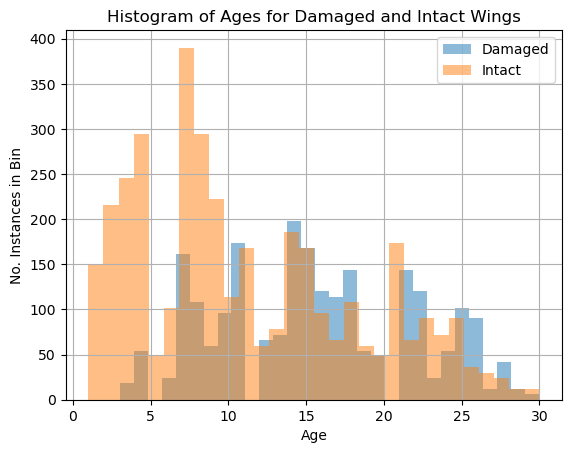

In [37]:
df[df['Damaged?']]['Age'].hist(bins=30, alpha=0.5, label='Damaged')
df[~df['Damaged?']]['Age'].hist(bins=30, alpha=0.5, label='Intact')
plt.legend()
plt.xlabel('Age')
plt.ylabel('No. Instances in Bin')
plt.title('Histogram of Ages for Damaged and Intact Wings')

<Axes: >

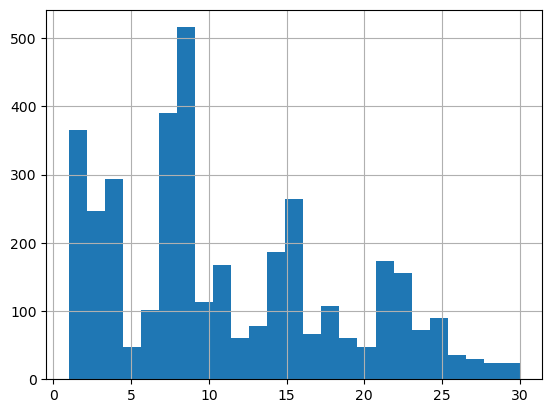

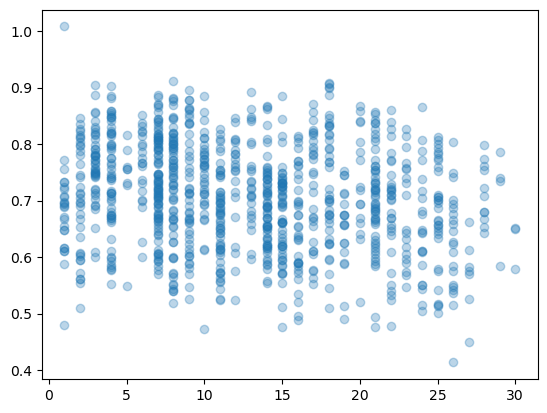

In [21]:
af = df[df['Cell'] == 'FWL']
plt.scatter(af['Age'],af['Area']/af['Perimeter'], alpha=0.3)

In [184]:
cf = df[df['Complexity'].map(len) > 0]
cf = cf.set_index('Filename')#(['Hive','BeeID','Date'])
for i in range(30):
    cf[i+1] = cf['Complexity'].map(lambda x: x[i])
cf = cf[list(range(1,31))]

cf['Age'] = cf.reset_index()['Filename'].map(df.drop_duplicates(subset=['Filename']).set_index('Filename')['Age']).values
cf['BeeType'] = cf.reset_index()['Filename'].map(df.drop_duplicates(subset=['Filename']).set_index('Filename')['Bee_type']).values

cf

,1,2,3,4,5,6,7,8,9,10,...,23,24,25,26,27,28,29,30,Age,BeeType
Filename,,,,,,,,,,,,,,,,,,,,,
2024_06_28_h13b30.png,0.279427,0.235899,0.113234,0.085314,0.062558,0.055078,0.048246,0.033655,0.028303,0.026071,...,0.013366,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,Forager
2024_07_16_h23b11.png,0.310058,0.245425,0.102118,0.080754,0.064112,0.055567,0.048825,0.035316,0.029601,0.025892,...,0.011486,0.011236,0.010769,0.010388,0.010030,0.009967,0.009581,0.009161,15.0,Nester
2024_06_27_h01b36.png,0.308680,0.230354,0.096769,0.080424,0.060420,0.046306,0.041100,0.032474,0.026582,0.024341,...,0.009558,0.008987,0.008588,0.008582,0.008277,0.007936,0.007748,0.007583,24.0,Nester
2024_06_21_h05b13.png,0.288375,0.245462,0.093590,0.073772,0.059347,0.048122,0.039053,0.032345,0.026489,0.022114,...,0.011227,0.010265,0.010004,0.009416,0.009293,0.008917,0.008877,0.008145,22.0,Nester
2024_06_18_h11b17.png,0.292531,0.225043,0.099687,0.076365,0.059519,0.046124,0.041525,0.032251,0.024851,0.021716,...,0.010821,0.010517,0.010212,0.009601,0.009203,0.008799,0.008621,0.008468,1.0,Flyer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024_07_24_h34b23.png,0.296240,0.224500,0.089646,0.072973,0.055677,0.042808,0.035870,0.029698,0.025900,0.022489,...,0.010687,0.009515,0.009183,0.009125,0.008848,0.008614,0.008155,0.008201,13.0,Flyer
2024_06_26_h11b10.png,0.303251,0.261678,0.134917,0.103346,0.087215,0.074460,0.057236,0.043842,0.040682,0.036630,...,0.014903,0.014416,0.013473,0.011791,0.011545,0.010692,0.009827,0.008986,12.0,Forager
2024_06_27_h01b41.png,0.315120,0.206183,0.117181,0.085297,0.065266,0.058783,0.055168,0.044212,0.034532,0.027154,...,0.012027,0.011285,0.010806,0.010554,0.010242,0.009417,0.009535,0.009635,24.0,Nester


/tmp/ipykernel_8423/425936605.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


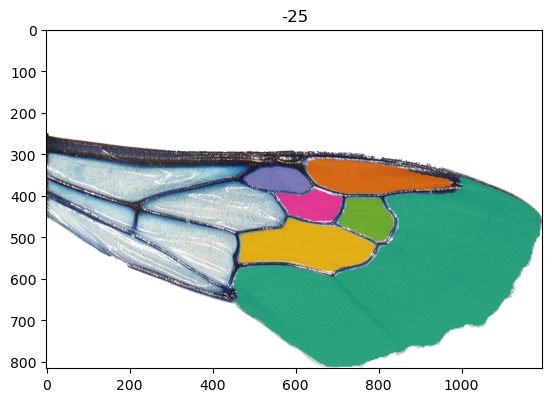

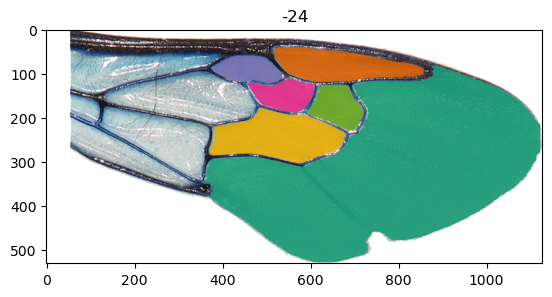

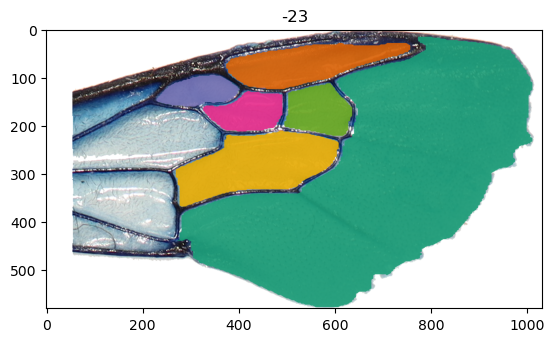

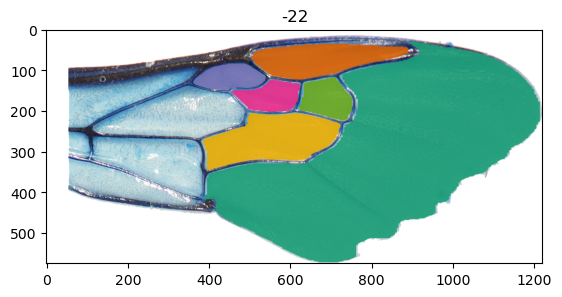

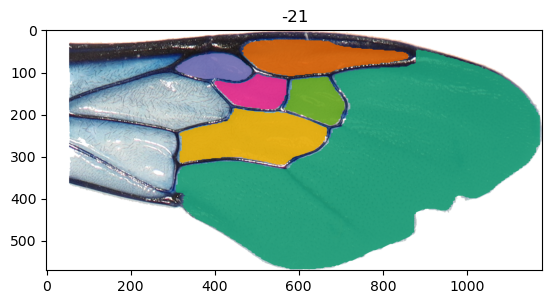

...

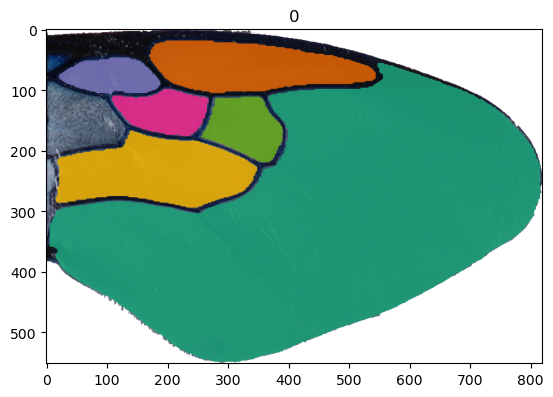

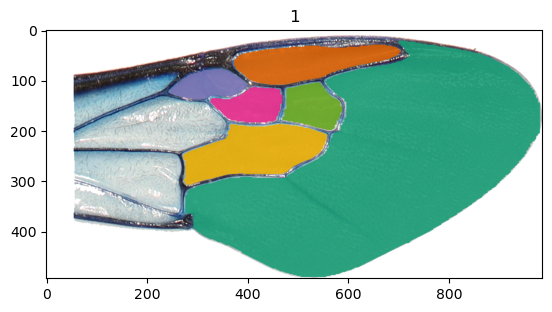

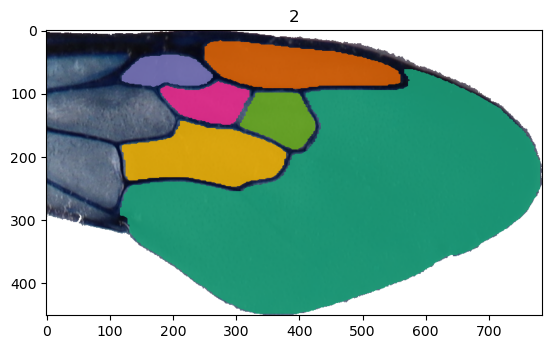

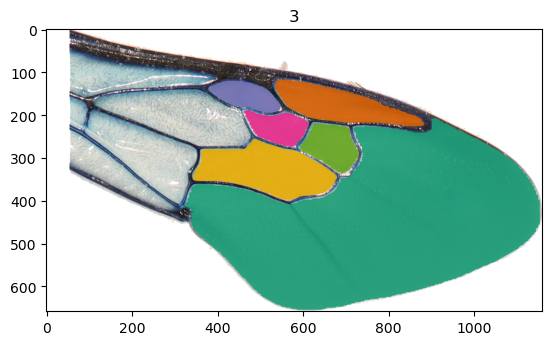

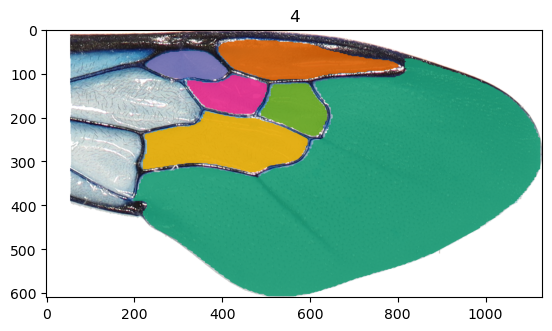

In [195]:
cf = cf.sort_values(25)
for i in range(-25,5):
    img = cv2.imread('../2_live_bees/9_UNet_predictions_resized_final_overlaid/' + cf.iloc[i].name)
    plt.figure()
    plt.imshow(img)
    plt.title(i)
    pass


/tmp/ipykernel_8423/836129537.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15,5))


<Figure size 1500x500 with 0 Axes>

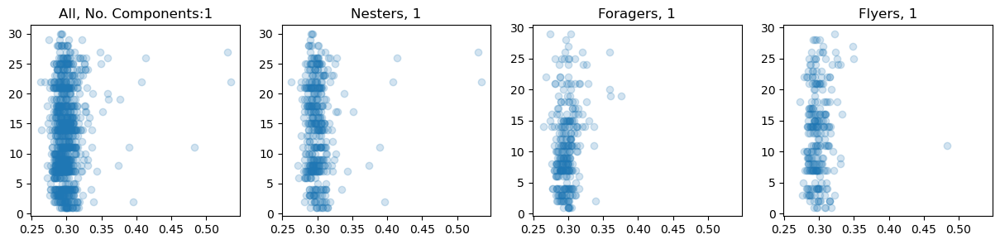

<Figure size 1500x500 with 0 Axes>

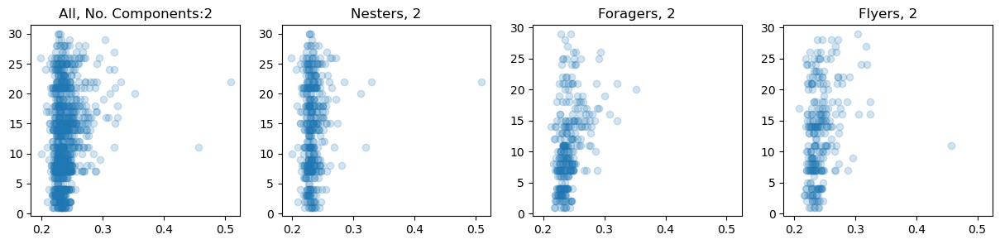

<Figure size 1500x500 with 0 Axes>

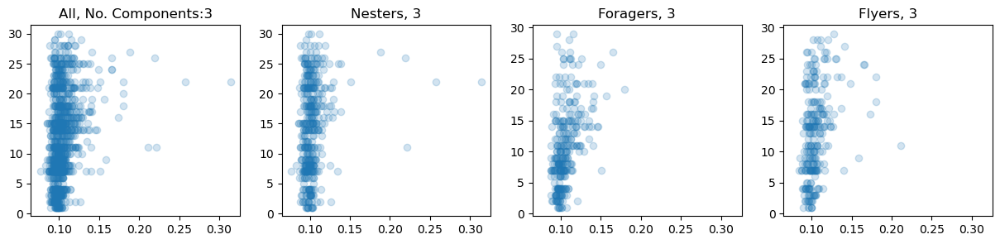

<Figure size 1500x500 with 0 Axes>

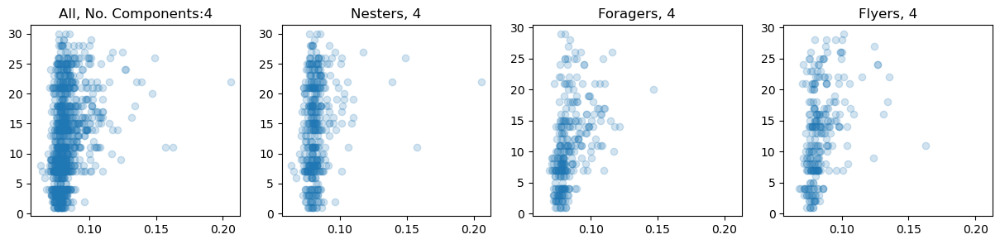

<Figure size 1500x500 with 0 Axes>

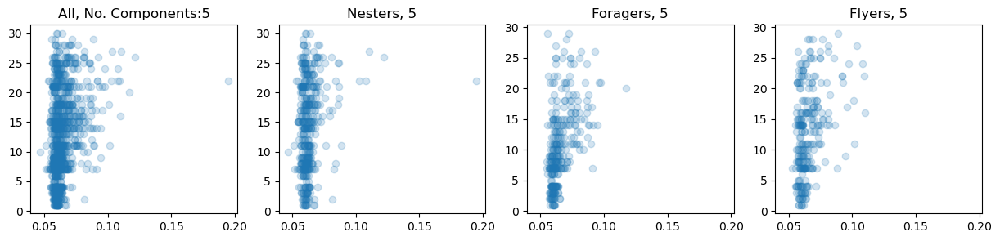

<Figure size 1500x500 with 0 Axes>

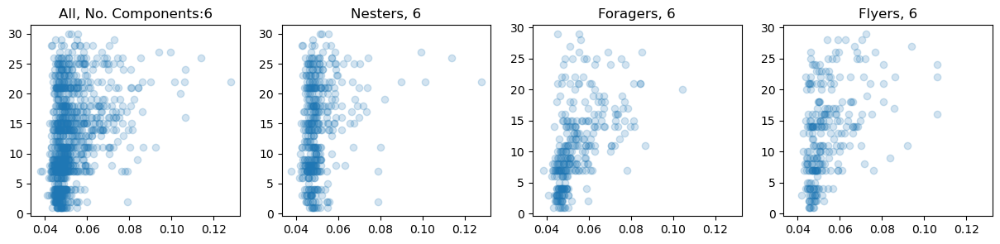

<Figure size 1500x500 with 0 Axes>

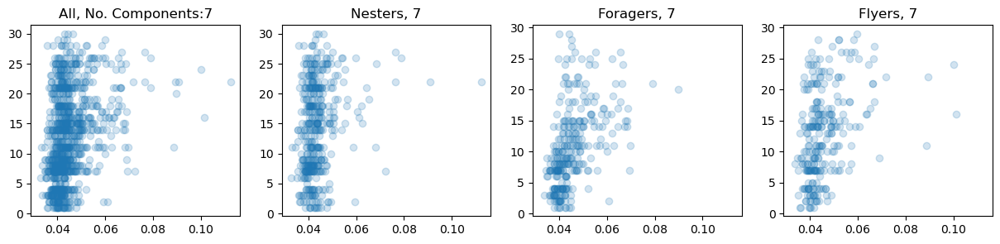

<Figure size 1500x500 with 0 Axes>

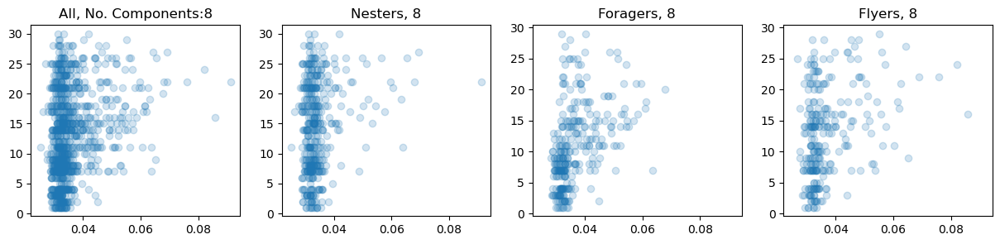

<Figure size 1500x500 with 0 Axes>

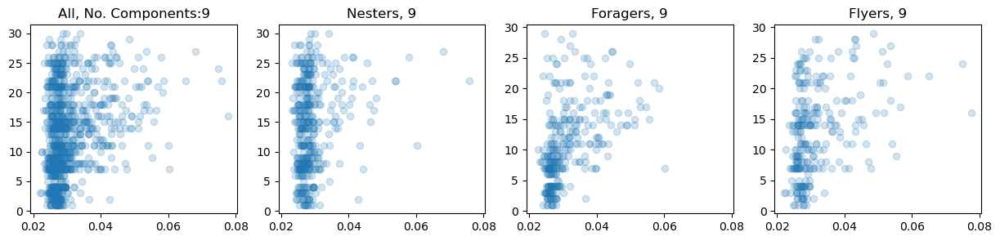

<Figure size 1500x500 with 0 Axes>

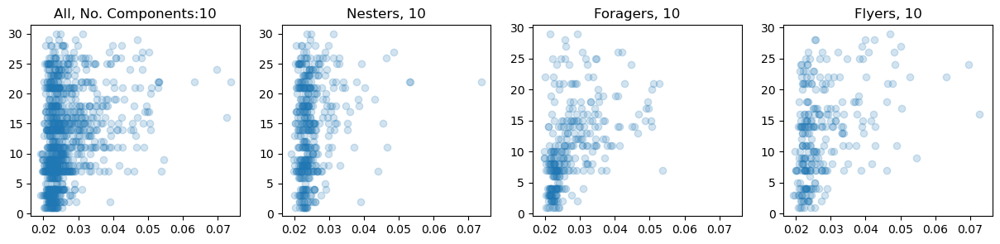

<Figure size 1500x500 with 0 Axes>

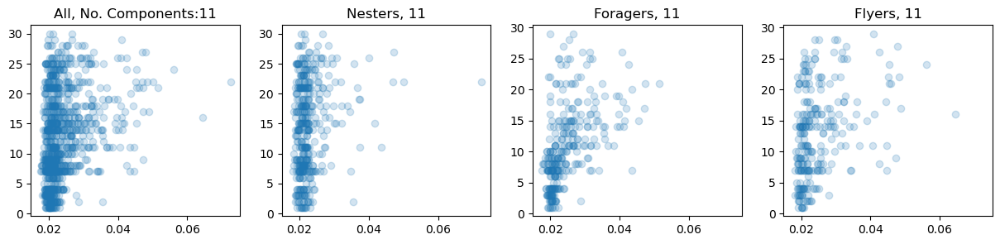

<Figure size 1500x500 with 0 Axes>

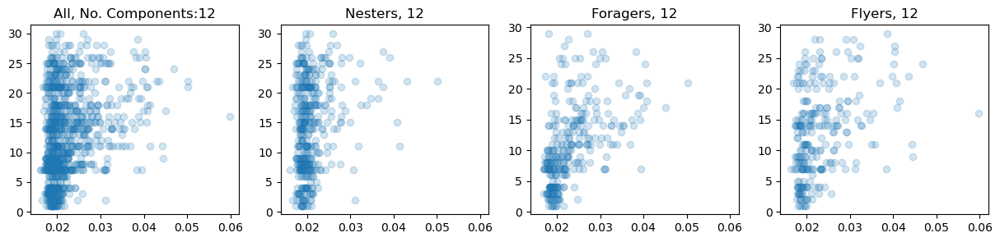

<Figure size 1500x500 with 0 Axes>

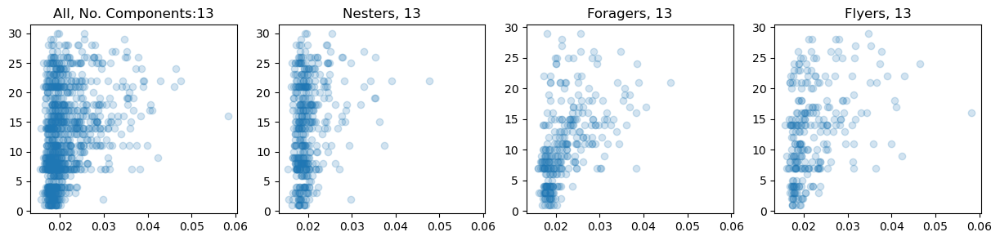

<Figure size 1500x500 with 0 Axes>

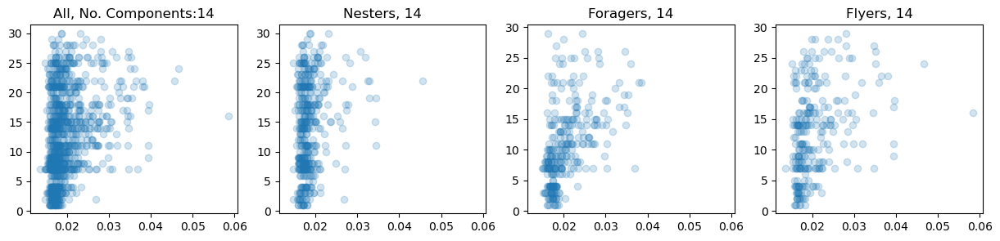

<Figure size 1500x500 with 0 Axes>

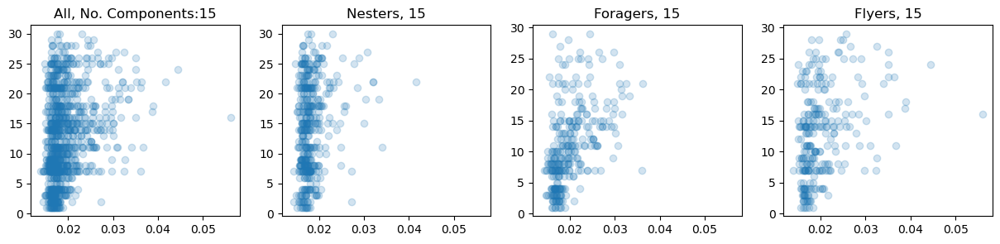

<Figure size 1500x500 with 0 Axes>

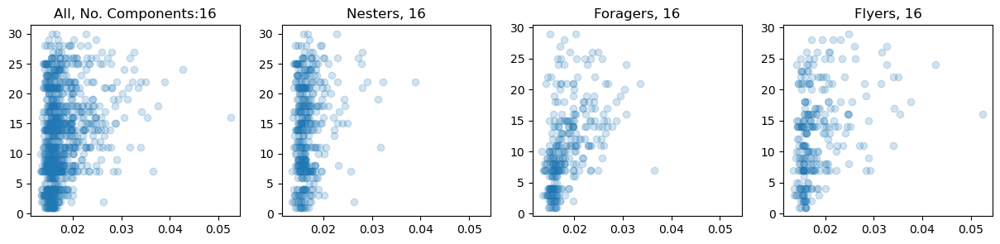

<Figure size 1500x500 with 0 Axes>

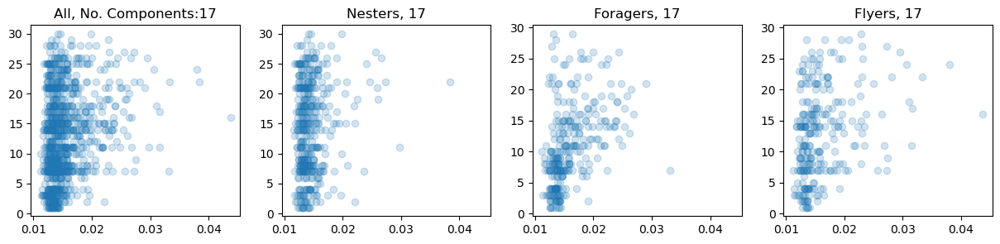

<Figure size 1500x500 with 0 Axes>

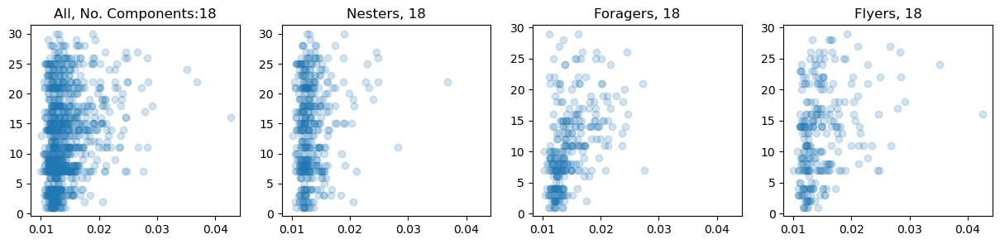

<Figure size 1500x500 with 0 Axes>

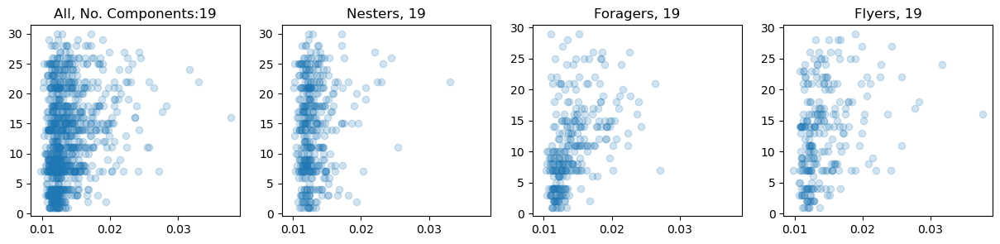

<Figure size 1500x500 with 0 Axes>

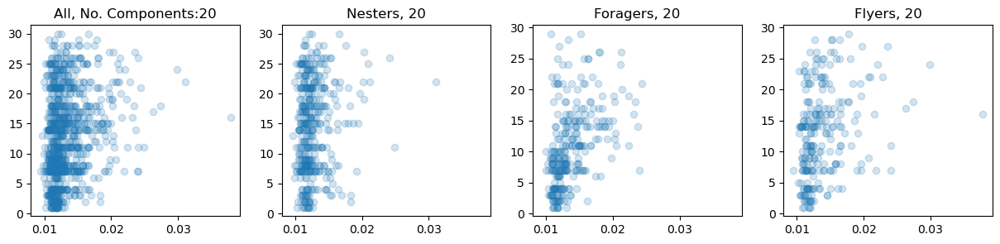

<Figure size 1500x500 with 0 Axes>

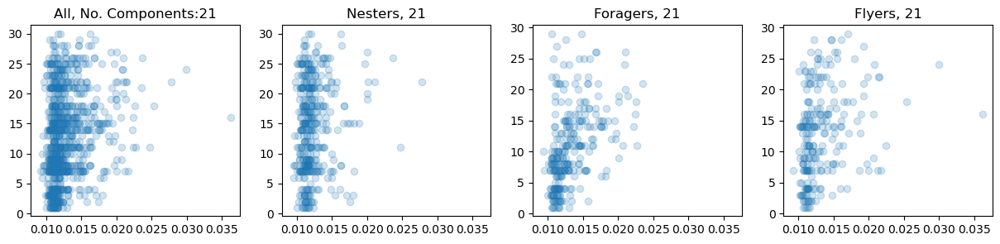

<Figure size 1500x500 with 0 Axes>

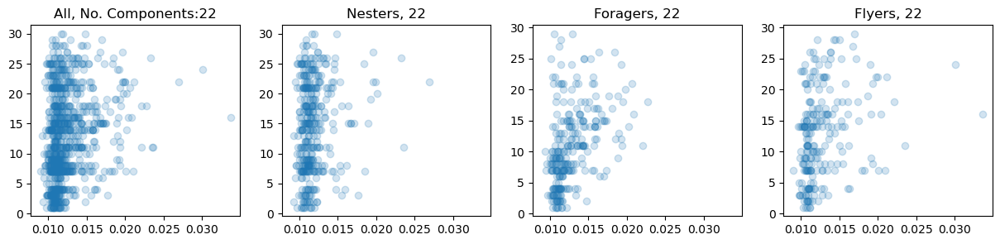

<Figure size 1500x500 with 0 Axes>

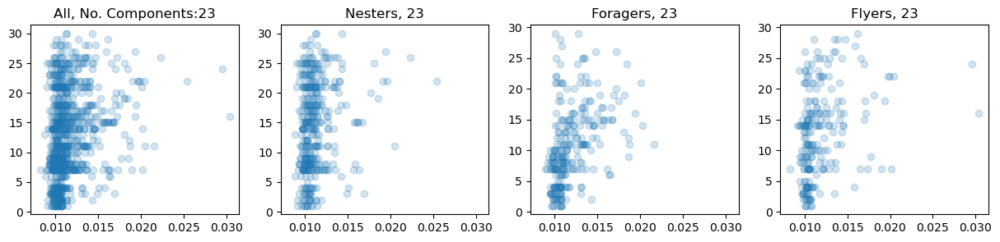

<Figure size 1500x500 with 0 Axes>

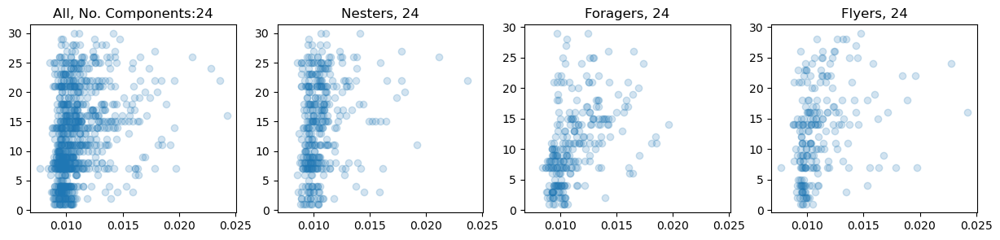

<Figure size 1500x500 with 0 Axes>

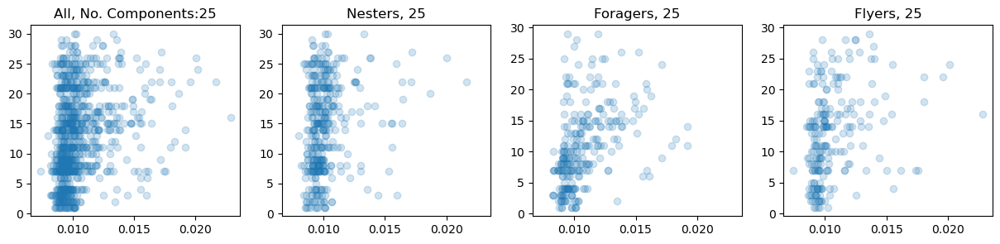

<Figure size 1500x500 with 0 Axes>

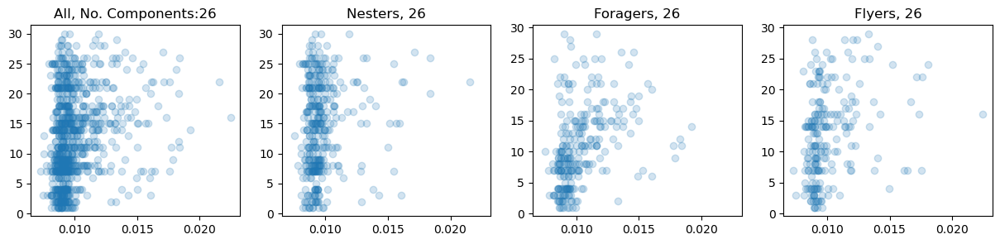

<Figure size 1500x500 with 0 Axes>

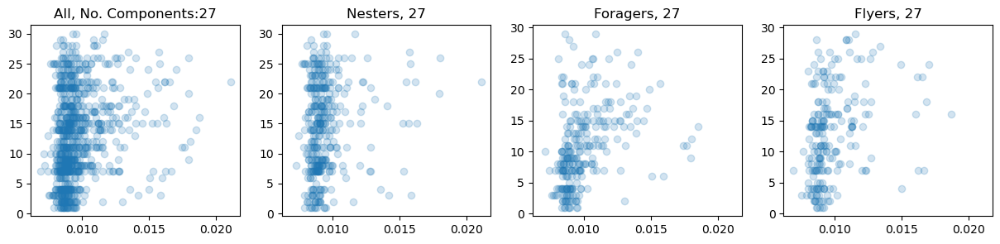

<Figure size 1500x500 with 0 Axes>

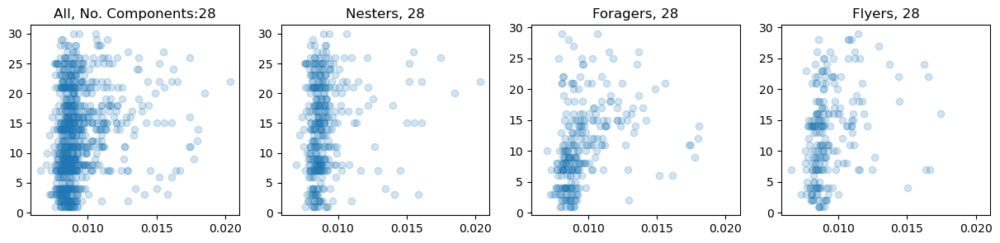

<Figure size 1500x500 with 0 Axes>

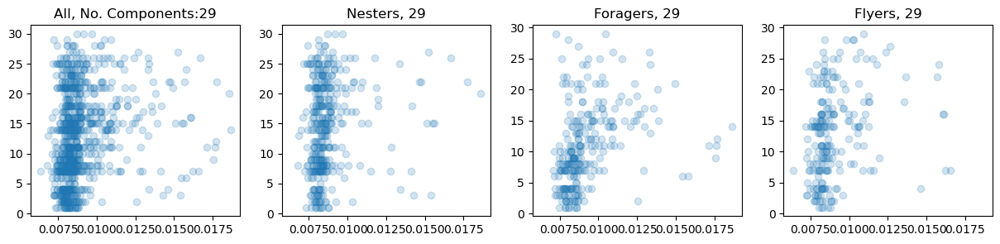

<Figure size 1500x500 with 0 Axes>

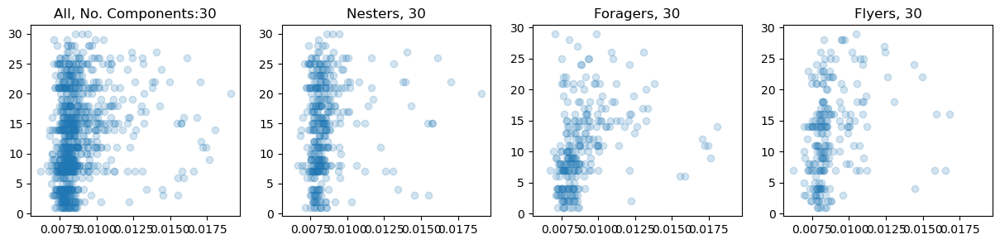

In [199]:
# plots

for n_circles in range(1,31):

    plt.figure(figsize=(15,5))
    fig, axs = plt.subplots(1, 4)
    fig.set_figwidth(15)
    fig.set_figheight(3)
    axs[0].scatter(cf[n_circles], cf['Age'], alpha=0.2)
    axs[0].set_title(f'All, No. Components:{n_circles}')

    nesters = cf[cf['BeeType'] == 'Nester']
    foragers = cf[cf['BeeType'] == 'Forager']
    flyers = cf[cf['BeeType'] == 'Flyer']

    #fig.set(xlabel='% area difference between approximation and FWL segmentation')

    for subset, subset_name, col in zip((nesters, foragers, flyers), ('Nesters','Foragers','Flyers'), (1,2,3)):
        axs[col].scatter(subset[n_circles], subset['Age'], alpha=0.2)
        axs[col].set_title(f'{subset_name}, {n_circles}')
        axs[col].sharex(axs[0])
    plt.savefig(f'{str(n_circles).zfill(2)}.png')

In [197]:
cf.to_csv('Fourier_Complexity.csv')

In [191]:
cf['Age'].dropna().to_csv('ages.csv')

In [144]:
df.drop_duplicates(subset=['Filename']).set_index('Filename')['Age']

Filename
2024_06_28_h13b30.png    11.0
2024_07_16_h23b11.png    15.0
2024_06_27_h01b36.png    24.0
2024_06_21_h05b13.png    22.0
2024_06_18_h11b17.png     1.0
                         ... 
2024_07_24_h34b23.png    13.0
2024_06_26_h11b10.png    12.0
2024_06_27_h01b41.png    24.0
2024_06_28_h13b24.png    14.0
2024_06_20_h03b10.png    21.0
Name: Age, Length: 1182, dtype: float64

In [11]:
# Estimate area loss
ref_wing = '2024_06_10_h02b62.png'
df[df['Filename'] == ref_wing]

,Filename,Hive,BeeID,Date,WingSide,X,Cell,Area,AreaLow,AreaHigh,Perimeter,PerimeterLow,PerimeterHigh
5148,2024_06_10_h02b62.png,2,62,2024-06-10,R,False,FWL,9.633,9.248,11.100,15.928,15.291,17.437
5149,2024_06_10_h02b62.png,2,62,2024-06-10,R,False,MC,0.911,0.875,1.050,5.681,5.453,6.219
5150,2024_06_10_h02b62.png,2,62,2024-06-10,R,False,1sMC,0.328,0.315,0.378,2.684,2.576,2.938
5151,2024_06_10_h02b62.png,2,62,2024-06-10,R,False,2sMC,0.383,0.368,0.442,2.831,2.718,3.099
5152,2024_06_10_h02b62.png,2,62,2024-06-10,R,False,3sMC,0.454,0.436,0.524,2.847,2.733,3.116
5153,2024_06_10_h02b62.png,2,62,2024-06-10,R,False,2MdC,1.244,1.194,1.433,5.666,5.440,6.203


In [40]:
areas

Cell                    1sMC   2MdC   2sMC   3sMC     FWL     MC
Hive BeeID Date                                                 
1    ww01  2024-06-05  0.314  1.250  0.356  0.449   9.964  0.993
           2024-06-19  0.341  1.236  0.388  0.447   9.302  0.932
           2024-06-27  0.343  1.261  0.391  0.445   9.311  0.995
     ww02  2024-06-11  0.391  1.330  0.400  0.434  10.070  0.945
           2024-06-27  0.502  1.759  0.538  0.573  13.184  1.320
...                      ...    ...    ...    ...     ...    ...
35   ww55  2024-07-19  0.549  2.215  0.656  0.793  17.038  1.463
           2024-07-30  0.484  1.945  0.577  0.710  15.115  1.337
     ww57  2024-07-19  0.528  2.141  0.656  0.746  16.811  1.534
           2024-07-23  0.514  2.110  0.658  0.713  16.832  1.465
           2024-07-30  0.531  2.128  0.662  0.733  17.232  1.441

[1181 rows x 6 columns]

In [41]:
areas = pd.pivot_table(df, index = ['Hive','BeeID','Date'], columns='Cell', values='Area')
ref_areas = areas.loc[2,'ww62',pd.to_datetime('2024-06-10',format="%Y-%m-%d").date()]
ref_FWL_2MdC_ratio = ref_areas['FWL']/ref_areas['2MdC']
ref_FWL_2sMC_ratio = ref_areas['FWL']/ref_areas['2sMC']
ref_FWL_3sMC_ratio = ref_areas['FWL']/ref_areas['3sMC']

ref_FWL_2MdC_ratio

7.743569131832797

(2.9015060240963853,
 (array([ 1.,  0.,  0.,  1.,  0.,  1.,  0.,  0.,  1.,  1.,  0.,  1.,  1.,
          0.,  0.,  2.,  0.,  2.,  0.,  1.,  1.,  0.,  1.,  1.,  1.,  0.,
          2.,  1.,  0.,  1.,  3.,  2.,  1.,  4.,  0.,  0.,  3.,  7.,  4.,
          3.,  0.,  2.,  3.,  3.,  2.,  4.,  4.,  4.,  7.,  8.,  9., 12.,
         14., 14., 18., 14., 20., 28., 27., 28., 28., 36., 36., 32., 36.,
         38., 39., 53., 44., 47., 38., 25., 37., 32., 29., 37., 23., 36.,
         30., 27., 33., 26., 24., 19., 17., 11., 17., 14.,  6., 10., 13.,
          4.,  5.,  2.,  3.,  3.,  0.,  2.,  0.,  1.]),
  array([2.11958511, 2.13113956, 2.142694  , 2.15424845, 2.1658029 ,
         2.17735734, 2.18891179, 2.20046623, 2.21202068, 2.22357512,
         2.23512957, 2.24668402, 2.25823846, 2.26979291, 2.28134735,
         2.2929018 , 2.30445624, 2.31601069, 2.32756513, 2.33911958,
         2.35067403, 2.36222847, 2.37378292, 2.38533736, 2.39689181,
         2.40844625, 2.4200007 , 2.43155515, 2.44310959, 2.4

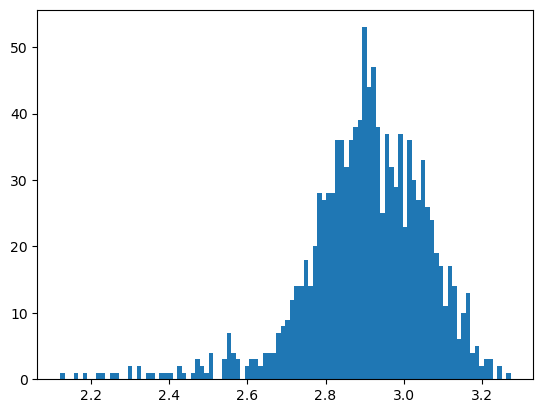

In [42]:
cella = 'FWL'
cellb = '2sMC'
cellc = '3sMC'
celld = '2MdC'
celle = 'MC'
cellf = '1sMC'
ref_areas[cella]/(ref_areas[cellb] + ref_areas[cellc] + ref_areas[celld] + ref_areas[celle] + ref_areas[cellf]), 
plt.hist(areas[cella] / (areas[cellb] + areas[cellc] + areas[celld] + areas[celle] + areas[cellf]), bins=100)

In [57]:
(areas[cella] / areas[cellb]).sort_values()

Hive  BeeID  Date      
3     44     2024-06-20    17.665158
13    32     2024-07-09    18.000000
15    14     2024-07-10    18.684385
             2024-07-03    18.821101
33    24     2024-08-02    18.929825
                             ...    
4     11     2024-06-07    29.798680
24    10     2024-07-10    30.694301
31    48     2024-07-17    33.734584
24    12     2024-07-10    38.541139
             2024-07-04    39.624390
Length: 1181, dtype: float64

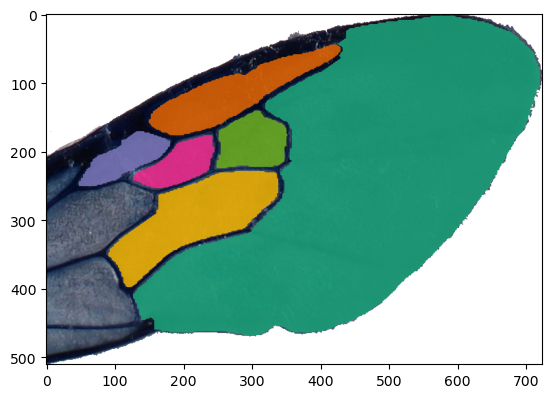

In [66]:
img = cv2.imread('../semantic_seg/wings/predictions_overlaid/2024_06_07_h04bee11.png')
plt.imshow(img)

In [ ]:
# Unimportant at the moment - slide images

In [132]:
# Find subset of slide images that are in the live bees set
relevant_slide_images = []

for name, row in tqdm(df.iterrows(),total=len(df)):
    hive_str = str(row['Hive']).zfill(2)
    bee_str = str(row['BeeID'])
    wing_side = 'left' if row['WingSide'] == 'L' else 'right'
    fps = glob(f'../1_slides/2_individual_wings/Hive{hive_str}_Sheet_*_slide*{bee_str}_{wing_side}.png')
    if len(fps) != 1:
        continue

    fp = fps[0]

    fn = Path(fp).name
    relevant_slide_images += [fn]



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6984/6984 [00:24<00:00, 279.58it/s]


In [178]:
#after going through relevant slides...
relevant_slide_images = ['Hive01_Sheet_01_slide12_right.png',
 'Hive01_Sheet_01_slide32_right.png',
 'Hive01_Sheet_01_slide50_right.png',
 'Hive01_Sheet_02_slide115_right.png',
 'Hive01_Sheet_02_slide40_left.png',
 'Hive01_Sheet_02_slideww13_right.png',
 'Hive01_Sheet_02_slideww16_right.png',
 'Hive01_Sheet_02_slideww19_right.png',
 'Hive01_Sheet_02_slideww26_right.png',
 'Hive01_Sheet_02_slideww30_right.png',
 'Hive01_Sheet_02_slideww33_right.png',
 'Hive01_Sheet_02_slideww36_right.png',
 'Hive01_Sheet_02_slideww37_right.png',
 'Hive01_Sheet_03_slideww10_right.png',
 'Hive01_Sheet_03_slideww46_right.png',
 'Hive02_Sheet_01_slide12_right.png',
 'Hive02_Sheet_01_slide21_left.png',
 'Hive02_Sheet_01_slide21_right.png',
 'Hive02_Sheet_01_slide43_right.png',
 'Hive02_Sheet_01_slide44_right.png',
 'Hive02_Sheet_02_slide65_right.png',
 'Hive02_Sheet_03_slideww10_left.png',
 'Hive02_Sheet_03_slideww10_right.png',
 'Hive02_Sheet_03_slideww17_right.png',
 'Hive02_Sheet_03_slideww34_right.png',
 'Hive02_Sheet_03_slideww41_right.png',
 'Hive02_Sheet_03_slideww42_right.png',
 'Hive02_Sheet_03_slideww46_left.png',
 'Hive02_Sheet_03_slideww46_right.png',
 'Hive02_Sheet_03_slideww63_right.png',
 'Hive03_Sheet_01_slide115_right.png',
 'Hive03_Sheet_01_slide12_right.png',
 'Hive03_Sheet_01_slide16_right.png',
 'Hive03_Sheet_01_slide21_right.png',
 'Hive03_Sheet_01_slideww17_left.png',
 'Hive03_Sheet_01_slideww17_right.png',
 'Hive03_Sheet_01_slideww29_left.png',
 'Hive03_Sheet_01_slideww41_right.png',
 'Hive03_Sheet_01_slideww73_right.png',
 'Hive05_Sheet_01_slide67_right.png',
 'Hive05_Sheet_01_slidewv16_right.png',
 'Hive05_Sheet_01_slideww39_left.png',
 'Hive05_Sheet_01_slideww39_right.png',
 'Hive05_Sheet_01_slideww42_right.png',
 'Hive05_Sheet_01_slideww48_right.png',
 'Hive05_Sheet_01_slideww62_left.png',
 'Hive05_Sheet_01_slideww62_right.png',
 'Hive05_Sheet_01_slideww64_right.png',
 'Hive05_Sheet_01_slideww82_right.png',
 'Hive05_Sheet_01_slideww87_right.png',
 'Hive05_Sheet_01_slideww90_right.png',
 'Hive05_Sheet_01_slideww92_right.png',
 'Hive05_Sheet_01_slideww95_right.png',
 'Hive11_Sheet_01_slide10_right.png',
 'Hive11_Sheet_01_slide11_right.png',
 'Hive11_Sheet_01_slide14_right.png',
 'Hive11_Sheet_01_slide15_right.png',
 'Hive11_Sheet_01_slide18_right.png',
 'Hive11_Sheet_01_slide19_right.png',
 'Hive11_Sheet_01_slide24_right.png',
 'Hive11_Sheet_01_slide26_right.png',
 'Hive11_Sheet_01_slide27_right.png',
 'Hive11_Sheet_01_slideww13_right.png',
 'Hive11_Sheet_01_slideww17_right.png',
 'Hive11_Sheet_01_slideww20_right.png',
 'Hive11_Sheet_01_slideww28_right.png',
 'Hive12_Sheet_01_slide13_right.png',
 'Hive12_Sheet_01_slide25_right.png',
 'Hive12_Sheet_01_slide26_right.png',
 'Hive12_Sheet_01_slide27_right.png',
 'Hive12_Sheet_01_slide30_right.png',
 'Hive12_Sheet_02_slideww10_right.png',
 'Hive12_Sheet_02_slideww19_right.png',
 'Hive12_Sheet_02_slideww23_right.png',
 'Hive12_Sheet_02_slideww37_right.png',
 'Hive12_Sheet_02_slideww41_right.png',
 'Hive12_Sheet_02_slideww43_right.png',
 'Hive13_Sheet_01_slide11_right.png',
 'Hive13_Sheet_01_slide14_right.png',
 'Hive13_Sheet_01_slide20_right.png',
 'Hive13_Sheet_01_slide21_right.png',
 'Hive13_Sheet_01_slide30_right.png',
 'Hive13_Sheet_01_slide33_right.png',
 'Hive13_Sheet_01_slide34_right.png',
 'Hive13_Sheet_01_slide35_right.png',
 'Hive13_Sheet_01_slide36_right.png',
 'Hive13_Sheet_02_slideww15_right.png',
 'Hive13_Sheet_02_slideww18_right.png',
 'Hive13_Sheet_02_slideww23_right.png',
 'Hive13_Sheet_02_slideww24_right.png',
 'Hive13_Sheet_02_slideww28_right.png',
 'Hive14_Sheet_01_slide13_right.png',
 'Hive14_Sheet_01_slide18_right.png',
 'Hive14_Sheet_01_slide20_right.png',
 'Hive14_Sheet_01_slideww12_right.png',
 'Hive14_Sheet_01_slideww21_right.png',
 'Hive14_Sheet_02_slideww28_right.png',
 'Hive14_Sheet_02_slideww32_right.png',
 'Hive14_Sheet_02_slideww33_right.png',
 'Hive14_Sheet_02_slideww35_right.png',
 'Hive14_Sheet_02_slideww36_right.png',
 'Hive14_Sheet_02_slideww37_right.png',
 'Hive14_Sheet_02_slideww39_right.png',
 'Hive14_Sheet_02_slideww40_right.png',
 'Hive15_Sheet_01_slide11_right.png',
 'Hive15_Sheet_01_slide12_right.png',
 'Hive15_Sheet_01_slide25_right.png',
 'Hive15_Sheet_01_slide26_right.png',
 'Hive15_Sheet_01_slide28_right.png',
 'Hive15_Sheet_01_slide32_right.png',
 'Hive15_Sheet_01_slide35_right.png',
 'Hive15_Sheet_02_slideww14_right.png',
 'Hive15_Sheet_02_slideww24_right.png',
 'Hive15_Sheet_02_slideww31_right.png',
 'Hive21_Sheet_01_slide12_right.png',
 'Hive21_Sheet_01_slide22_right.png',
 'Hive21_Sheet_01_slide24_right.png',
 'Hive21_Sheet_01_slide39_right.png',
 'Hive21_Sheet_01_slide40_right.png',
 'Hive21_Sheet_01_slide41_right.png',
 'Hive21_Sheet_01_slide53_right.png',
 'Hive21_Sheet_01_slideww27_right.png',
 'Hive22_Sheet_01_slide19_right.png',
 'Hive22_Sheet_01_slide24_right.png',
 'Hive22_Sheet_01_slide26_right.png',
 'Hive22_Sheet_01_slide33_right.png',
 'Hive22_Sheet_01_slideww11_right.png',
 'Hive22_Sheet_01_slideww12_right.png',
 'Hive22_Sheet_01_slideww13_right.png',
 'Hive22_Sheet_01_slideww16_right.png',
 'Hive23_Sheet_01_slide15_right.png',
 'Hive23_Sheet_01_slide18_right.png',
 'Hive23_Sheet_01_slideww21_right.png',
 'Hive24_Sheet_01_slide10_right.png',
 'Hive24_Sheet_01_slide12_right.png',
 'Hive24_Sheet_01_slide17_right.png',
 'Hive24_Sheet_01_slide19_right.png',
 'Hive24_Sheet_01_slide24_right.png',
 'Hive25_Sheet_01_slide14_right.png',
 'Hive25_Sheet_01_slide17_right.png',
 'Hive25_Sheet_01_slide38_right.png',
 'Hive25_Sheet_01_slide51_right.png',
 'Hive25_Sheet_01_slideww16_right.png',
 'Hive25_Sheet_01_slideww27_right.png',
 'Hive25_Sheet_01_slideww32_right.png',
 'Hive31_Sheet_01_slideww26_right.png',
 'Hive32_Sheet_01_slide20_right.png',
 'Hive32_Sheet_01_slide22_right.png',
 'Hive32_Sheet_01_slide38_right.png',
 'Hive32_Sheet_01_slide39_right.png',
 'Hive32_Sheet_01_slideww16_right.png',
 'Hive32_Sheet_01_slideww29_right.png',
 'Hive32_Sheet_01_slideww31_right.png',
 'Hive33_Sheet_01_slideww24_right.png',
 'Hive33_Sheet_01_slideww28_right.png',
 'Hive33_Sheet_01_slideww3_right.png',
 'Hive33_Sheet_01_slideww59_right.png',
 'Hive33_Sheet_01_slideww7_right.png',
 'Hive34_Sheet_01_slide39_right.png',
 'Hive34_Sheet_01_slide46_right.png',
 'Hive34_Sheet_01_slideww15_right.png',
 'Hive34_Sheet_01_slideww37_right.png',
 'Hive34_Sheet_01_slideww48_right.png',
 'Hive34_Sheet_01_slideww56_right.png']

In [179]:
fps = glob('../semantic_seg/wings/predictions_resized/*')

for fp in tqdm(fps):
    fn = Path(fp).name

    if fn.startswith('20'):
        continue
    
    if fn not in relevant_slide_images:
        continue
    
    date = np.nan
    hive_id = int(re.findall('(?<=Hive)[0-9]*(?=_)', fn)[0])
    bee_id = int(re.findall('(?<=slide)[0-9]+', fn.replace('ww','').replace('wv',''))[0])
    x = 'x' in fn
    
    cells_mask = cv2.imread('../semantic_seg/wings/predictions_resized/' + fn, cv2.IMREAD_GRAYSCALE)
    #plt.imshow(cells_mask*40)

    pixels_per_mm = 3359/53.4
    pixels_per_mm_max = 3367/53.4
    pixels_per_mm_min = 3352/53.4

    wing_side = 'L' if 'left' in fn else 'R'

    for cell_class in range(1,7):
        cell_name = class_to_name[cell_class]
        cell_mask = np.zeros(cells_mask.shape).astype('uint8')
        cell_mask[np.where(cells_mask == cell_class)] = 1
        biggest_contour = get_biggest_contour(cell_mask)

        #convert to polygon because i suspect this will make the calculation of the perimeter more accurate
        poly = Polygon(biggest_contour.squeeze())

        pixel_area_min = poly.area*0.96
        pixel_area_max = poly.area*1.04
        
        area = np.round(poly.area / (pixels_per_mm)**2,3)
        area_min = np.round(pixel_area_min / (pixels_per_mm_max)**2,3)
        area_max = np.round(pixel_area_max / (pixels_per_mm_min)**2,3)

        pixel_perimeter_min = poly.length*0.96
        pixel_perimeter_max = poly.length*1.04
        
        perimeter = np.round(poly.length / pixels_per_mm,3)
        perimeter_min = np.round(pixel_perimeter_min / pixels_per_mm_max,3)
        perimeter_max = np.round(pixel_perimeter_max / pixels_per_mm_min,3)

        #print(cell_class, area, area_min, area_max, perimeter, perimeter_min, perimeter_max)

        out += [[fn, hive_id, bee_id, date, wing_side, x, cell_name, area, area_min, area_max, perimeter, perimeter_min, perimeter_max]]
    
poly.area, poly.length

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5714/5714 [00:00<00:00, 6268.83it/s]


(6508.0, 406.16652224137096)

In [174]:
df

,Filename,Hive,BeeID,Date,WingSide,X,Cell,Area,AreaMin,AreaMax,Perimeter,PerimeterMin,PerimeterMax
0,2024_06_28_h13b30.png,13,30,2024-06-28,R,False,FWL,13.642,13.096,15.720,19.070,18.307,20.876
1,2024_06_28_h13b30.png,13,30,2024-06-28,R,False,MC,1.244,1.195,1.434,6.566,6.303,7.188
2,2024_06_28_h13b30.png,13,30,2024-06-28,R,False,1sMC,0.476,0.457,0.549,3.203,3.075,3.507
3,2024_06_28_h13b30.png,13,30,2024-06-28,R,False,2sMC,0.520,0.499,0.599,3.330,3.197,3.646
4,2024_06_28_h13b30.png,13,30,2024-06-28,R,False,3sMC,0.620,0.595,0.714,3.341,3.208,3.658
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10915,Hive13_Sheet_01_slide20_right.png,13,20,NaN,R,False,MC,1.226,1.171,1.280,6.656,6.375,6.937
10916,Hive13_Sheet_01_slide20_right.png,13,20,NaN,R,False,1sMC,0.470,0.449,0.491,3.288,3.149,3.427
10917,Hive13_Sheet_01_slide20_right.png,13,20,NaN,R,False,2sMC,0.563,0.538,0.588,3.440,3.294,3.585
10918,Hive13_Sheet_01_slide20_right.png,13,20,NaN,R,False,3sMC,0.611,0.584,0.639,3.405,3.262,3.549


In [184]:
df

,Filename,Hive,BeeID,Date,WingSide,X,Cell,Area,AreaLow,AreaHigh,Perimeter,PerimeterLow,PerimeterHigh
0,2024_06_28_h13b30.png,13,30,2024-06-28,R,False,FWL,13.642,13.096,15.720,19.070,18.307,20.876
1,2024_06_28_h13b30.png,13,30,2024-06-28,R,False,MC,1.244,1.195,1.434,6.566,6.303,7.188
2,2024_06_28_h13b30.png,13,30,2024-06-28,R,False,1sMC,0.476,0.457,0.549,3.203,3.075,3.507
3,2024_06_28_h13b30.png,13,30,2024-06-28,R,False,2sMC,0.520,0.499,0.599,3.330,3.197,3.646
4,2024_06_28_h13b30.png,13,30,2024-06-28,R,False,3sMC,0.620,0.595,0.714,3.341,3.208,3.658
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7963,Hive13_Sheet_01_slide20_right.png,13,20,NaN,R,False,MC,1.156,1.104,1.207,6.463,6.189,6.735
7964,Hive13_Sheet_01_slide20_right.png,13,20,NaN,R,False,1sMC,0.443,0.423,0.463,3.192,3.057,3.327
7965,Hive13_Sheet_01_slide20_right.png,13,20,NaN,R,False,2sMC,0.530,0.507,0.554,3.340,3.199,3.481
7966,Hive13_Sheet_01_slide20_right.png,13,20,NaN,R,False,3sMC,0.576,0.551,0.602,3.306,3.167,3.446


In [182]:
df[(df['Hive'] == 13) & (df['BeeID'] == 20) & (df['Cell'] == '2sMC')]#.sort_values('Date')


,Filename,Hive,BeeID,Date,WingSide,X,Cell,Area,AreaMin,AreaMax,Perimeter,PerimeterMin,PerimeterMax
3621,2024_07_02_h13b20.png,13,20,2024-07-02,R,False,2sMC,0.571,0.548,0.658,3.553,3.411,3.890
4347,2024_06_28_h13b20.png,13,20,2024-06-28,R,False,2sMC,0.540,0.519,0.623,3.382,3.247,3.703
7965,Hive13_Sheet_01_slide20_right.png,13,20,NaN,R,False,2sMC,0.530,0.507,0.554,3.340,3.199,3.481


In [185]:
df.to_csv('areas_and_perimeters.csv')

In [109]:
df.groupby(['Hive','BeeID']).count()['Date'].sort_values()

Hive  BeeID
5     45        6
12    13        6
34    35        6
      36        6
      38        6
               ..
14    22       24
      33       24
15    19       24
      4        24
3     17       30
Name: Date, Length: 610, dtype: int64

In [120]:
df[(df['Hive'] == 15) & (df['BeeID'] == 19) & (df['Cell'] == '2sMC')].sort_values('Date')

,Filename,Hive,BeeID,Date,WingSide,X,Cell,Area,AreaMin,AreaMax,Perimeter,PerimeterMin,PerimeterMax
6441,2024_06_21_h15b19.png,15,19,2024-06-21,R,False,2sMC,0.567,0.544,0.653,3.483,3.344,3.813
651,2024_06_25_h15b19.png,15,19,2024-06-25,R,False,2sMC,0.522,0.501,0.602,3.361,3.227,3.680
2403,2024_07_03_h15b19.png,15,19,2024-07-03,R,False,2sMC,0.605,0.581,0.698,3.611,3.466,3.953
6009,2024_07_10_h15b19.png,15,19,2024-07-10,R,False,2sMC,0.594,0.570,0.684,3.512,3.371,3.845


In [63]:
pixels_per_mm**2

13409.64